## Жёлтое такси в Нью-Йорке. Часть 4
Финальный проект специализации __Машинное обучение и анализ данных от Яндекса и МФТИ.__

__Задача проекта__ — научиться предсказывать количество поездок в ближайшие часы в каждом районе Нью-Йорка. Для обучения использовались данные с мая 2014 г. по май 2016 г. Прогнозы составлены на июнь 2016 г.

In [4]:
# !pip install watermark
%load_ext watermark

In [5]:
%watermark -v -m -p numpy,scipy,pandas,matplotlib -g

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.28.0

numpy     : 1.20.1
scipy     : 1.6.2
pandas    : 1.2.2
matplotlib: 3.4.3

Compiler    : GCC 9.3.0
OS          : Linux
Release     : 5.4.0-88-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

Git hash: c50181e5e8933692ad4ee35170dd09f80339833d



In [6]:
# For compatibility with future Python versions
from __future__ import division

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Main system library importing
import os
import sys
import time
from tqdm.autonotebook import tqdm

# Main modelling libraries importing
import numpy as np
import pandas as pd
import holidays
import datetime

# Main statistical library importing
from scipy import stats as sts
import statsmodels.api as sm
from itertools import product
from collections import Counter

# Main visual library importing
# Standard visualize
import matplotlib.image as pltimg
import matplotlib.cm as cm
from matplotlib import pylab as plt
import matplotlib.patches as mpatches

# To create pipeline functions
from joblib import dump, load

# Normilizers
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Dimension decreasers
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import MDS, TSNE
from sklearn.random_projection import SparseRandomProjection

# Clusteres
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors

#TimeSeries Clusteres
from tslearn.clustering import TimeSeriesKMeans

# Clustering metrics
from sklearn.metrics import silhouette_samples, silhouette_score, pairwise_distances

### Препроцессинг

In [ ]:
dir_with_count_data = os.path.join(os.path.dirname(os.path.dirname(os.path.abspath('file'))), 'count_data')
files_with_count_data = os.listdir(dir_with_count_data)
files_with_count_data.sort()
target_file = files_with_count_data[-1]
files_with_count_data

In [ ]:
# Получение списка часов в месяце.
def get_hours(date_string):
    now_date = datetime.datetime.strptime(date_string, '%Y-%m-%d %H:%M:%S')
    now_date = now_date.replace(day=1, hour=0, minute=0, second=0)
    target_month = now_date.month
    now_month = now_date.month
    res_list = []
    while now_month == target_month:
        res_list.append(now_date.strftime('%Y-%m-%d %H:%M:%S'))
        now_date = now_date + datetime.timedelta(hours=1)
        now_month = now_date.month
    return res_list

In [ ]:
# Склеиваем датафреймы.
data = None
num_col = 0
hours = 0
for file in files_with_count_data:
    filename = os.path.join(dir_with_count_data, file)
    if data is None:
        data = pd.read_csv(filename, sep=',', header=0, index_col=0)
        num_col += data.shape[1]
        hours += (len(get_hours(data.columns[5])))
        continue
    add_data = pd.read_csv(filename, sep=',', header=0, index_col=0)
    add_data = add_data.iloc[:, 5:]
    hours += (len(get_hours(add_data.columns[0])))
    num_col += add_data.shape[1]
    data = pd.concat([data, add_data], axis=1)

In [ ]:
# Проверка
print(data.shape)
print(hours+5)
print(num_col)

In [ ]:
num_of_zones = data.shape[0]
num_of_zeros_zones = 0
drop_indexes = [] # Список ненужных строк
trips = np.array(data.iloc[:, 5:])
for i in range(trips.shape[0]):
    if trips[i].sum() == 0:
        num_of_zeros_zones += 1
        drop_indexes.append(i)
print('Всего {} зон. Количество зон без поездок - {}.'.format(num_of_zones, num_of_zeros_zones))

In [ ]:
# Доверительный интервал. Принимает одномерный массив, возвращает верхнюю границу.
def t_interval(arr):
    mean = arr.mean()
    std = arr.std(ddof=1)
    interval = _tconfint_generic(mean, std, len(arr), 0.05, 'two-sided')
    return interval[1]

In [ ]:
drop_ids = []
for index, row in data.iterrows():
    arr = np.array(row)[5:]
    if arr.mean() < 5:
        drop_ids.append(index)
data.drop(index=drop_ids, inplace=True)
print('Количество ячеек со средним числом поездок меньшим пяти - {}'.format(str(len(drop_ids))))
print('Количество оставшихся ячеек - {}'.format(data.shape[0]))

In [ ]:
filename = os.path.join(os.path.dirname(os.path.dirname(os.path.abspath('file'))), 'all_count.csv')
filename

In [ ]:
data.to_csv(filename, sep=',', header=True, index=False)

In [ ]:
data.head()

In [4]:
# Получение списка имён колонок по датам.
def get_dates_names(dates_list, min_date, max_date):
    res = list(filter(lambda x: x>= datetime.datetime.strptime(min_date, '%Y-%m-%d %H:%M:%S') and 
                      x < datetime.datetime.strptime(max_date, '%Y-%m-%d %H:%M:%S'), 
                      dates_list))
    return [i.strftime('%Y-%m-%d %H:%M:%S') for i in res]
    return res

In [5]:
def decrease_dimension(data, num_of_components, random_state, model_preds=None):
    fig, axs = plt.subplots(2, 3, figsize=(20, 15))

    # Рассмотрим несколько самых популярных методов понижения размерности
    obs = [
           # Метод случайных проекций - линейный
           SparseRandomProjection(num_of_components, random_state=random_state),
           # Метод главных компонент - линейный
           PCA(num_of_components, random_state=random_state),
           # Метод сингулярного разложения - линейный
           TruncatedSVD(num_of_components, random_state=random_state),
           # Метод t-stochastic neighbour embedding - нелинейный, с инициализацией pca
           TSNE(num_of_components, random_state=random_state, init="pca"),
           # Метод t-stochastic neighbour embedding - нелинейный, с инициализацией random
           TSNE(num_of_components, random_state=random_state, init="random"),
           # Метод многомерного шкалирования - нелинейный
           MDS(num_of_components, random_state=random_state)
          ]

    titles = ['Random projection', 'PCA', 'TruncatedSVD', 'TSNE(pca)', 'TSNE(random)', 'MDS']
    for i in range(len(obs)):
        points = obs[i].fit_transform(data)
        ax = axs[i % 2, i % 3]
        ax.scatter([j[0] for j in points], [j[1] for j in points], c=model_preds)
        ax.set_title(titles[i])

In [6]:
def draw_counter_bar(model_preds):
    print(Counter(model_preds))

    fig, ax = plt.subplots(figsize=(5, 5))
    x = list(Counter(sorted(model_preds)).keys())
    y = list(Counter(sorted(model_preds)).values())
    ax.bar(x, y)

    plt.show()

In [7]:
def draw_save_map(model_preds, filename):
    fig, axs = plt.subplots(1, len(set(model_preds)))
    for i in set(model_preds):
        ax = axs[i]
        title = 'Кластер {}'.format(i)
        colr = colors.to_rgb(color_hex[i])
        ax.imshow([[colr for x in range(20)] for y in range(20)])
        ax.set_title(title)
        ax.axis('off')
    plt.show()


    # Карта
    m = folium.Map(location=[40.75, -73.96],  
                   zoom_start=11, 
                   png_enabled=False)

    coord_data = np.array(data.iloc[:, :5])

    features = []
    for i in range(data.shape[0]):

        west = coord_data[i][1]
        east = coord_data[i][2]
        south = coord_data[i][3]
        north = coord_data[i][4]

        left_down = (south, west)
        left_up = (north, west)
        right_up = (north, east)
        right_down = (south, east)

        color = color_hex[model_preds[i]]
        folium.vector_layers.Rectangle([left_down, left_up, right_up, right_down], 
                                       popup=None, 
                                       tooltip=f'Кластер {model_preds[i]}', 
                                       fill=True, 
                                       fill_color=color, 
                                       fill_opacity=0.5,
                                       stroke=True, 
                                       color='black', 
                                       weight=1, 
                                       opacity=0.3).add_to(m)
    
    # Сохраняем карту в формате html
    m.save('{}.html'.format(filename))


    # Сохраняем в png
    outdir = os.path.dirname(os.path.abspath('file'))
    url = f"file://{os.getcwd()}/{filename}.html"
    outfn = os.path.join(outdir, f"{filename}.png")
    com = f'cutycapt --url={url} --out={outfn} --delay=1000 --plugins=on --javascript=on --js-can-access-clipboard=on --java=on'
    os.system(com)
    
    # Печатаем
    plt.figure(figsize=(18, 15))
    map_image = pltimg.imread(f"{filename}.png")
    plt.imshow(map_image)
    plt.axis('off')
    plt.show()

In [8]:
def siluette_check(data,  
                   clusterer_name="KMeans",
                   random_state=42,
                   num_of_dimensions=2,
                   eps_=27,
                   min_samples_=2
                  ):
    
    # Массив перебераемых значений количества кластеров
    range_n_clusters = [2, 3, 4, 5, 6, 7]

    for n_clusters in range_n_clusters:
        # Создаем сабплот
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # 1ый график для критерия силуэт
        # По определению значение критерия лежит от -1 до 1. Примем субъективное ограничение от 0 до 1
        ax1.set_xlim([0, 1])
        # Добавим небольшое смещение для графика, чтобы было удобнее их различать
        ax1.set_ylim([0, len(vals) + (n_clusters + 1) * 10])

        # Лейблы от конкретной модели кластеризации
        if clusterer_name == "KMeans":
            clusterer = KMeans(n_clusters=n_clusters, 
                               random_state=random_state)
        elif clusterer_name == "EM":
            clusterer = GaussianMixture(n_components=n_clusters, 
                                        covariance_type='diag', 
                                        random_state=random_state)
        elif clusterer_name == "AGH":
            clusterer = AgglomerativeClustering(n_clusters=n_clusters, 
                                                affinity='euclidean', 
                                                linkage='ward')
        elif clusterer_name == "TimeSeriesKMeans":
            clusterer = TimeSeriesKMeans(n_clusters=n_clusters, 
                                         metric='euclidean', 
                                         random_state=random_state)
            
        cluster_labels = clusterer.fit_predict(data)

        # Подсчитаем среднее значение силэута для всей выборки при помощи silhouette_score
        # Это дает представление о плотности и разделении сформированных кластеров
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Подсчитаем значение силэута для выборки при помощи silhouette_samples
        sample_silhouette_values = silhouette_samples(data, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):

            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        # Понижение размерности для визуализации
        dimension_decreaser = TSNE(num_of_dimensions, 
                                   random_state=random_state, 
                                   init="random"
                                  )

        points = dimension_decreaser.fit_transform(vals)

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            [j[0] for j in points], [j[1] for j in points], 
            marker="o", s=100, lw=0, c=colors, edgecolor="k"
        )

        ax2.set_title("The visualization of the clustered data with TSNE")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            f"Silhouette analysis for {clusterer_name} on sample data with n_clusters = {n_clusters}",
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

### Чтение данных, составление таблицы
Возьмем данные декабря 2015-го по апрель 2016-го года. Отдельно возьмем май 16-го и июнь 16-го.

In [9]:
# dir_with_data = os.path.abspath('/media/tater/MainStorage/TaxiRoutes')
# filename = os.path.join(dir_with_data, 'all_count.csv')
# filename

In [10]:
data = pd.read_csv("all_count.csv", sep=',', header=0, 
                   date_parser=lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))

In [11]:
data.head()

,region,west,east,south,north,2014-05-01 00:00:00,2014-05-01 01:00:00,2014-05-01 02:00:00,2014-05-01 03:00:00,2014-05-01 04:00:00,...,2016-05-31 14:00:00,2016-05-31 15:00:00,2016-05-31 16:00:00,2016-05-31 17:00:00,2016-05-31 18:00:00,2016-05-31 19:00:00,2016-05-31 20:00:00,2016-05-31 21:00:00,2016-05-31 22:00:00,2016-05-31 23:00:00
0,1075,-74.022246,-74.011135,40.697437,40.705825,36.0,19.0,9.0,2.0,7.0,...,124.0,105.0,80.0,84.0,106.0,106.0,99.0,84.0,83.0,34.0
1,1076,-74.022246,-74.011135,40.705825,40.714213,52.0,34.0,16.0,7.0,9.0,...,214.0,208.0,156.0,202.0,213.0,167.0,166.0,173.0,98.0,77.0
2,1077,-74.022246,-74.011135,40.714213,40.722601,41.0,25.0,13.0,2.0,4.0,...,104.0,69.0,67.0,109.0,173.0,171.0,165.0,107.0,127.0,58.0
3,1125,-74.011135,-74.000023,40.697437,40.705825,56.0,27.0,17.0,4.0,11.0,...,96.0,70.0,68.0,109.0,126.0,88.0,65.0,78.0,94.0,53.0
4,1126,-74.011135,-74.000023,40.705825,40.714213,174.0,83.0,56.0,36.0,37.0,...,205.0,213.0,168.0,250.0,281.0,293.0,301.0,256.0,174.0,118.0


In [12]:
dates = [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in data.columns[5:]]

In [13]:
dec_apr_data = data[list(data.columns[:5]) + 
                    get_dates_names(dates, '2015-12-01 00:00:00', '2016-05-01 00:00:00')]
dec_apr_data.columns = list(dec_apr_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in dec_apr_data.columns[5:]]
may_data = data[list(data.columns[:5]) + 
                get_dates_names(dates, '2016-05-01 00:00:00', '2016-06-01 00:00:00')]
may_data.columns = list(may_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in may_data.columns[5:]]

In [14]:
# Повернем таблицу, убрем лишние строки.
data_for_clustering = dec_apr_data.transpose()
data_for_clustering.columns = np.array(data.region)
data_for_clustering = data_for_clustering.iloc[5:, :]
data_for_clustering.head()

,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
2015-12-01 00:00:00,19.0,43.0,26.0,76.0,91.0,129.0,202.0,230.0,212.0,56.0,...,3.0,0.0,2.0,97.0,29.0,96.0,16.0,246.0,31.0,118.0
2015-12-01 01:00:00,16.0,22.0,12.0,29.0,71.0,84.0,89.0,118.0,177.0,18.0,...,7.0,0.0,0.0,2.0,0.0,17.0,4.0,104.0,5.0,75.0
2015-12-01 02:00:00,8.0,19.0,3.0,9.0,21.0,42.0,76.0,99.0,180.0,14.0,...,5.0,0.0,0.0,0.0,0.0,4.0,1.0,28.0,0.0,0.0
2015-12-01 03:00:00,3.0,12.0,5.0,7.0,17.0,33.0,45.0,93.0,136.0,12.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0
2015-12-01 04:00:00,2.0,12.0,3.0,7.0,21.0,33.0,27.0,62.0,80.0,3.0,...,4.0,1.0,0.0,4.0,2.0,2.0,0.0,23.0,1.0,15.0


### Стандартизация данных

In [15]:
data_for_clustering[data_for_clustering.columns] = StandardScaler().fit_transform(data_for_clustering)
data_for_clustering.head()

,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
2015-12-01 00:00:00,-1.059249,-1.059793,-0.967507,0.263459,-0.896916,-0.967658,-0.534278,-0.547410,-0.756211,-0.984693,...,-0.407136,-0.872440,-0.612507,-0.694292,-1.055433,0.172806,0.827983,1.526366,0.095599,1.402640
2015-12-01 01:00:00,-1.137490,-1.313825,-1.209043,-0.897258,-1.100342,-1.282486,-1.187228,-1.099971,-0.905581,-1.501337,...,0.475093,-0.872440,-0.965776,-1.320248,-1.282767,-1.198001,-0.666935,-0.364634,-0.938190,0.270499
2015-12-01 02:00:00,-1.346132,-1.350115,-1.364316,-1.391179,-1.608908,-1.576325,-1.262346,-1.193709,-0.892778,-1.555720,...,0.033978,-0.872440,-0.965776,-1.333426,-1.282767,-1.423577,-1.040665,-1.376718,-1.136996,-1.704166
2015-12-01 03:00:00,-1.476534,-1.434792,-1.329811,-1.440572,-1.649593,-1.639290,-1.441474,-1.223310,-1.080558,-1.582912,...,0.475093,-0.872440,-0.965776,-1.333426,-1.282767,-1.492985,-1.165242,-1.083747,-1.136996,-1.704166
2015-12-01 04:00:00,-1.502614,-1.434792,-1.364316,-1.440572,-1.608908,-1.639290,-1.545484,-1.376252,-1.319551,-1.705275,...,-0.186579,-0.791252,-0.965776,-1.307070,-1.267089,-1.458281,-1.165242,-1.443303,-1.097235,-1.309233


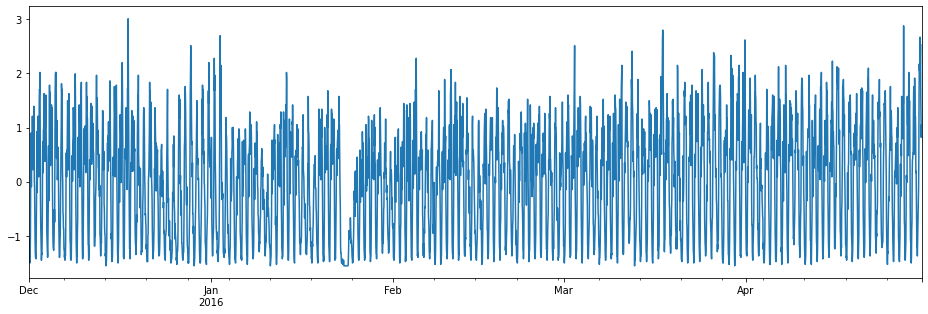

In [16]:
# Посмотрим на какой-нибудь график
fig, ax = plt.subplots(figsize=(16,5))
data_for_clustering[1075].plot()
plt.show()

### Кластеризация

#### Понижение размерности.

Попробуем понизить размерность до двух, и напечатать результаты на плоскости.  
Применим методы случайных и главных компонент, Truncated SVD, MDS, TSNE.

In [17]:
# Векторизируем значения временных рядов
vals = np.array(data_for_clustering).T
# До какой размерности понижаем
num_of_components = 2
# Зафиксируем состояние
random_state = 42

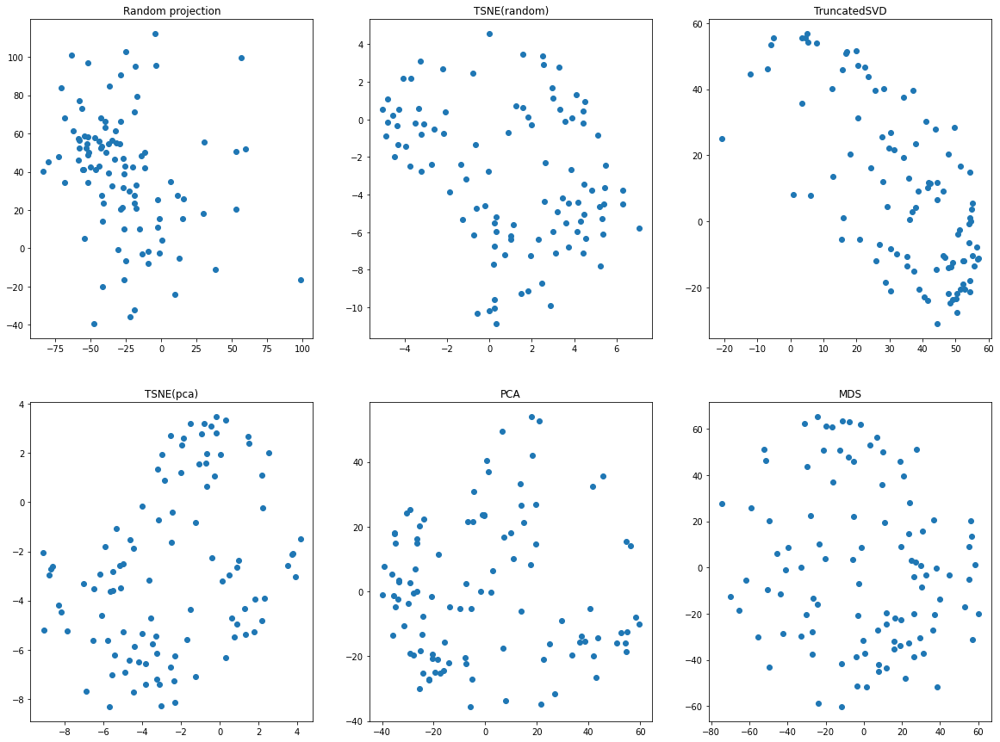

In [18]:
decrease_dimension(vals, num_of_components, random_state)

На TSNE визуально точки делятся либо на 3, либо на 5-6 кластеров.
Досконально точно затруднительно описать

#### Кластирезация методом K-Means.
Рассмотрим его как кластеризацию в первом приближении

  0%|          | 0/14 [00:00<?, ?it/s]

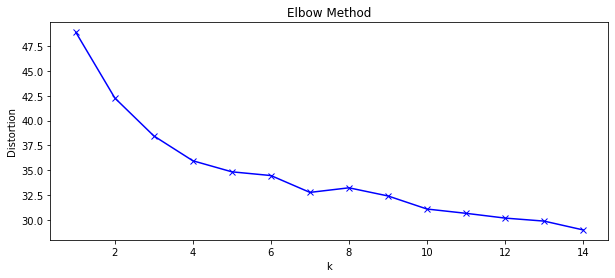

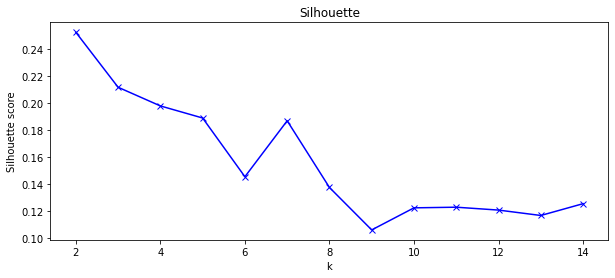

In [19]:
# Попробуем оценить количество кластеров для метода KMeans. 
# Используем эвристику (elbow), подбирать k будем исходя из падения критерия J(C) "не так сильно"
# Метод состоит в построении объясненной вариации в зависимости от количества кластеров и 
# выборе колена кривой в качестве количества кластеров для использования.

distortions = []
silhouette = []
K = range(1, 15)
for k in tqdm(K):
#     kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="dtw", n_jobs=8, max_iter=10, random_state=42)
    kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="euclidean", n_jobs=8, max_iter=10, random_state=42)
#     kmeanModel = KMeans(n_clusters=k, n_jobs=8, max_iter=10, random_state=42)
    kmeanModel.fit(vals)
    distortions.append(np.sqrt(kmeanModel.inertia_))
    if k > 1:
        silhouette.append(silhouette_score(vals, kmeanModel.labels_))

plt.figure(figsize=(10,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

plt.figure(figsize=(10,4))
plt.plot(K[1:], silhouette, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette score')
plt.title('Silhouette')
plt.show()

__Не хватает оперативной памяти для осуществления работы метода на локальной машине__

$$DTW(x, y) = min_{\pi} \sqrt{\sum_{(i,j)\in \pi} d(x_i, y_j)^2},$$

где $\pi = [\pi_0, ..., \pi_K]$ - это путь, удовлетворяющий набору условий:
 - это лист парных индексов $\pi_k = (i_k, j_k)$, где  $0 \leq i_k \lt n$ и $0 \leq j_k \lt m $;
 -  $\pi_0 = (0, 0)$ и $\pi_K = (n-1, m-1)$
для всех $k\gt0$,
 - $\pi_k=(i_k, j_k)$ и $\pi_{k-1}=(i_{k-1}, j_{k-1})$ удовлетворяют следующим неравенствам:
- $i_{k-1} \leq i_k \leq i_{k-1} + 1$
- $j_{j-1} \leq j_k \leq j_{k-1} + 1$


А если по-человечески:
- Путь - это индексы временных рядов
- Путь может ходить по диагонали, горизонтали и вертикали, 
главное, чтобы был неубывающим по индексам
- Стартуем всегда в начале временных рядов, заканчиваем всегда в конце


Примем, что начиная с 7 кластера значение критерия падает не очень сильно, менее 10 на каждый новый кластер

In [20]:
# Инициализируем количество кластеров
num_of_clusters = 7

In [21]:
km_model = TimeSeriesKMeans(n_clusters=num_of_clusters, random_state=random_state)
km_preds = km_model.fit_predict(vals)

In [22]:
# km_model = KMeans(n_clusters=num_of_clusters, random_state=random_state)
# km_preds = km_model.fit_predict(vals)

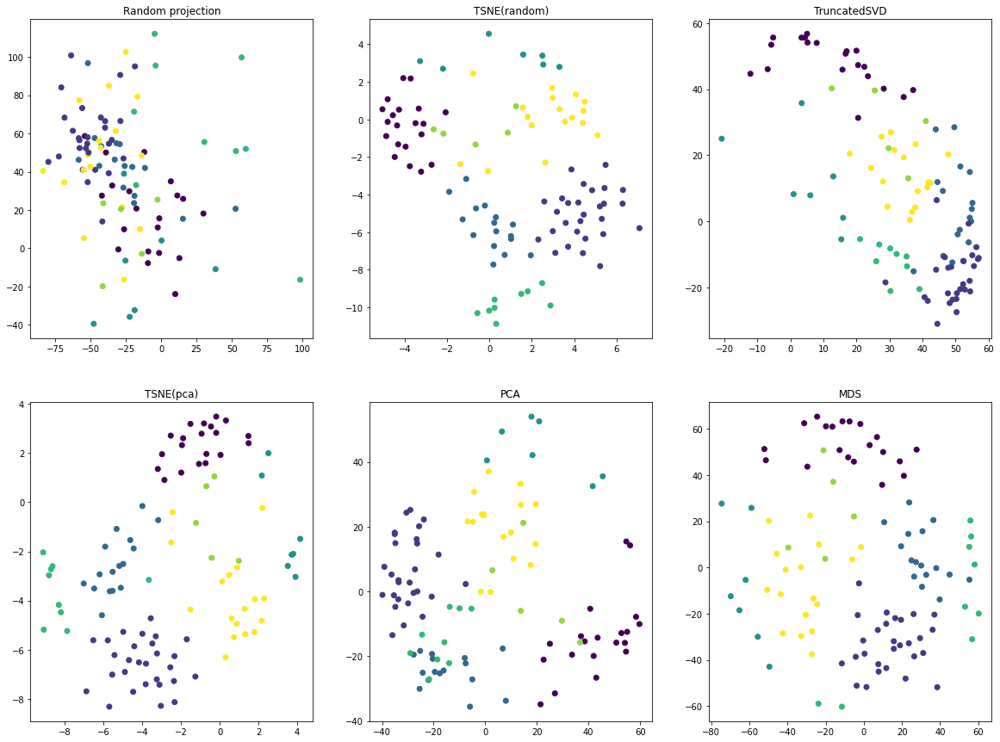

In [23]:
decrease_dimension(vals, num_of_components, random_state, km_preds)

Наша гипотеза о 7 кластерах визуально неплохо подтверждается.   
Оценим количественно качество кластеризации. Так как у нас не сущестует предварительно размеченных кластеров, мы можем использовать критерий __силуэта__.  
Подбирать количество кластеров будем исходя из максимального значения силуэта.  
Переберем значения кластеров от 2 до 7

For n_clusters = 2 The average silhouette_score is : 0.2524742785935142
For n_clusters = 3 The average silhouette_score is : 0.21174532250065917
For n_clusters = 4 The average silhouette_score is : 0.19791746705720548
For n_clusters = 5 The average silhouette_score is : 0.18896597841713375
For n_clusters = 6 The average silhouette_score is : 0.1454946590154189
For n_clusters = 7 The average silhouette_score is : 0.18691582152665134


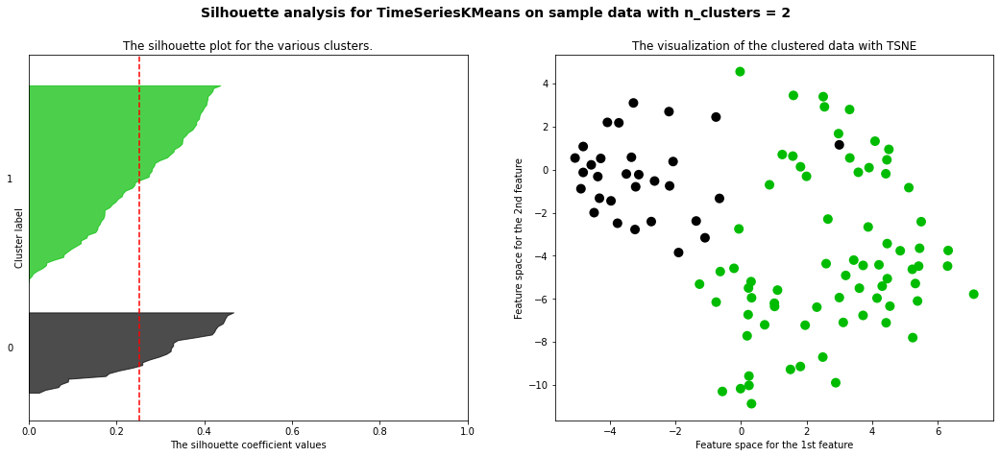

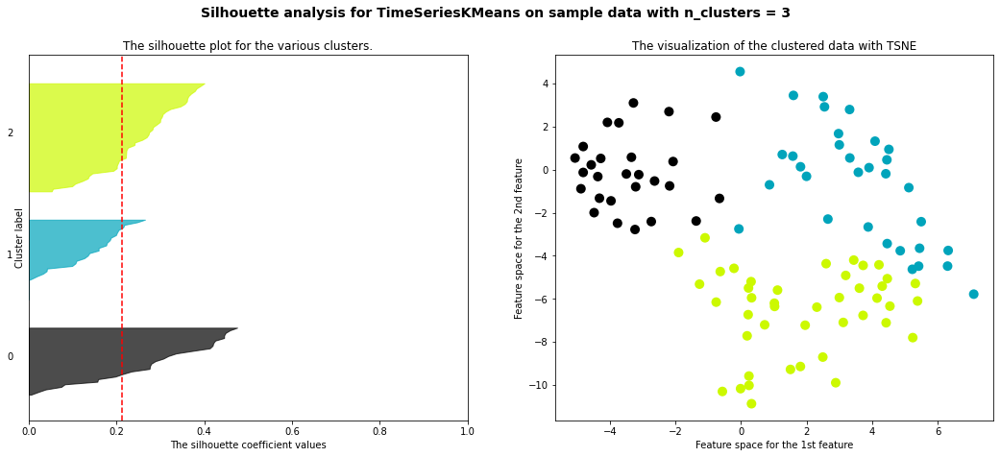

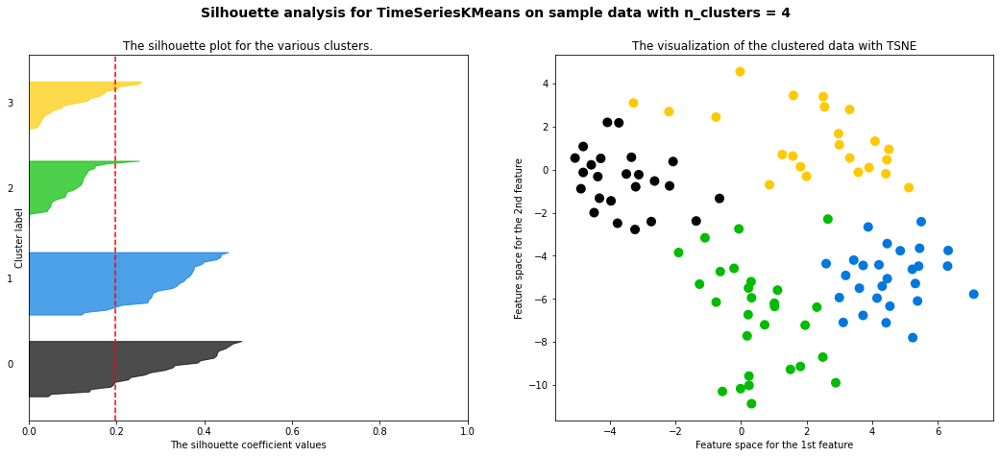

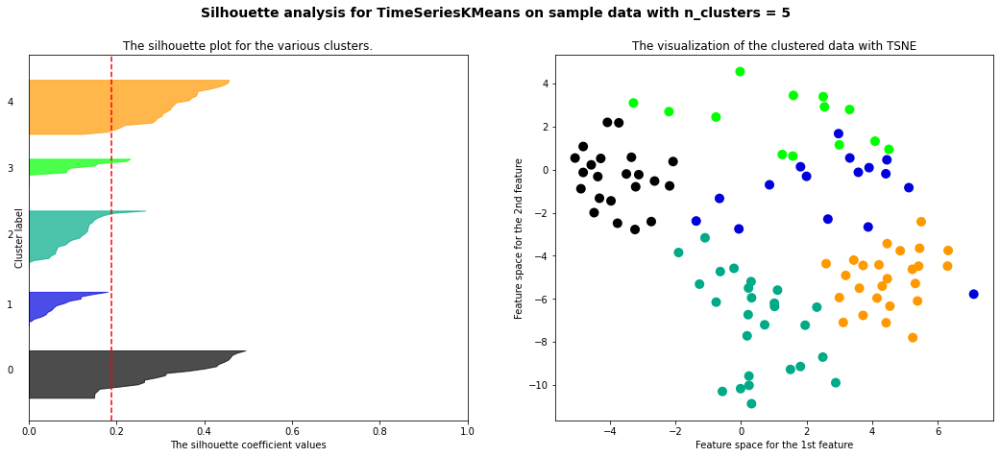

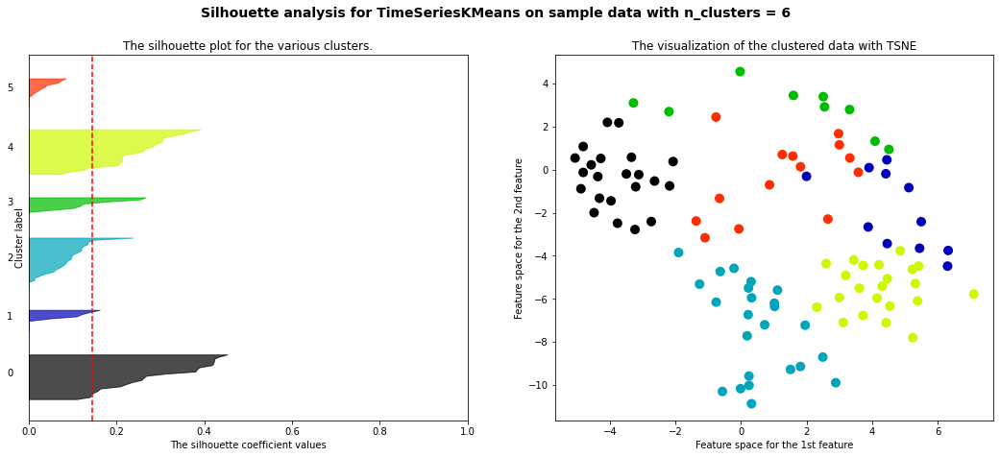

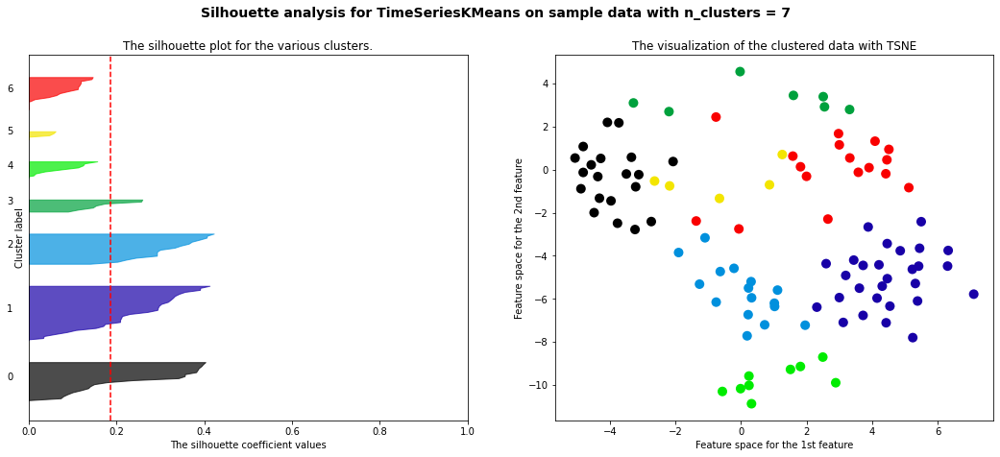

In [24]:
siluette_check(vals, "TimeSeriesKMeans")

Согласно критерию силуэта наилучшего разбиения удается добиться при 2 кластерах, что не совпадает с выбранными ранее 4. Визуально видно, что разделение на 2 кластера - наиболее лучшее, однако с эмпирической точки зрения это точно не так

Counter({1: 28, 0: 20, 6: 17, 2: 16, 4: 9, 3: 7, 5: 5})


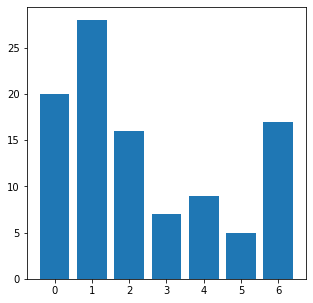

In [25]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(km_preds)

Кластеры получаются сбалансированными

In [26]:
# Отобразим кластеры на карте
import folium
from matplotlib import colors
from matplotlib import image as pltimg

In [27]:
# Массив названий цветов
color_names = ['blue', 'green', 'red', 'purple', 'cyan', 'orange', 'black']
# Перевод в шестнадцатиричную кодировку цвета
color_hex = [colors.to_hex(j) for j in color_names]

KMeans clustering


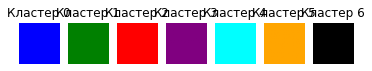

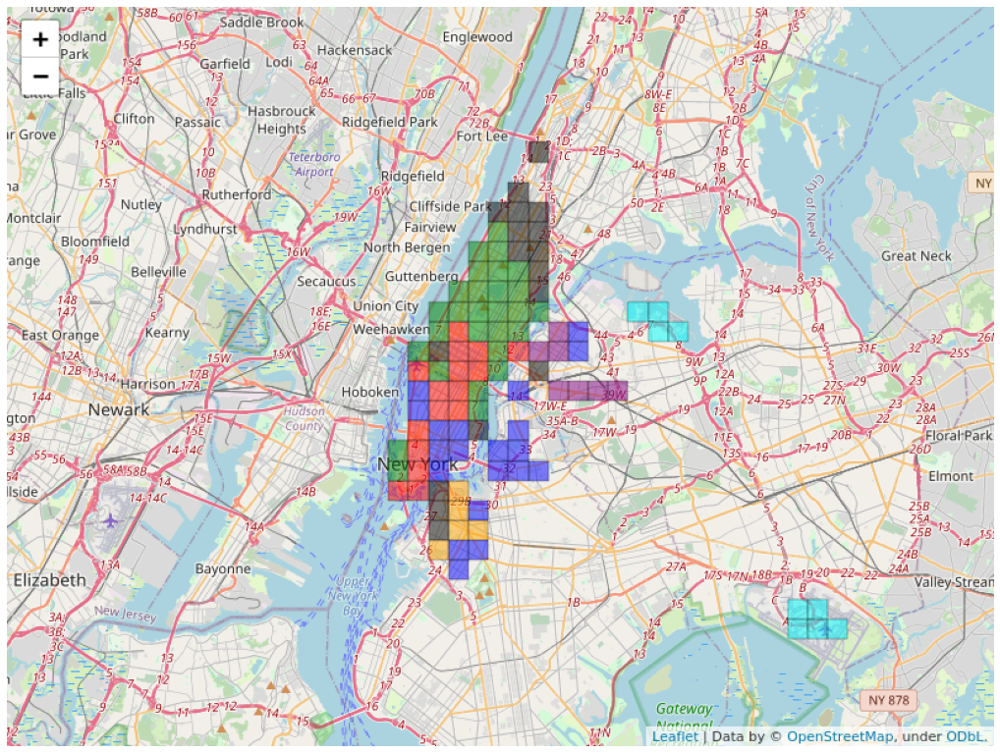

In [28]:
print("KMeans clustering")
draw_save_map(km_preds, "map_4_3_1")

Можно сделать вывод, что поездки из центра и из аэропорта образуют отдельный кластер.
В то же время явно выражаются поездки с севера и юга Манхеттена

#### Кластеризация методом EM.
Воспользуемся вероятностным подходом и гипотезой о том, что наши данные получились из разных распределений

In [48]:
# Инициализируем количество кластеров
num_of_clusters = 7

In [49]:
em_model = GaussianMixture(n_components=num_of_clusters, covariance_type='diag', random_state=random_state)
em_preds = em_model.fit_predict(vals)

Counter({1: 28, 0: 20, 6: 17, 2: 16, 4: 9, 3: 7, 5: 5})


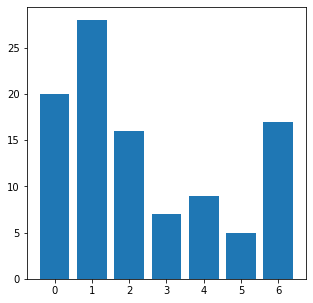

In [50]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(em_preds)

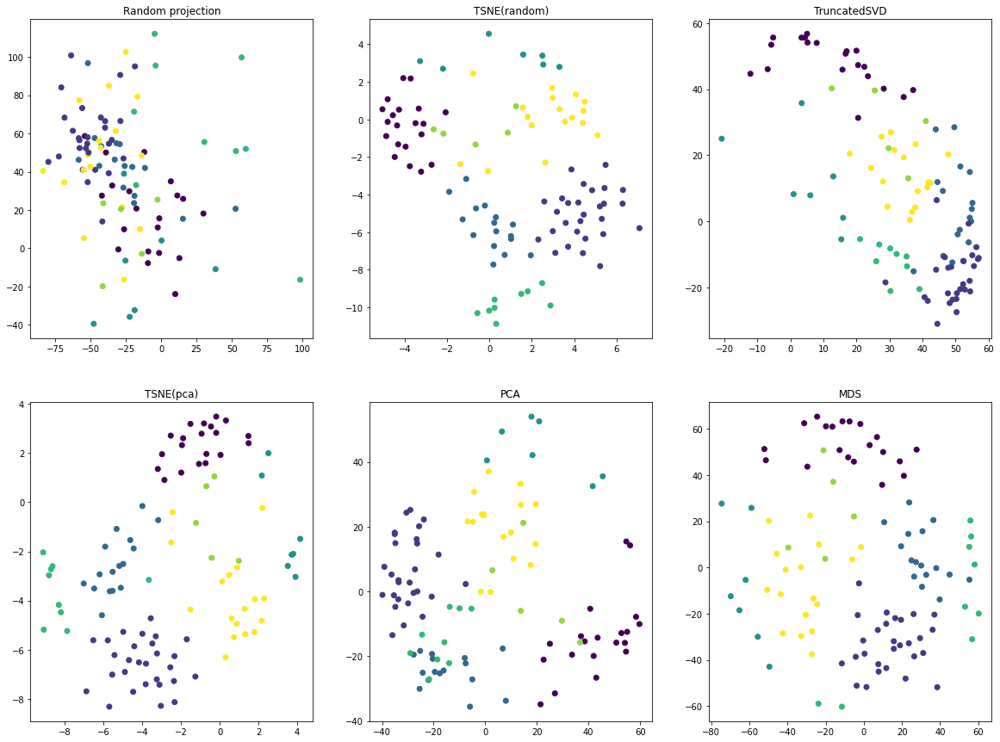

In [51]:
decrease_dimension(vals, num_of_components, random_state, em_preds)

For n_clusters = 2 The average silhouette_score is : 0.2554817172728114
For n_clusters = 3 The average silhouette_score is : 0.24153744072996036
For n_clusters = 4 The average silhouette_score is : 0.19771383258207365
For n_clusters = 5 The average silhouette_score is : 0.18896597841713375
For n_clusters = 6 The average silhouette_score is : 0.15055066699137462
For n_clusters = 7 The average silhouette_score is : 0.18691582152665134


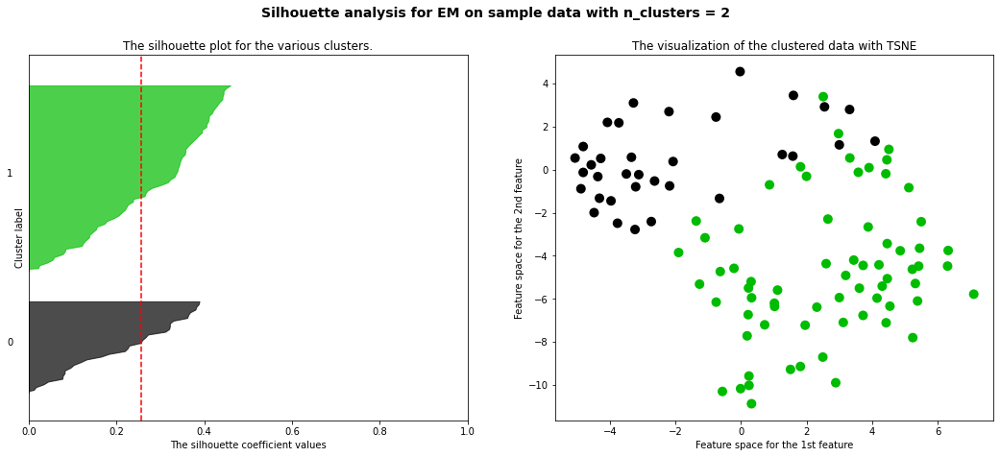

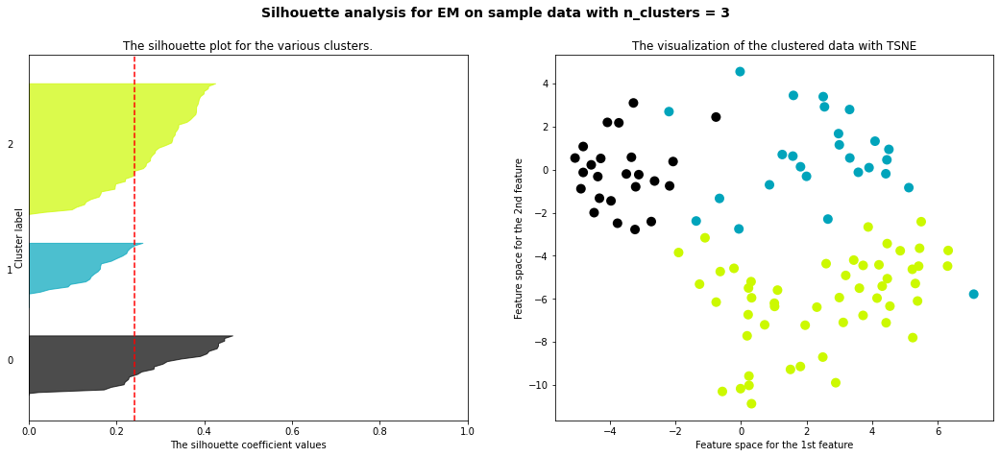

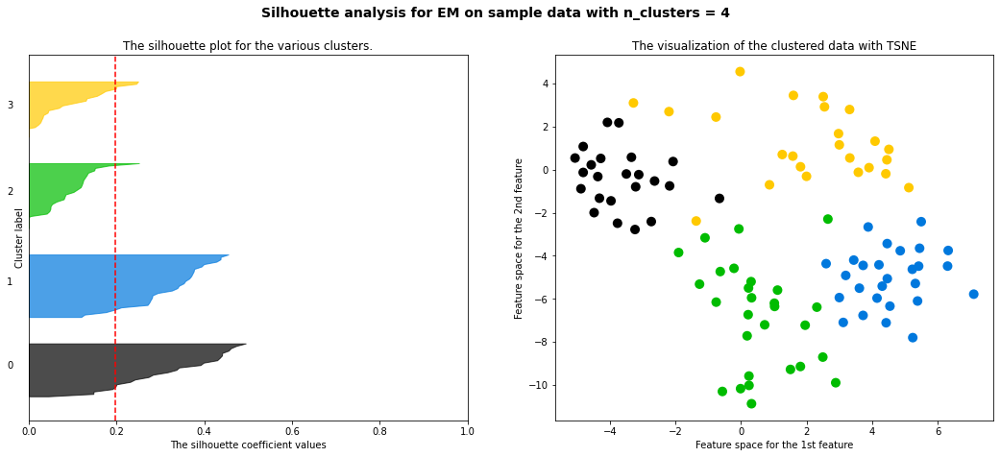

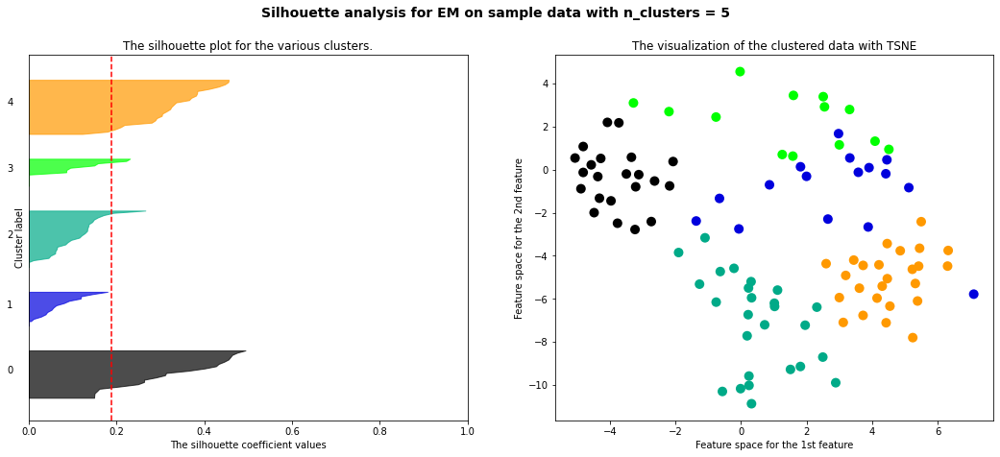

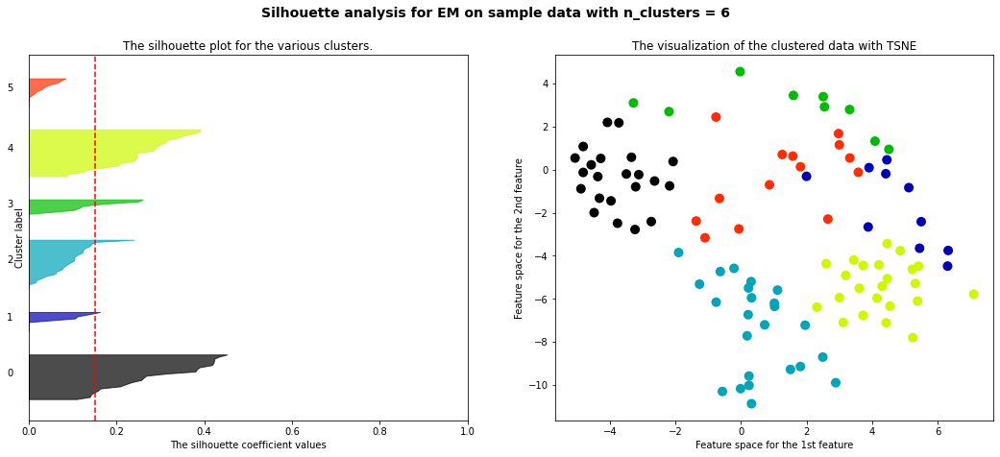

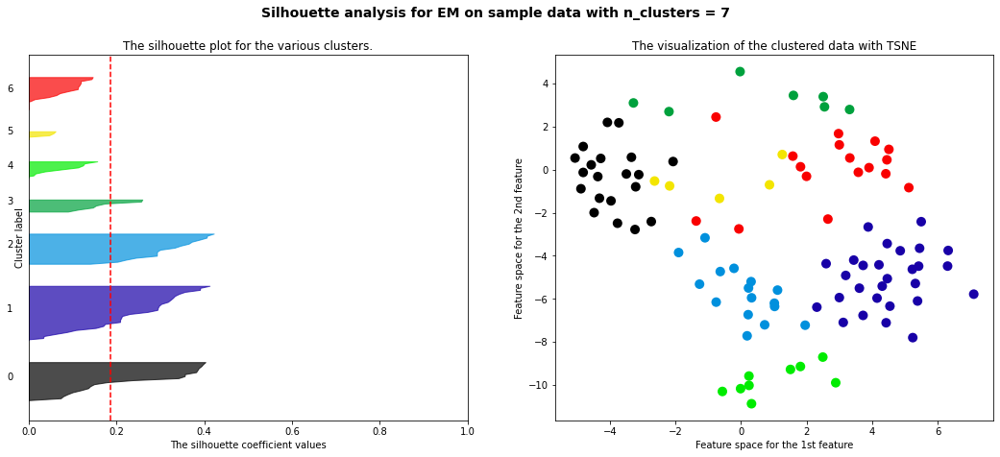

In [52]:
siluette_check(vals, "EM")

Уже имеем небольшое расхождение, для EM алгоритма согласно критерию силуэта оптимальным является всего 2 кластера

EM clustering


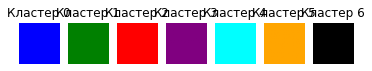

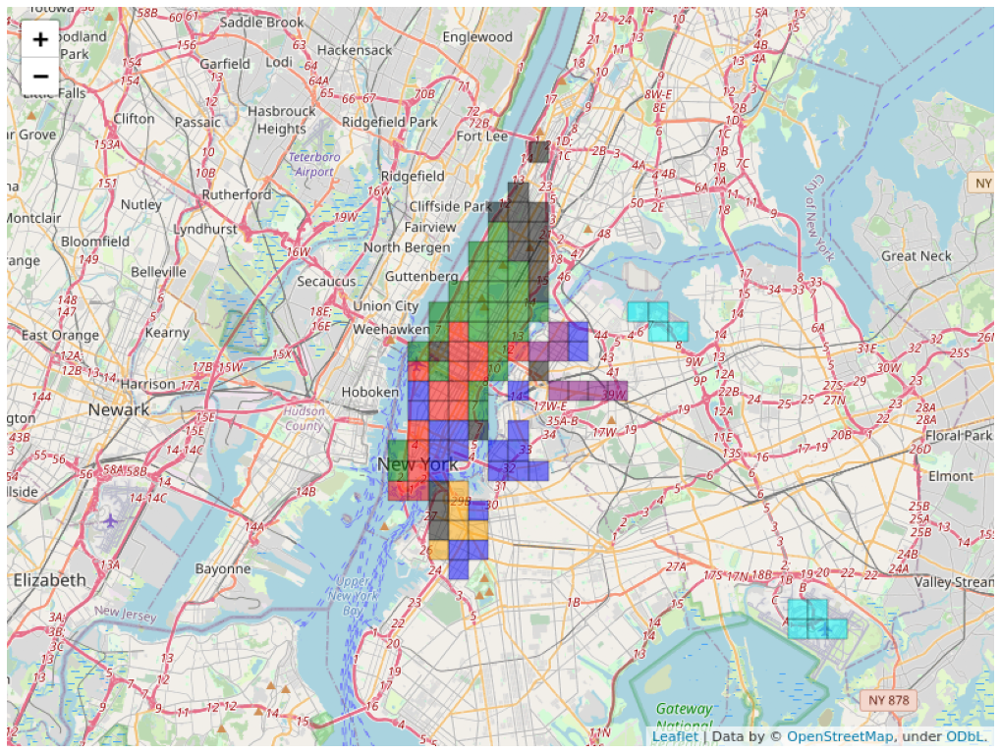

In [53]:
print("EM clustering")
draw_save_map(em_preds, "map_4_3_2")

Трудно подобрать параметры eps и min-pts, чтобы алгоритм давал адекватное количество кластеров, а также делал их сбалансированными. Оттого не будем далее использовать данный метод в исследовании

#### Агломеративно-иерархическая кластеризация (AGH)

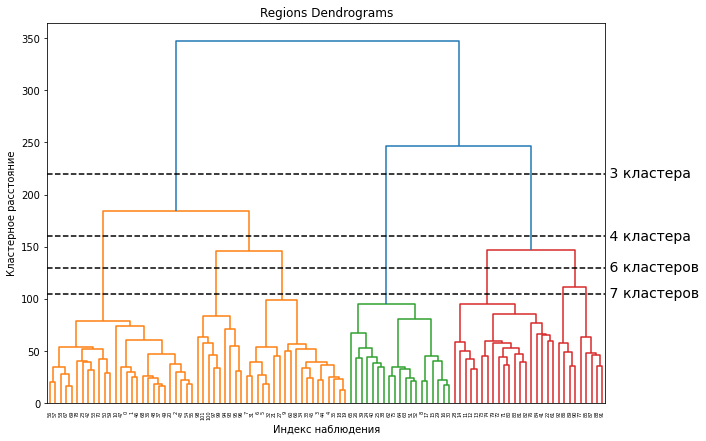

In [57]:
# Оценим возможное количество кластеров при помощи дендрограмм
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Regions Dendrograms")

# Метод связывания кластеров - метод Варда - выбирает и объединяет два
# кластера так, чтобы прирост дисперсии внутри кластеров был
# минимальным. Часто этот критерий приводит к получению кластеров
# относительно одинакового размера, что нам полностью удовлетворяет
dend = shc.dendrogram(shc.linkage(vals, method='ward'))
ax = plt.gca()
bounds = ax.get_xbound()

plt.xlabel("Индекс наблюдения")
plt.ylabel("Кластерное расстояние")

ax.plot(bounds, [220, 220], '--', c='k')
ax.plot(bounds, [160, 160], '--', c='k')
ax.plot(bounds, [130, 130], '--', c='k')
ax.plot(bounds, [105, 105], '--', c='k')
ax.text(bounds[1], 220, ' 3 кластера', va='center', fontdict={'size': 14})
ax.text(bounds[1], 160, ' 4 кластера', va='center', fontdict={'size': 14})
ax.text(bounds[1], 130, ' 6 кластеров', va='center', fontdict={'size': 14})
ax.text(bounds[1], 105, ' 7 кластеров', va='center', fontdict={'size': 14})

plt.show()

Судя по агломеративной кластеризации рациональнее производить разбиение по 7 кластерам

In [58]:
# Инициализируем количество кластеров
num_of_clusters = 7

In [59]:
AGH_model = AgglomerativeClustering(n_clusters=num_of_clusters, affinity='euclidean', linkage='ward')
AGH_preds = AGH_model.fit_predict(vals)

Counter({3: 27, 0: 19, 2: 19, 1: 19, 5: 9, 4: 5, 6: 4})


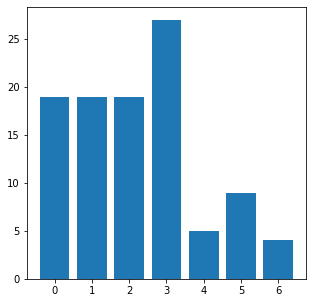

In [60]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(AGH_preds)

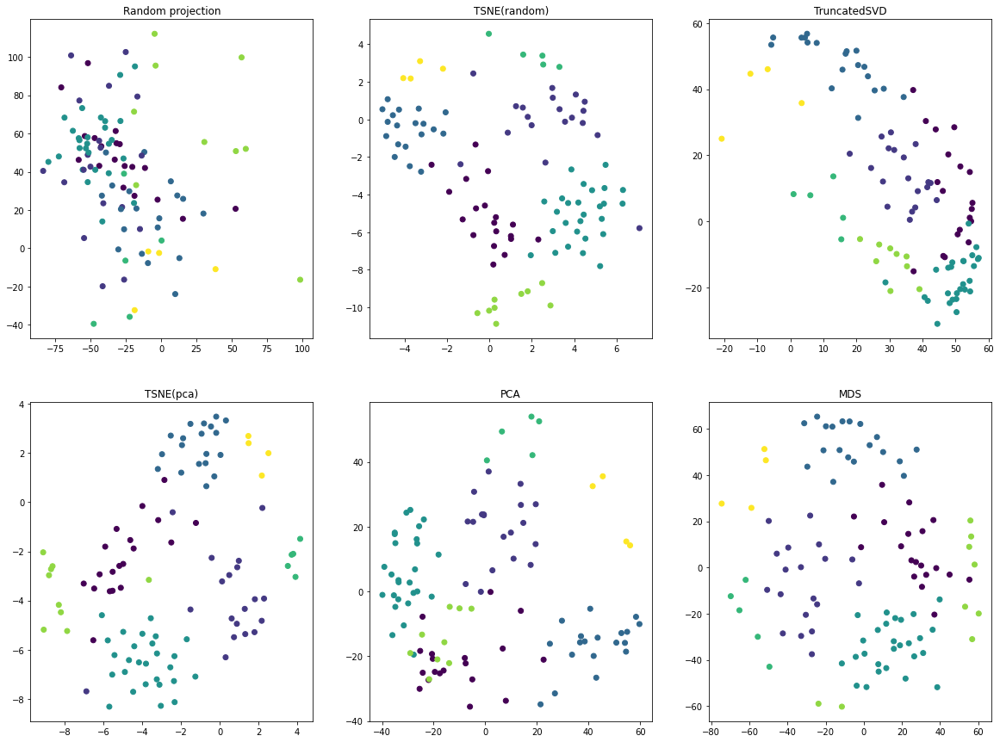

In [61]:
decrease_dimension(vals, num_of_components, random_state, AGH_preds)

For n_clusters = 2 The average silhouette_score is : 0.22908892949752693
For n_clusters = 3 The average silhouette_score is : 0.23894339144688662
For n_clusters = 4 The average silhouette_score is : 0.1805403671334325
For n_clusters = 5 The average silhouette_score is : 0.18773621214328237
For n_clusters = 6 The average silhouette_score is : 0.19956193576613607
For n_clusters = 7 The average silhouette_score is : 0.19580010122116318


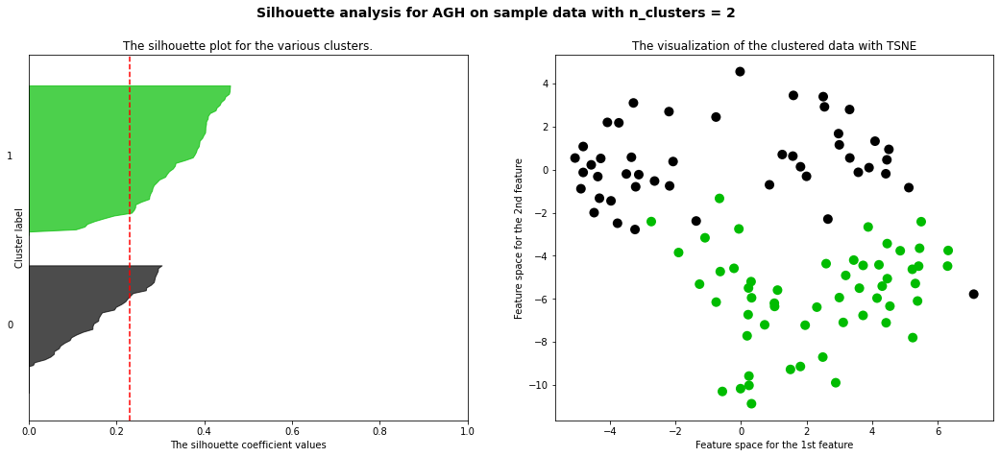

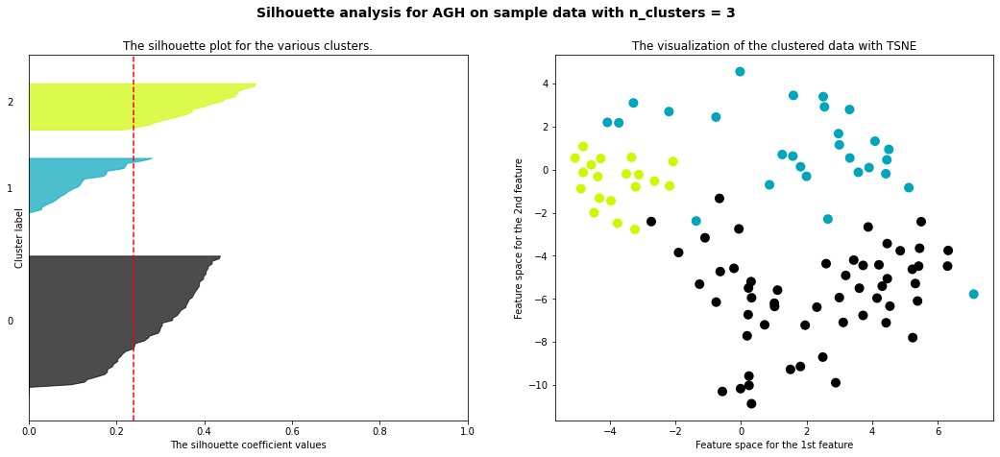

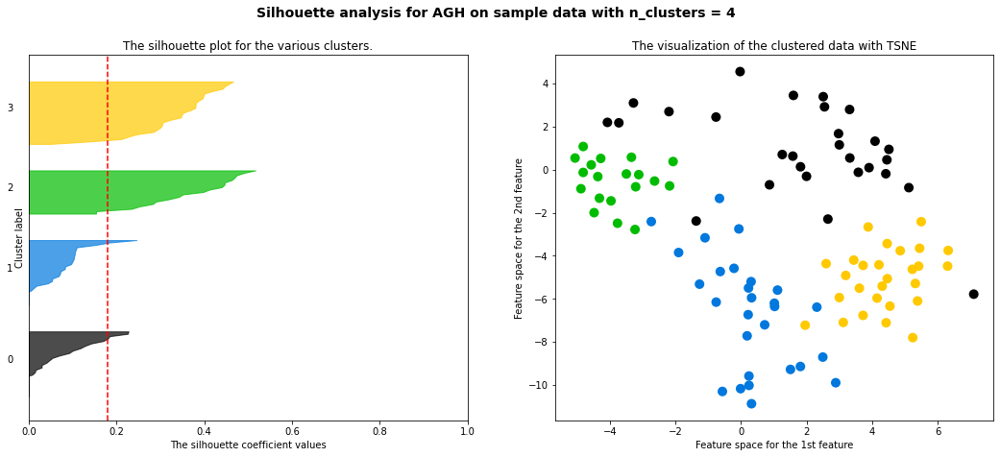

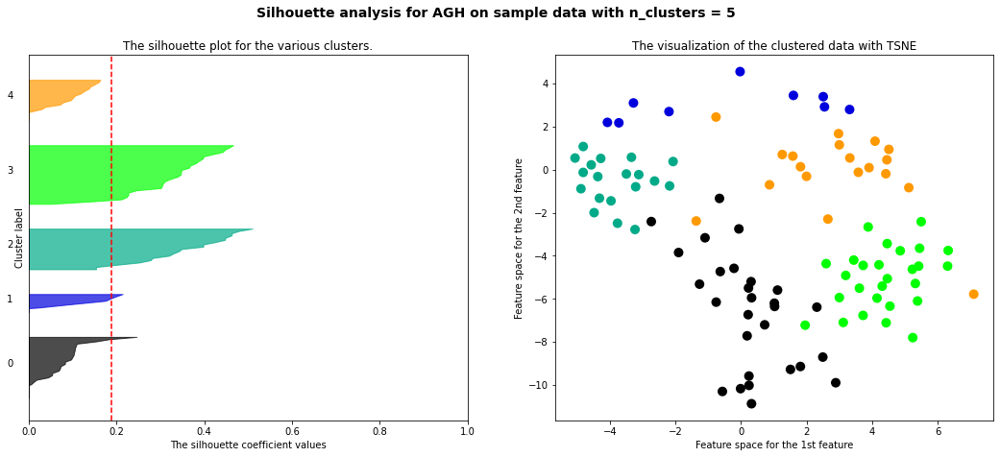

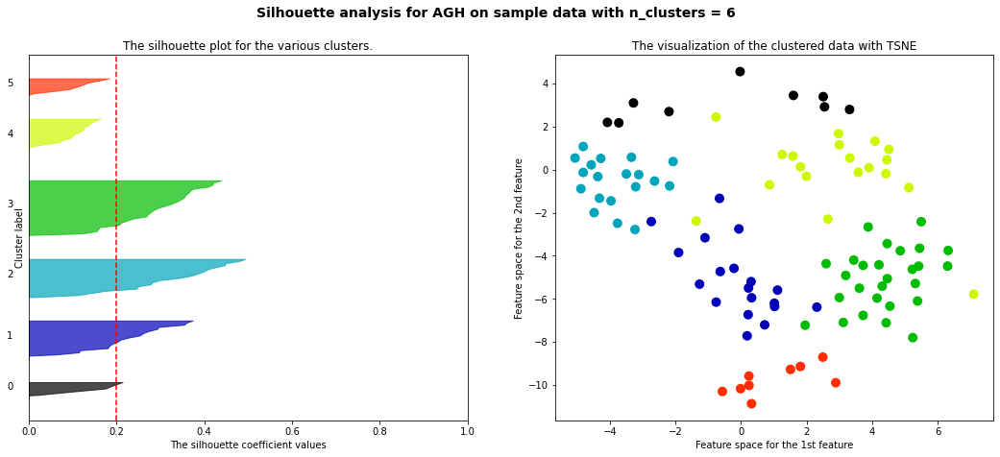

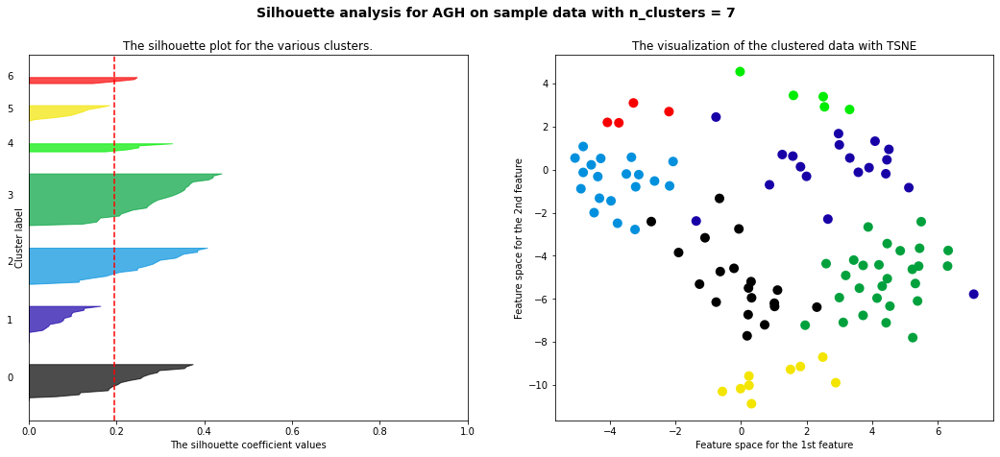

In [62]:
siluette_check(vals, "AGH")

Критерий силуэта предлагает разбивать по 3 кластерам

Aglomeraitve clustering


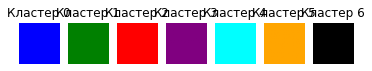

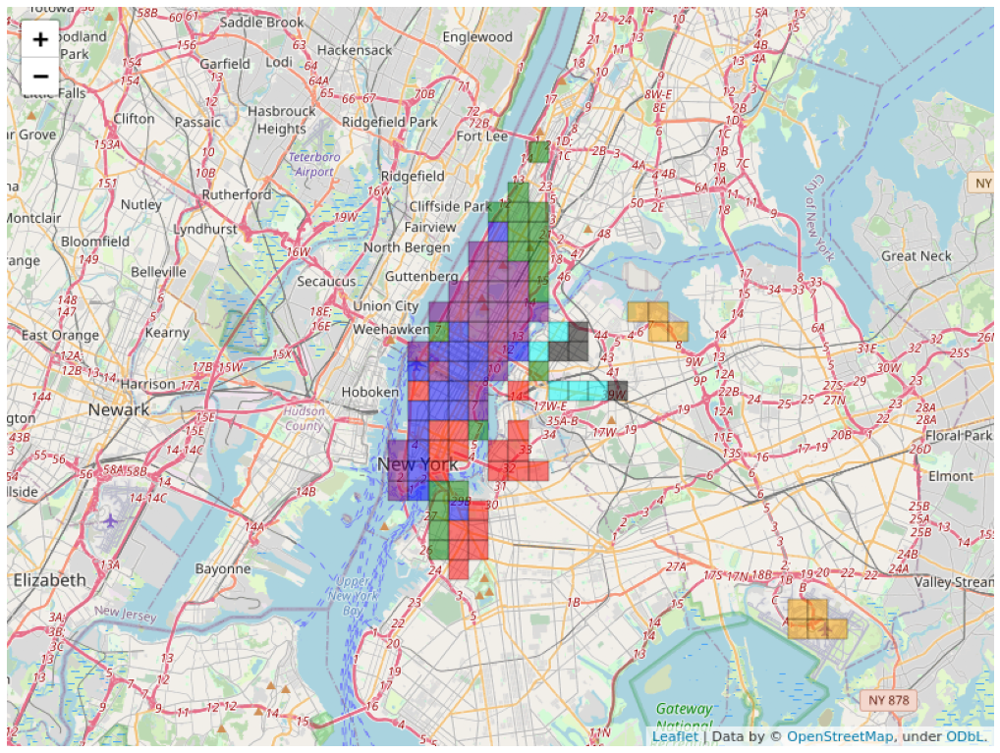

In [63]:
print("Aglomeraitve clustering")
draw_save_map(AGH_preds, "map_4_3_4")

KMeans clustering


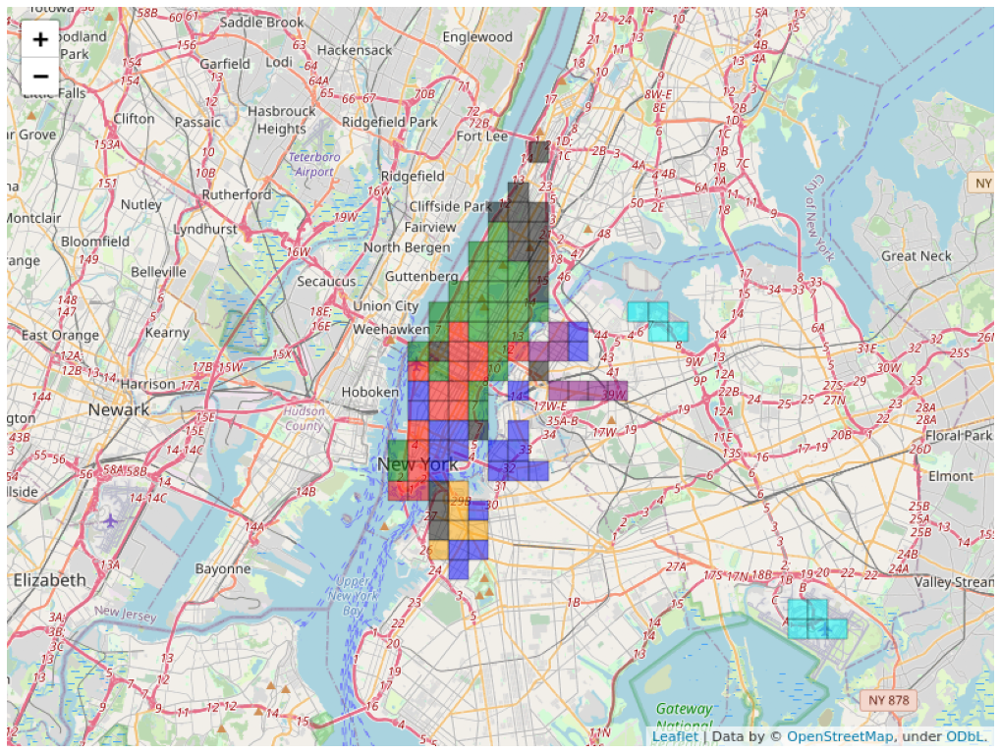

In [65]:
print("KMeans clustering")
# Печатаем
plt.figure(figsize=(18, 15))
map_image = pltimg.imread("map_4_3_1.png")
plt.imshow(map_image)
plt.axis('off')
plt.show()

EM clustering


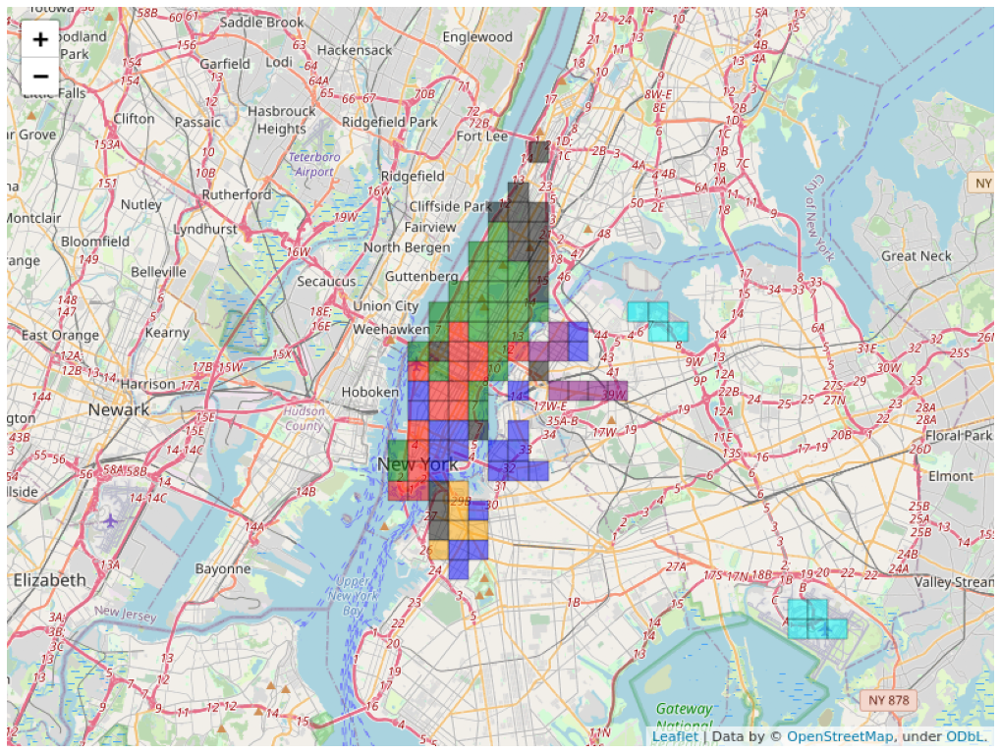

In [66]:
print("EM clustering")
# Печатаем
plt.figure(figsize=(18, 15))
map_image = pltimg.imread("map_4_3_2.png")
plt.imshow(map_image)
plt.axis('off')
plt.show()

Примем в качестве модели кластеризации - KMeans. На мой взгляд, дает наиболее плотные кластеры

#### Разметка регионов временных рядов по кластерам (по агломеративной кластеризации).

In [45]:
reg_info = dec_apr_data.iloc[:, :5]
reg_info['cluster'] = km_preds
reg_info.head()

,region,west,east,south,north,cluster
0,1075,-74.022246,-74.011135,40.697437,40.705825,2
1,1076,-74.022246,-74.011135,40.705825,40.714213,1
2,1077,-74.022246,-74.011135,40.714213,40.722601,1
3,1125,-74.011135,-74.000023,40.697437,40.705825,2
4,1126,-74.011135,-74.000023,40.705825,40.714213,2


In [46]:
reg_info.shape

(102, 6)

In [47]:
# Итоговый датасет
dec_apr_data.head()

,region,west,east,south,north,2015-12-01 00:00:00,2015-12-01 01:00:00,2015-12-01 02:00:00,2015-12-01 03:00:00,2015-12-01 04:00:00,...,2016-04-30 14:00:00,2016-04-30 15:00:00,2016-04-30 16:00:00,2016-04-30 17:00:00,2016-04-30 18:00:00,2016-04-30 19:00:00,2016-04-30 20:00:00,2016-04-30 21:00:00,2016-04-30 22:00:00,2016-04-30 23:00:00
0,1075,-74.022246,-74.011135,40.697437,40.705825,19.0,16.0,8.0,3.0,2.0,...,138.0,145.0,162.0,142.0,157.0,121.0,107.0,91.0,100.0,92.0
1,1076,-74.022246,-74.011135,40.705825,40.714213,43.0,22.0,19.0,12.0,12.0,...,318.0,299.0,214.0,234.0,223.0,209.0,208.0,155.0,97.0,118.0
2,1077,-74.022246,-74.011135,40.714213,40.722601,26.0,12.0,3.0,5.0,3.0,...,144.0,147.0,112.0,111.0,124.0,145.0,99.0,108.0,85.0,63.0
3,1125,-74.011135,-74.000023,40.697437,40.705825,76.0,29.0,9.0,7.0,7.0,...,91.0,91.0,75.0,97.0,111.0,101.0,107.0,115.0,100.0,86.0
4,1126,-74.011135,-74.000023,40.705825,40.714213,91.0,71.0,21.0,17.0,21.0,...,289.0,287.0,264.0,332.0,339.0,345.0,290.0,318.0,217.0,284.0


In [121]:
# Сохраним в отдельный файл
reg_info.to_csv('reg_info.csv', sep=',', header=True, index=False)

In [48]:
# Добавим нумерацию кластеров
dec_apr_data['type'] = km_preds

In [49]:
dec_apr_data.head()

,region,west,east,south,north,2015-12-01 00:00:00,2015-12-01 01:00:00,2015-12-01 02:00:00,2015-12-01 03:00:00,2015-12-01 04:00:00,...,2016-04-30 15:00:00,2016-04-30 16:00:00,2016-04-30 17:00:00,2016-04-30 18:00:00,2016-04-30 19:00:00,2016-04-30 20:00:00,2016-04-30 21:00:00,2016-04-30 22:00:00,2016-04-30 23:00:00,type
0,1075,-74.022246,-74.011135,40.697437,40.705825,19.0,16.0,8.0,3.0,2.0,...,145.0,162.0,142.0,157.0,121.0,107.0,91.0,100.0,92.0,2
1,1076,-74.022246,-74.011135,40.705825,40.714213,43.0,22.0,19.0,12.0,12.0,...,299.0,214.0,234.0,223.0,209.0,208.0,155.0,97.0,118.0,1
2,1077,-74.022246,-74.011135,40.714213,40.722601,26.0,12.0,3.0,5.0,3.0,...,147.0,112.0,111.0,124.0,145.0,99.0,108.0,85.0,63.0,1
3,1125,-74.011135,-74.000023,40.697437,40.705825,76.0,29.0,9.0,7.0,7.0,...,91.0,75.0,97.0,111.0,101.0,107.0,115.0,100.0,86.0,2
4,1126,-74.011135,-74.000023,40.705825,40.714213,91.0,71.0,21.0,17.0,21.0,...,287.0,264.0,332.0,339.0,345.0,290.0,318.0,217.0,284.0,2


In [50]:
# Выберем характерные ячейки по минимальному евклидову расстоянию до центров кластеризации.
target_cells = dict()
for tp in set(km_preds):
    cluster_center = km_model.cluster_centers_[tp]
    type_data = dec_apr_data[dec_apr_data.type == tp]
    min_dist = float('inf')

    for index, row in type_data.iterrows():
        if np.linalg.norm(cluster_center - np.array(row.iloc[5:-1])) < min_dist:
            target_cells[tp] = int(row.region)

In [125]:
# !mkdir dumps && cd dumps
# !touch target_cells.joblib
# Создадим файл "подкачки" на будущее
dump(target_cells, 'dumps/target_cells.joblib')

['dumps/target_cells.joblib']

In [51]:
target_cells = load('dumps/target_cells.joblib')

In [52]:
for i in target_cells:
    print('Кластер {} - регион {}'.format(i, target_cells[i]))

Кластер 0 - регион 1533
Кластер 1 - регион 1434
Кластер 2 - регион 1382
Кластер 3 - регион 1630
Кластер 4 - регион 2168
Кластер 5 - регион 1273
Кластер 6 - регион 1442


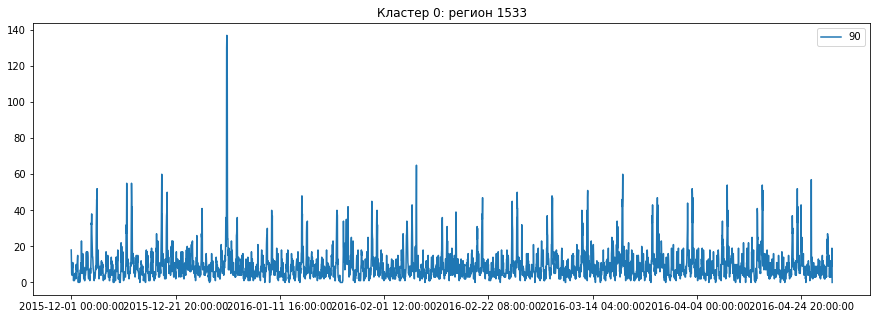

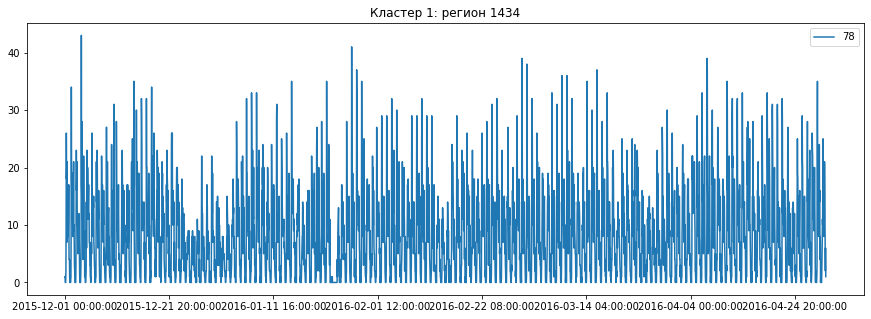

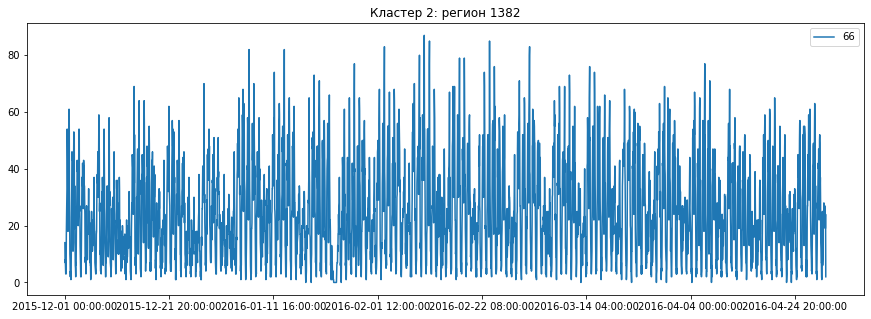

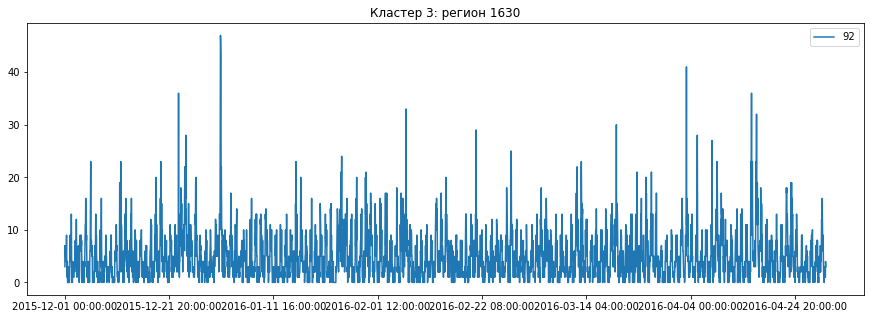

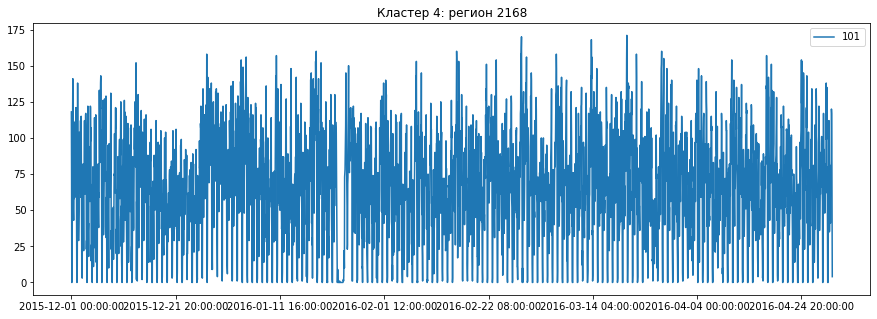

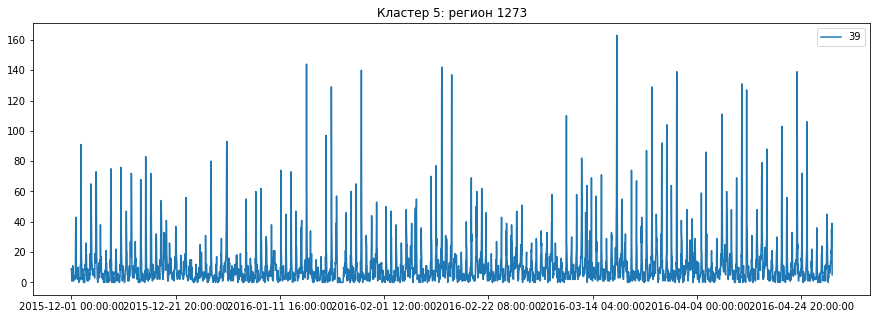

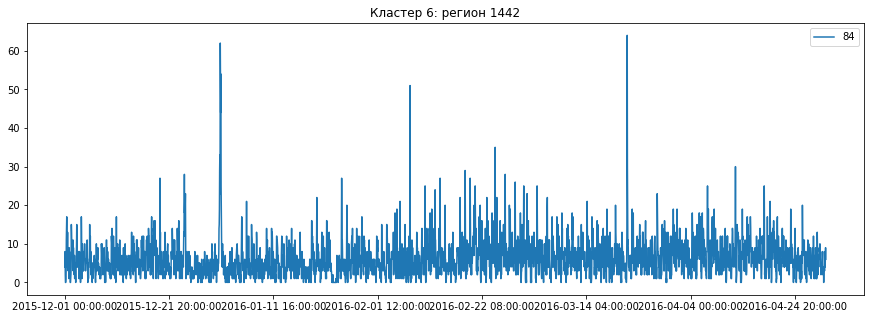

In [53]:
# Взглянем на получившиеся временные ряды
for i in target_cells:
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_apr_data[dec_apr_data.region==target_cells[i]].iloc[:, 5:].transpose().plot(ax=ax)
    plt.title('Кластер {}: регион {}'.format(i, target_cells[i]))
    plt.show()

In [54]:
def plot_cluster_tickers(current_cluster):
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0]/4)),
        4,
        figsize=(15, 3*int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)

    for index, (_, row) in enumerate(current_cluster.iterrows()):
        ax[index].plot(row.iloc[5:-1])
        ax[index].set_title(f"Region number : {row.region}\n")
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

                          Cluster number: 0


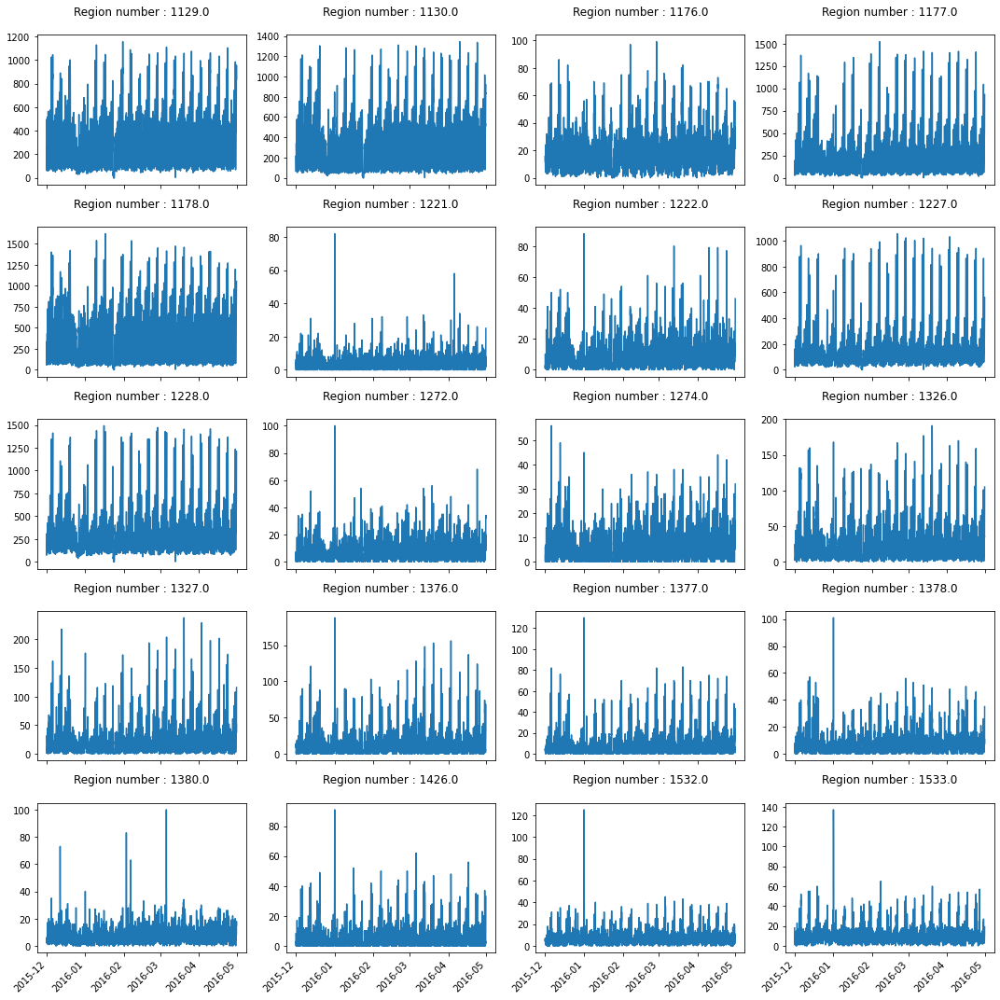

                          Cluster number: 1


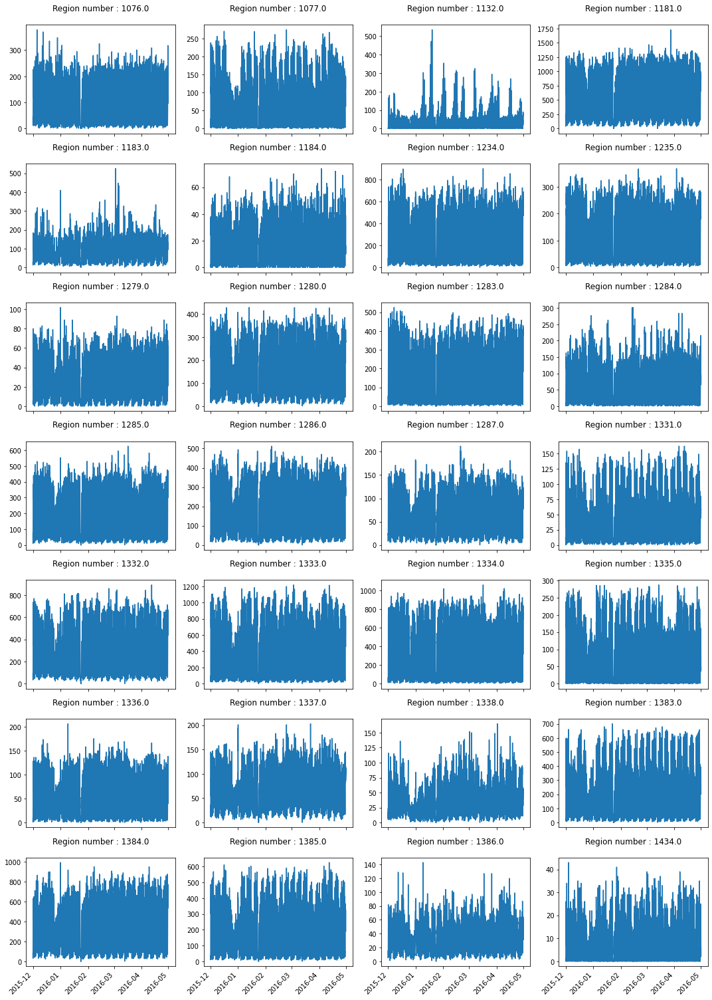

                          Cluster number: 2


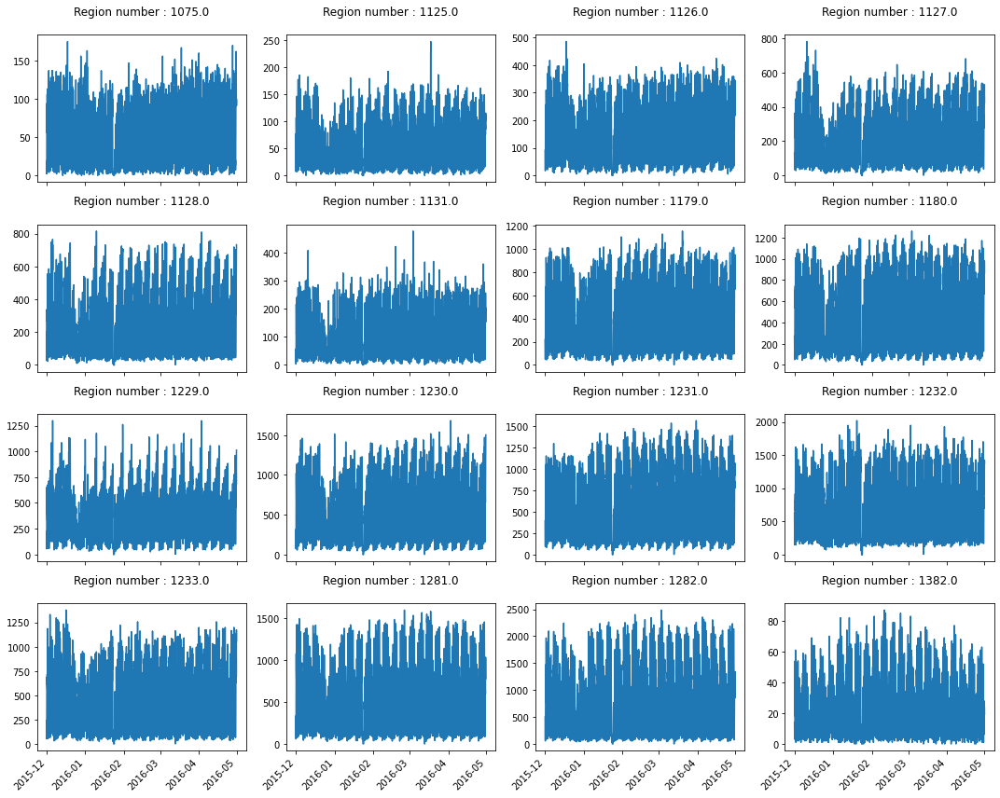

                          Cluster number: 3


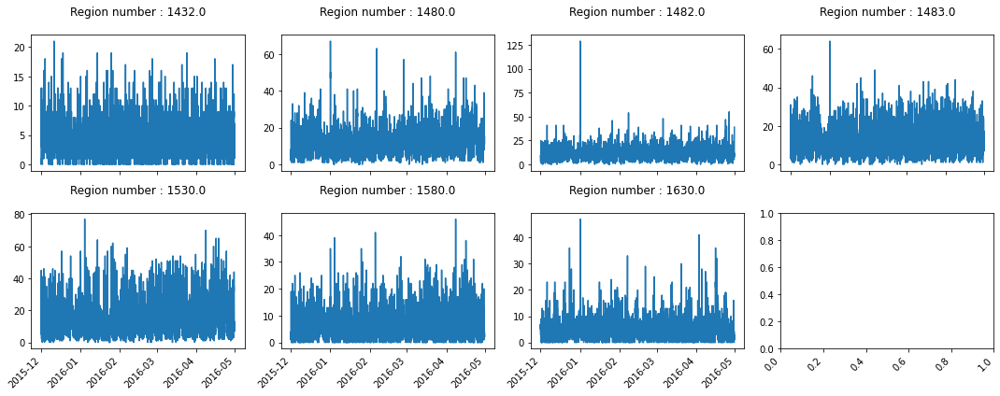

                          Cluster number: 4


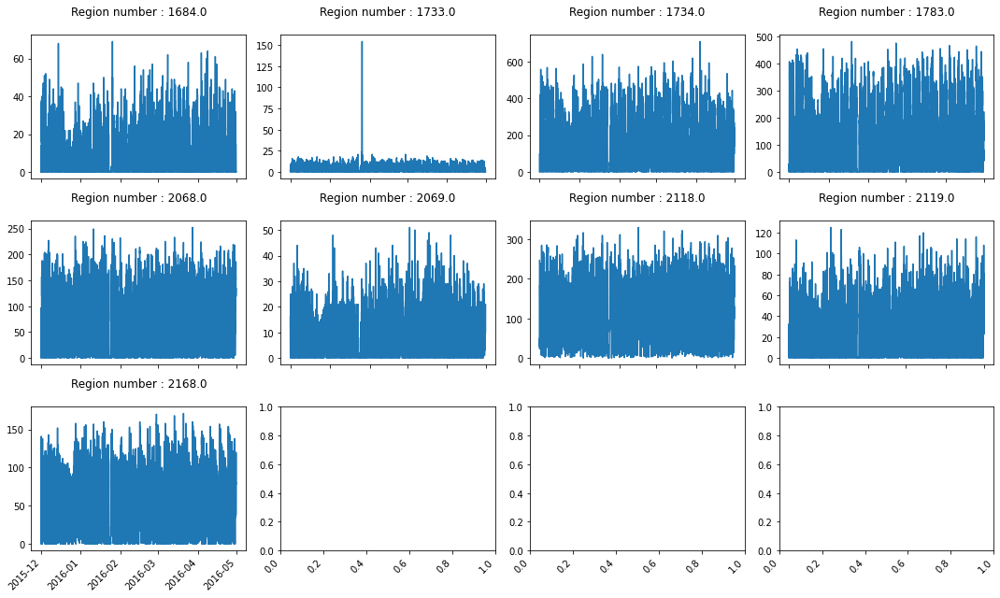

                          Cluster number: 5


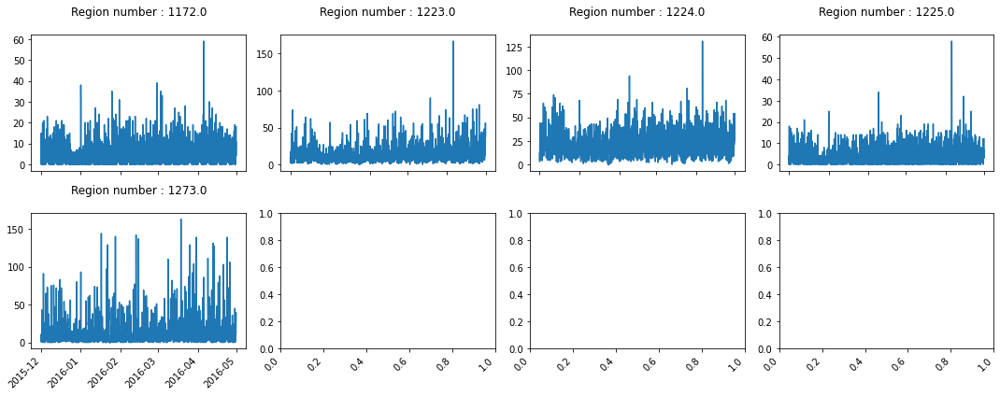

                          Cluster number: 6


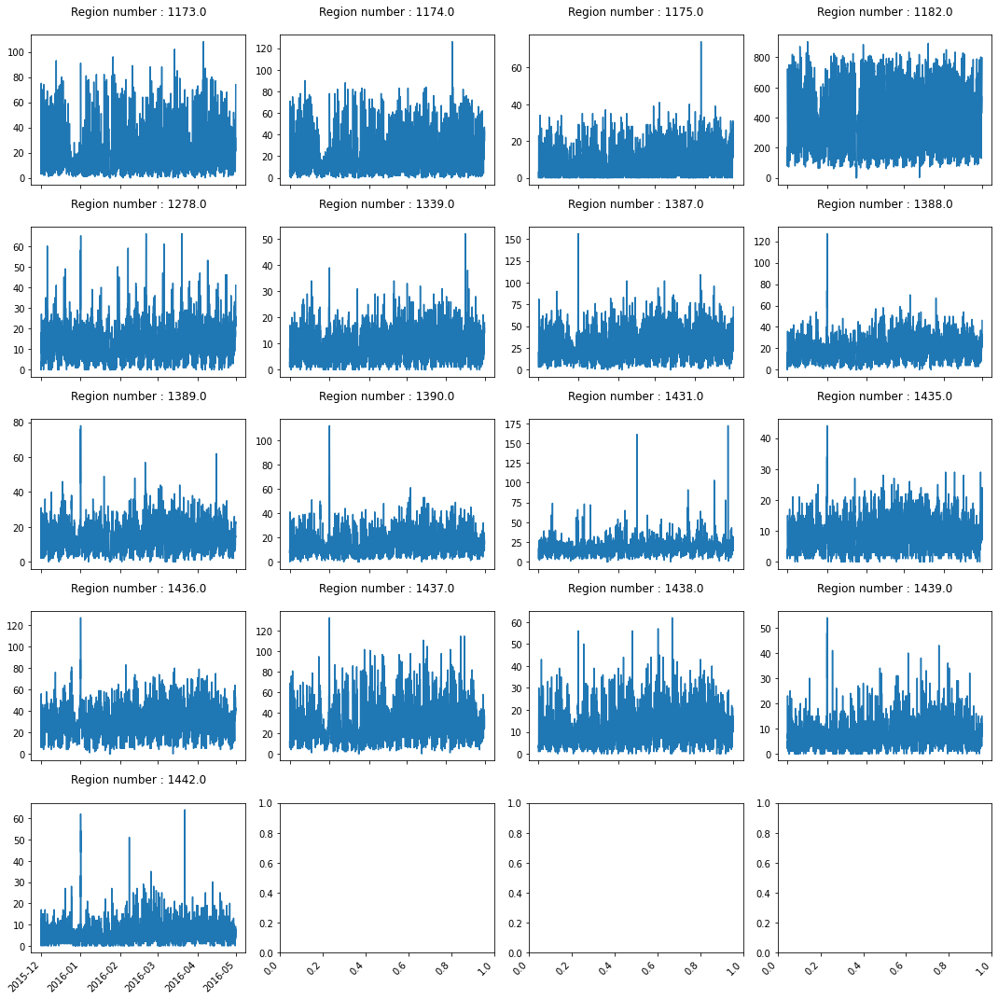

In [55]:
for cluster in range(num_of_clusters):
    print("=================================================================================")
    print(f"                          Cluster number: {cluster}")
    print("=================================================================================")
    plot_cluster_tickers(dec_apr_data[dec_apr_data.type==cluster])

Действительно, налицо различие во временных рядах в плане частоты поездок

### Прогнозирование временного ряда при помощи авторегрессии
Подбор параметров модели семейства ARIMA

По аналогии с прошлым заданием для учёта недельной сезонности используем регрессионные признаки следующего вида:
Примем К = 20. Также добавим категориальные признаки месяца, дня недели, логарифм количества дней с прошедшего праздника

In [58]:
import holidays
from sklearn.preprocessing import OneHotEncoder
from sklearn import linear_model
from statsmodels import api as sm
from itertools import product
from joblib import dump, load

In [59]:
# Количество дней после ближайшего прошедшего праздника.
def day_after_holiday(day):
    ny_holidays = holidays.CountryHoliday('US', state='NY')
    res = 0
    temp_day = day
    while temp_day not in ny_holidays:
        res += 1
        temp_day = temp_day - datetime.timedelta(days=1)
    return res

In [60]:
# Добавление признаков. 
# Модифицирует датафрейм, возвращеет имена колонок с признаками.
def add_features(cell_data, k, counter=1):
    
    # Синусы и косинусы.
    cell_data['const'] = 1
    cell_data['lin'] = np.arange(counter, cell_data.shape[0]+counter)
    real_columns = ['const', 'lin']
    for i in range(1, k+1):
        #year_sin_col = 'year_sin_{}'.format(i)
        #year_cos_col = 'year_cos_{}'.format(i)
        week_sin_col = 'week_sin_{}'.format(i)
        week_cos_col = 'week_cos_{}'.format(i)
        
        #cell_data[year_sin_col] = np.sin(np.array(cell_data['lin'] * 2 * np.pi * i / 8766))
        #cell_data[year_cos_col] = np.cos(np.array(cell_data['lin'] * 2 * np.pi * i / 8766))
        cell_data[week_sin_col] = np.sin(np.array(cell_data['lin'] * 2 * np.pi * i / 168))
        cell_data[week_cos_col] = np.cos(np.array(cell_data['lin'] * 2 * np.pi * i / 168))
        
        #features_columns += [year_sin_col, year_cos_col, week_sin_col, week_cos_col]
        real_columns += [week_sin_col, week_cos_col]
    
    # Дни недели.
    weekdays = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']
    days = cell_data.index
    days = np.array([i.weekday() + 1 for i in days] + list(range(1, 8)))
    res = OneHotEncoder(sparse=False).fit_transform(days.reshape((-1,1)))[:-7, :]
    for i in range(len(weekdays)):
        cell_data[weekdays[i]] = res[:, i]
    categorical_columns = weekdays
    
    # Месяцы. 
    months_names = ['january', 'february', 'march', 'april', 'may', 'june', 
                'jule', 'august', 'september', 'october', 'november', 'december']
    months = np.array([i.month for i in cell_data.index] + list(range(1, 13)))

    res = OneHotEncoder(sparse=False).fit_transform(months.reshape((-1,1)))[:-12, :]
    for i in range(len(months_names)):
        cell_data[months_names[i]] = res[:, i]
    categorical_columns += months_names
        
 
    # Праздники.
    cell_data['days_after_holidays'] = np.log(np.array([day_after_holiday(i) for i in cell_data.index]) + 1)
    real_columns += ['days_after_holidays']
    
    # Масштабирование.
    #vals = StandardScaler().fit_transform(np.array(cell_data[real_columns]))
    #for i in range(len(real_columns)):
     #   cell_data[real_columns[i]] = vals[:, i]
    
    features_columns = real_columns + categorical_columns
    
    return features_columns

In [61]:
# Обучение модели, добаление предсказаний и остатков в датафрейм. Возвращает модель.
def get_reg_pred(cell_data, features_columns):
    train_data = np.array(cell_data[features_columns])
    train_labels = np.array(cell_data['trips'])
    
    model = linear_model.LinearRegression()
    model.fit(train_data, train_labels)
    
    preds = model.predict(cell_data[features_columns])
    
    cell_data['reg_pred'] = preds
    cell_data['reg_resid'] = cell_data['trips'] - preds
    
    return model

In [63]:
K = 20

In [64]:
dec_apr_data.drop(columns=['type'], inplace=True, errors='ignore')

#### Кластер 0. Анализ временного ряда и первичный подбор параметров модели

In [65]:
cell_data_0 = dec_apr_data[dec_apr_data.region==target_cells[0]].iloc[:, 5:].transpose()
cell_data_0.columns = ['trips']
features_columns_0 = add_features(cell_data_0, K)
reg_model_0 = get_reg_pred(cell_data_0, features_columns_0)
cell_data_0.head()

,trips,const,lin,week_sin_1,week_cos_1,week_sin_2,week_cos_2,week_sin_3,week_cos_3,week_sin_4,...,june,jule,august,september,october,november,december,days_after_holidays,reg_pred,reg_resid
2015-12-01 00:00:00,18.0,1,1,0.037391,0.999301,0.074730,0.997204,0.111964,0.993712,0.149042,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,9.564016,8.435984
2015-12-01 01:00:00,12.0,1,2,0.074730,0.997204,0.149042,0.988831,0.222521,0.974928,0.294755,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,8.843006,3.156994
2015-12-01 02:00:00,5.0,1,3,0.111964,0.993712,0.222521,0.974928,0.330279,0.943883,0.433884,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,8.459488,-3.459488
2015-12-01 03:00:00,6.0,1,4,0.149042,0.988831,0.294755,0.955573,0.433884,0.900969,0.563320,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,8.630355,-2.630355
2015-12-01 04:00:00,4.0,1,5,0.185912,0.982566,0.365341,0.930874,0.532032,0.846724,0.680173,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,9.203924,-5.203924


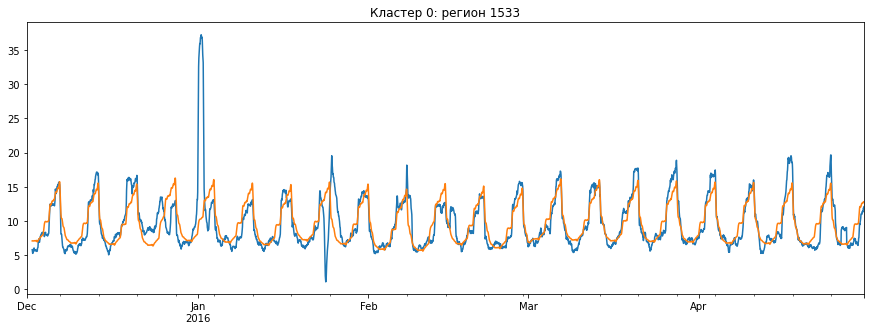

In [66]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_0.trips.rolling(24).mean().plot(ax=ax)
cell_data_0.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 0: регион {}'.format(target_cells[0]))
plt.show()

Здесь и далее наблюдаем четкую __суточную сезонность__ (24 точки)

In [139]:
dump(reg_model_0, 'dumps/reg_model_0.joblib')

['dumps/reg_model_0.joblib']

In [140]:
# Преобразование остатков регрессии
def plot_decompose(cell_data_0, col):
    dec_obj = sm.tsa.seasonal_decompose(cell_data_0[col].dropna())
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.observed.plot(ax=ax)
    plt.title('Observed'.format(i, target_cells[i]))
    plt.show()
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.trend.plot(ax=ax)
    plt.title('Trend'.format(i, target_cells[i]))
    plt.show()
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.seasonal.plot(ax=ax)
    plt.title('Seasonal'.format(i, target_cells[i]))
    plt.show()
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.resid.plot(ax=ax)
    plt.title('Resid'.format(i, target_cells[i]))
    plt.show()

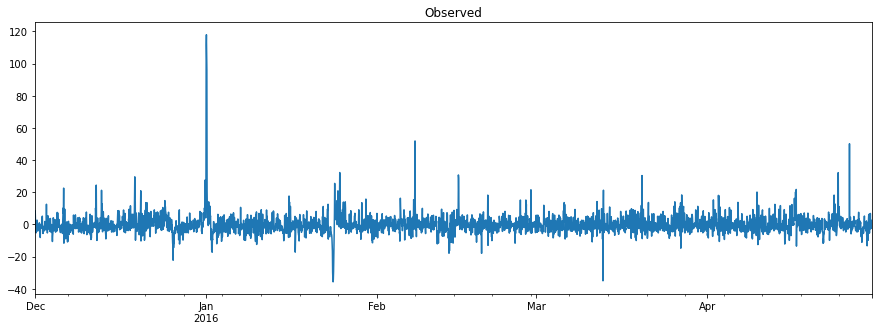

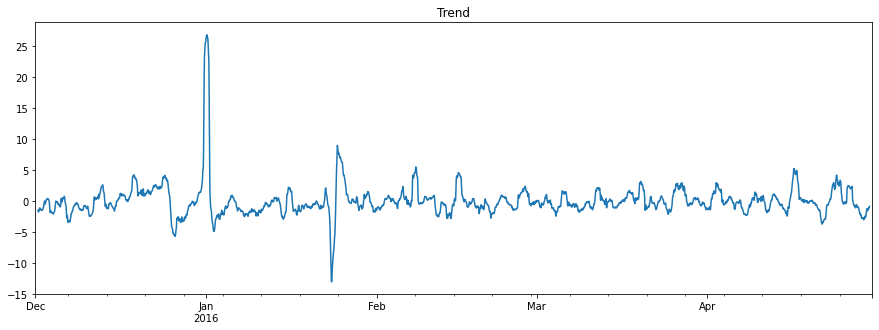

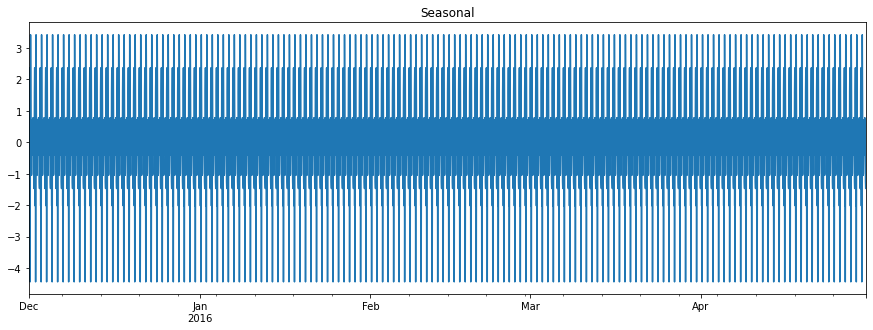

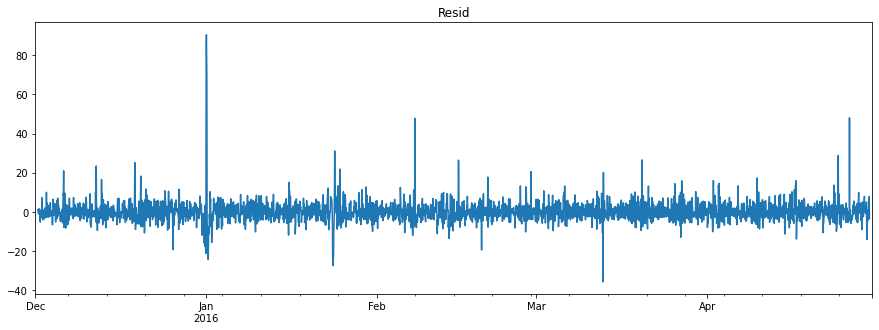

In [141]:
plot_decompose(cell_data_0, 'reg_resid')

In [142]:
# Выполним одно сезонное дифференцирование, затем одно обычное.
cell_data_0['reg_resid_diff'] = cell_data_0.reg_resid - cell_data_0.reg_resid.shift(24)
cell_data_0['reg_resid_diff'] = cell_data_0['reg_resid_diff'] - cell_data_0['reg_resid_diff'].shift(1)

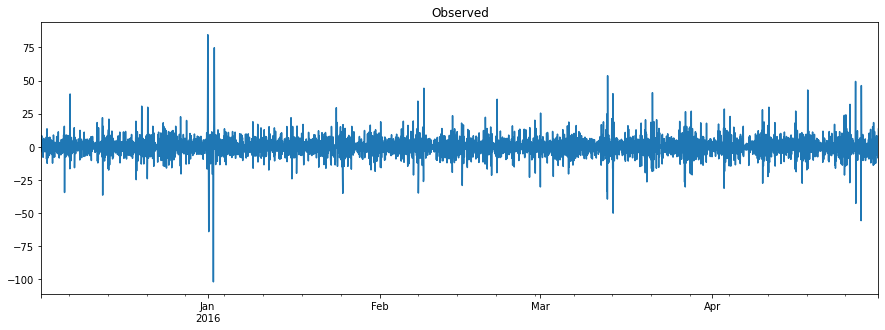

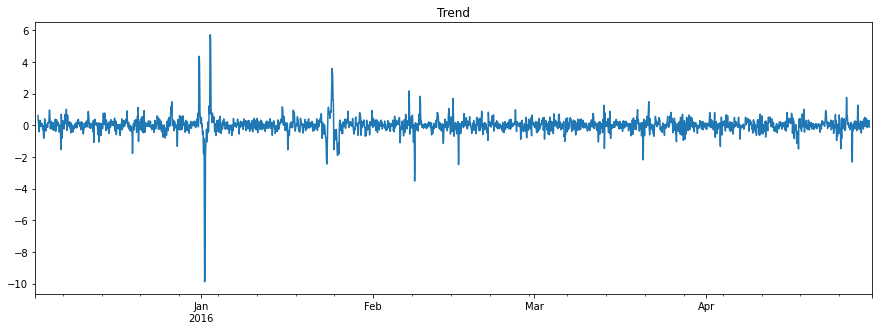

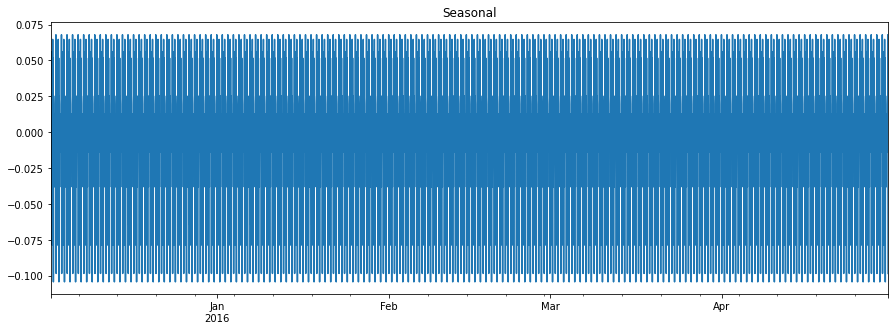

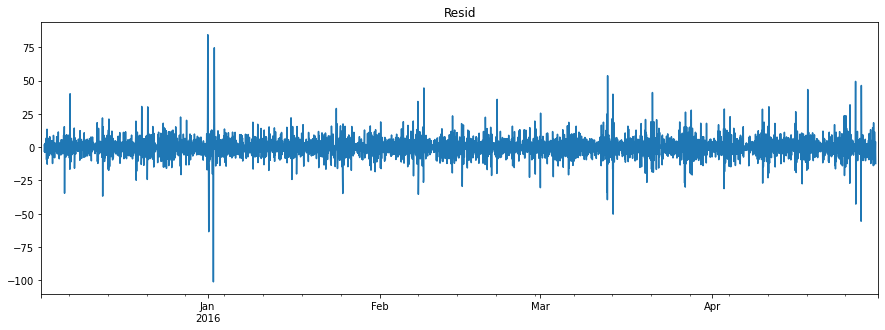

In [143]:
plot_decompose(cell_data_0, 'reg_resid_diff')

In [234]:
# Подберём параметры модели SARIMAX.
d = 1; D = 1

In [235]:
# Построение кореллограмм
def plot_corr(data, lags, cor='acf'):
    fig, ax = plt.subplots(figsize=(15, 5))
    if cor == 'acf':
        sm.graphics.tsa.plot_acf(data.dropna().values.squeeze(), lags=lags, ax=ax)
    elif cor == 'pacf':
        sm.graphics.tsa.plot_pacf(data.dropna().values.squeeze(), lags=lags, ax=ax)
    ax.xaxis.set_ticks(np.arange(0, lags, 10))
    plt.show()

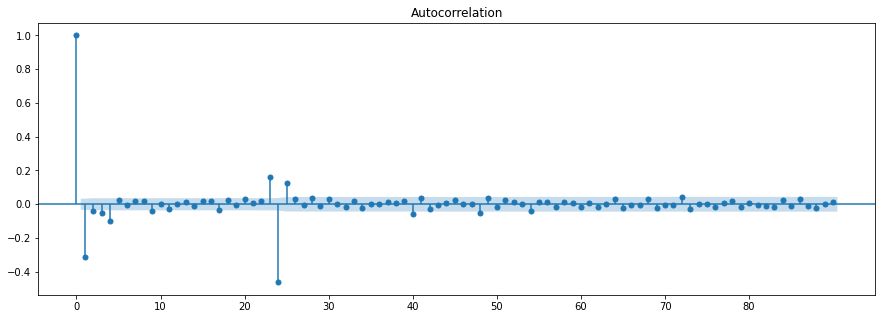

In [236]:
plot_corr(cell_data_0['reg_resid_diff'], 90 , 'acf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 4  

In [238]:
q = 4; Q = 1

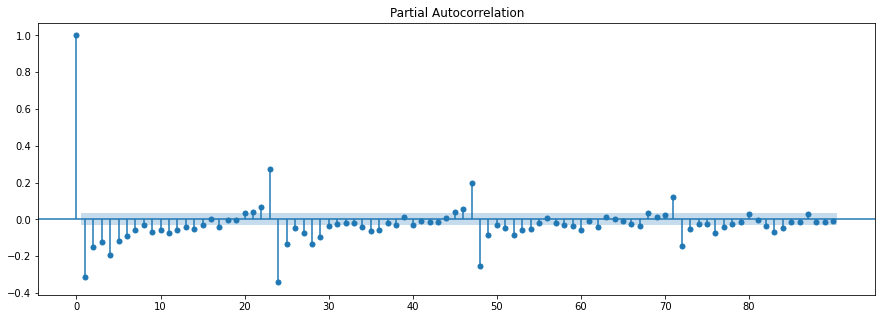

In [239]:
plot_corr(cell_data_0['reg_resid_diff'], 90 , 'pacf')

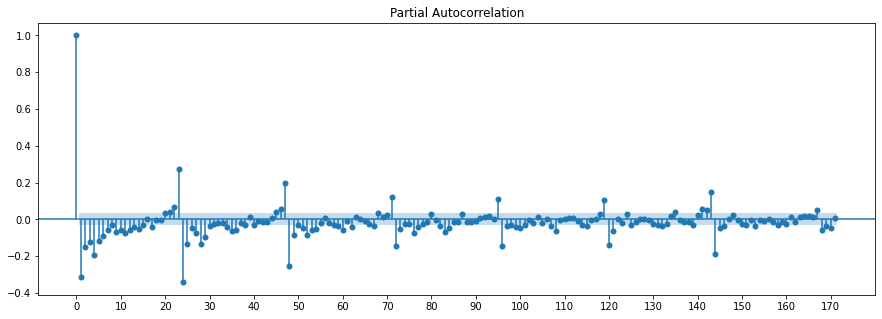

In [149]:
plot_corr(cell_data_0['reg_resid_diff'], 171 , 'pacf')

In [ ]:
Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 15

In [240]:
p = 15; P = 1

In [241]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_0 = product(ps, [d], qs, Ps, [D], Qs)
parameters_0 = list(parameters_0)
len(parameters_0)

320

#### Кластер 1. Анализ временного ряда и первичный подбор параметров модели

In [242]:
cell_data_1 = dec_apr_data[dec_apr_data.region==target_cells[1]].iloc[:, 5:].transpose()
cell_data_1.columns = ['trips']
features_columns_1 = add_features(cell_data_1, K)
reg_model_1 = get_reg_pred(cell_data_1, features_columns_1)

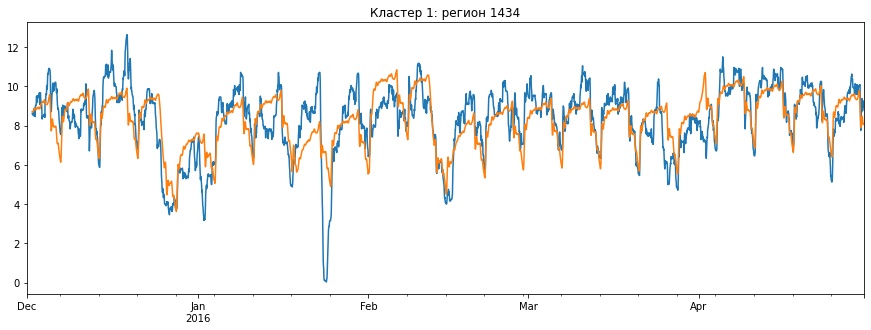

In [243]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_1.trips.rolling(24).mean().plot(ax=ax)
cell_data_1.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 1: регион {}'.format(target_cells[1]))
plt.show()

In [244]:
dump(reg_model_1, 'dumps/reg_model_1.joblib')

['dumps/reg_model_1.joblib']

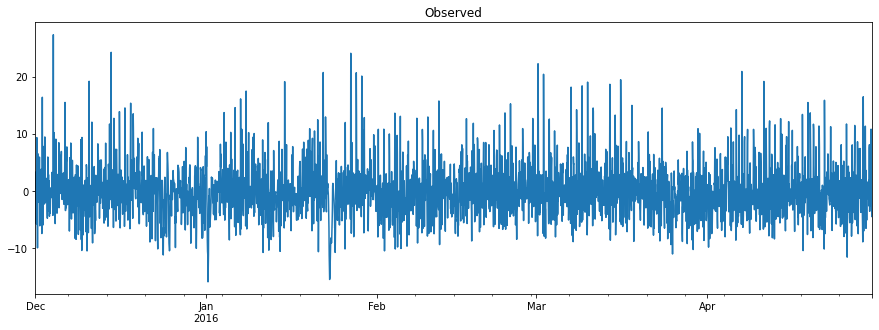

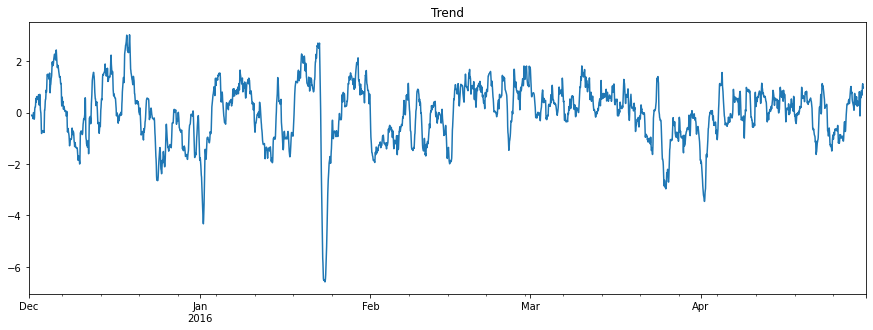

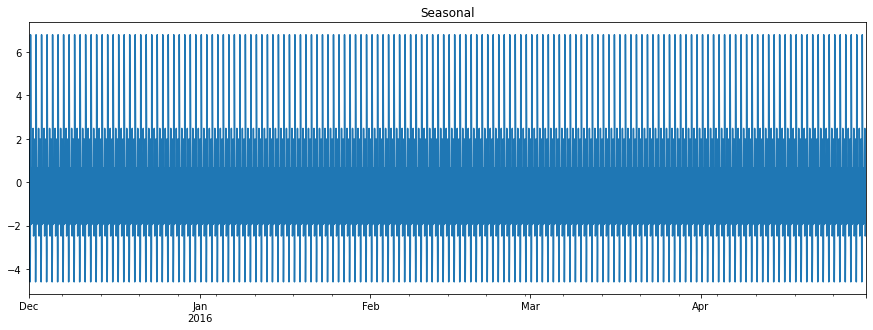

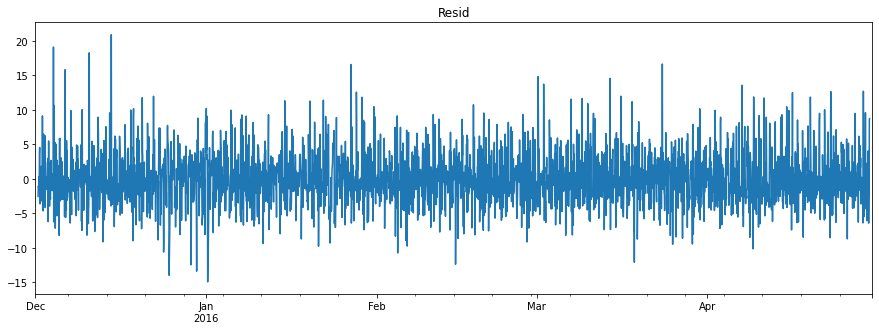

In [245]:
plot_decompose(cell_data_1, 'reg_resid')

In [246]:
cell_data_1['reg_resid_diff'] = cell_data_1.reg_resid - cell_data_1.reg_resid.shift(24)
cell_data_1['reg_resid_diff'] = cell_data_1['reg_resid_diff'] - cell_data_1['reg_resid_diff'].shift(1)

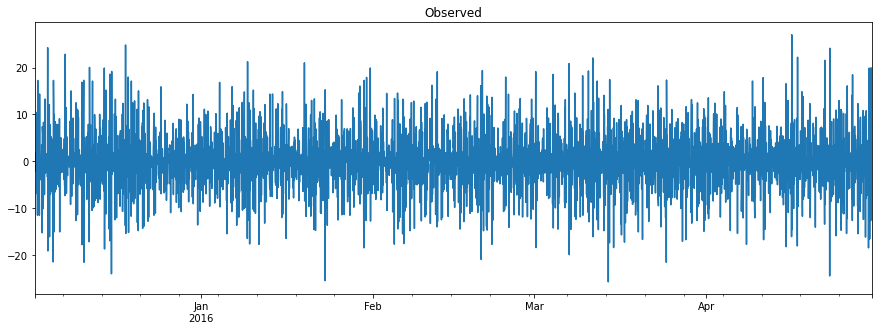

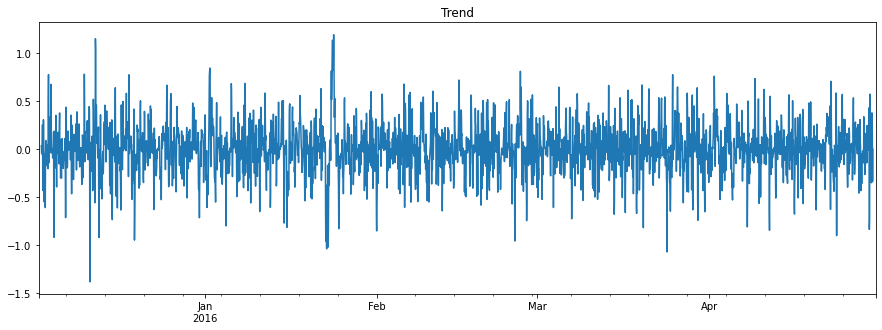

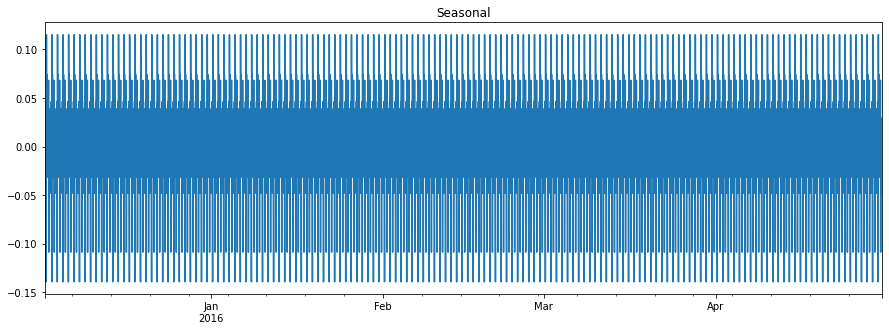

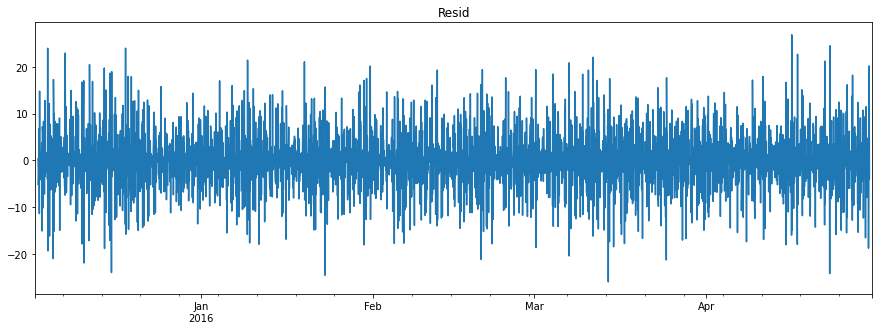

In [247]:
plot_decompose(cell_data_1, 'reg_resid_diff')

In [158]:
d = 1; D = 1

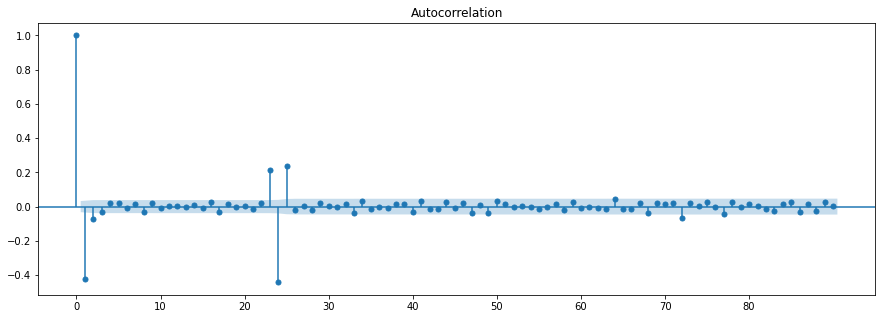

In [248]:
plot_corr(cell_data_1['reg_resid_diff'], 90 , 'acf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 2  

In [250]:
q = 2; Q = 1

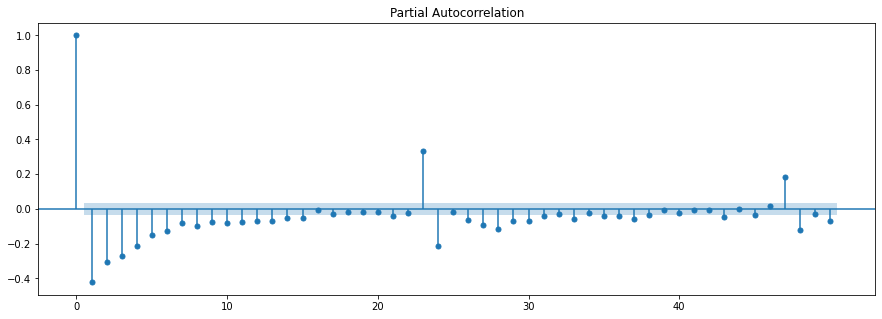

In [251]:
plot_corr(cell_data_1['reg_resid_diff'], 50 , 'pacf')

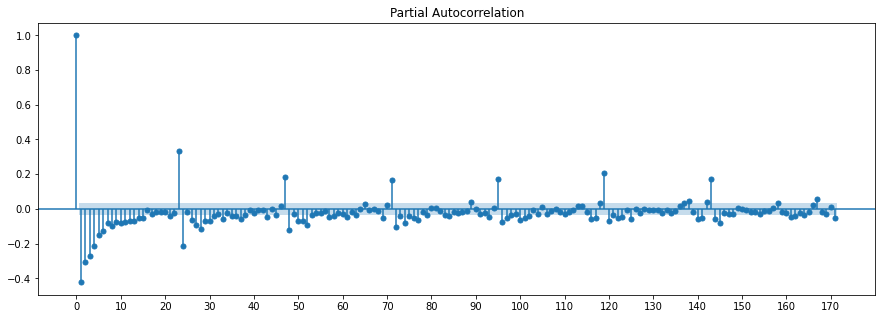

In [252]:
plot_corr(cell_data_1['reg_resid_diff'], 171 , 'pacf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 15  

In [254]:
p = 15; P = 1

In [255]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_1 = product(ps, [d], qs, Ps, [D], Qs)
parameters_1 = list(parameters_1)
len(parameters_1)

192

#### Кластер 2. Анализ временного ряда и первичный подбор параметров модели

In [256]:
cell_data_2 = dec_apr_data[dec_apr_data.region==target_cells[2]].iloc[:, 5:].transpose()
cell_data_2.columns = ['trips']
features_columns_2 = add_features(cell_data_2, K)
reg_model_2 = get_reg_pred(cell_data_2, features_columns_2)

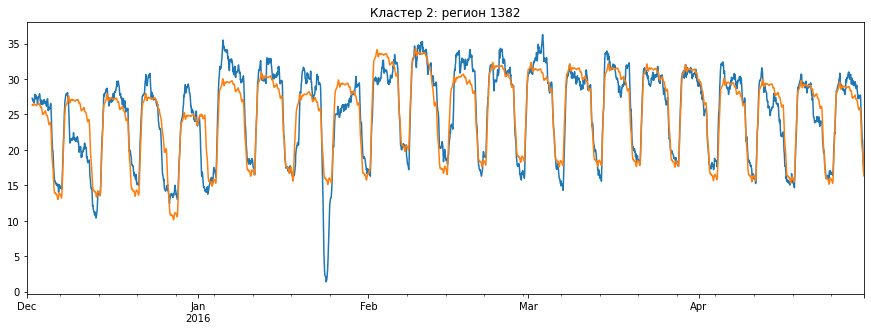

In [257]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_2.trips.rolling(24).mean().plot(ax=ax)
cell_data_2.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 2: регион {}'.format(target_cells[2]))
plt.show()

In [258]:
dump(reg_model_2, 'dumps/reg_model_2.joblib')

['dumps/reg_model_2.joblib']

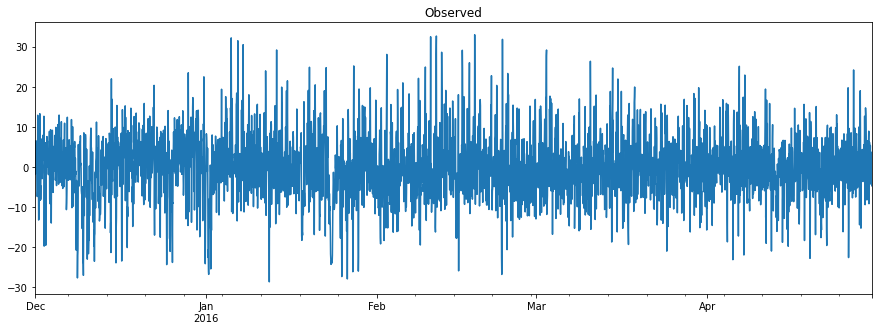

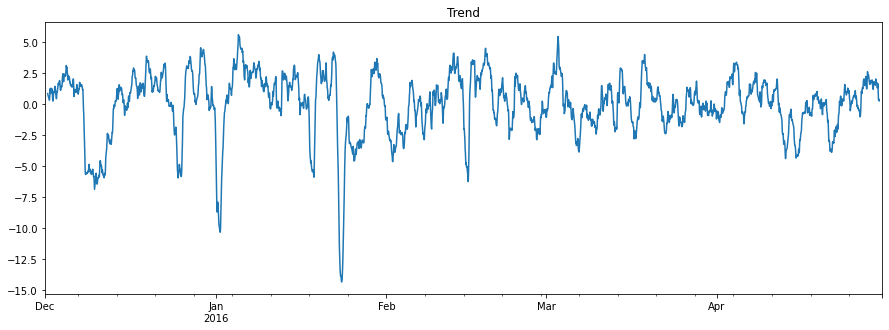

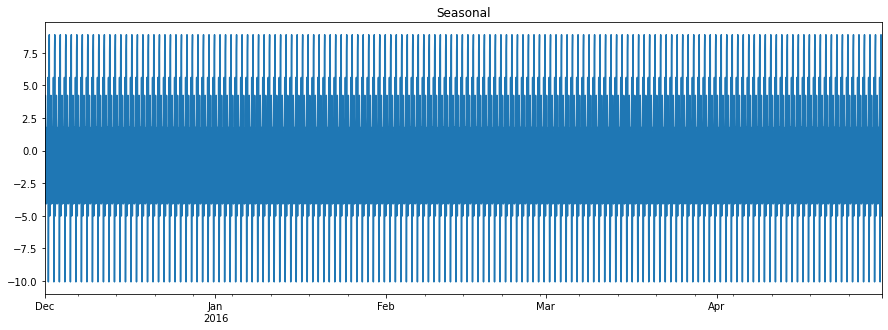

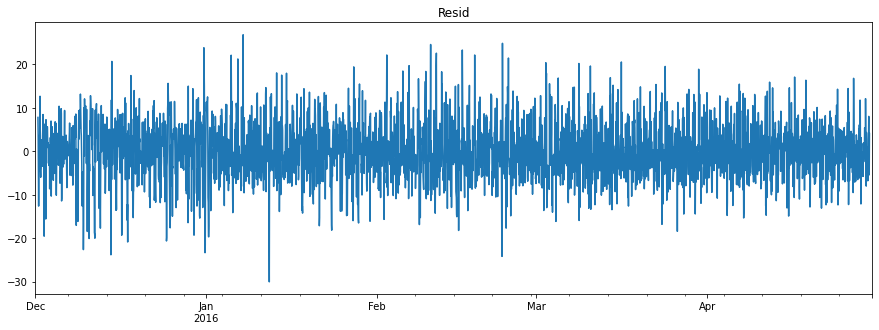

In [259]:
plot_decompose(cell_data_2, 'reg_resid')

In [260]:
cell_data_2['reg_resid_diff'] = cell_data_2.reg_resid - cell_data_2.reg_resid.shift(24)
cell_data_2['reg_resid_diff'] = cell_data_2['reg_resid_diff'] - cell_data_2['reg_resid_diff'].shift(1)

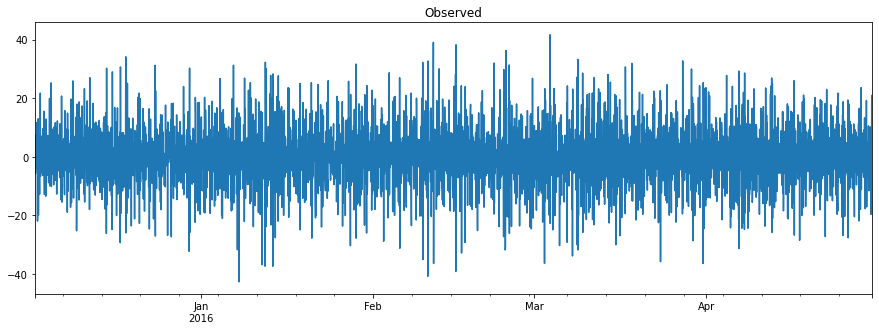

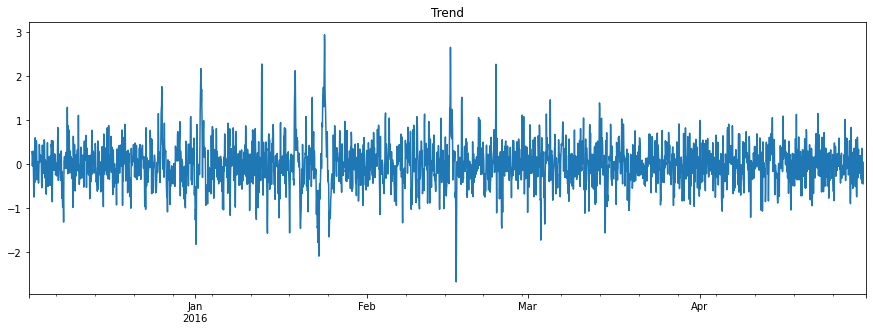

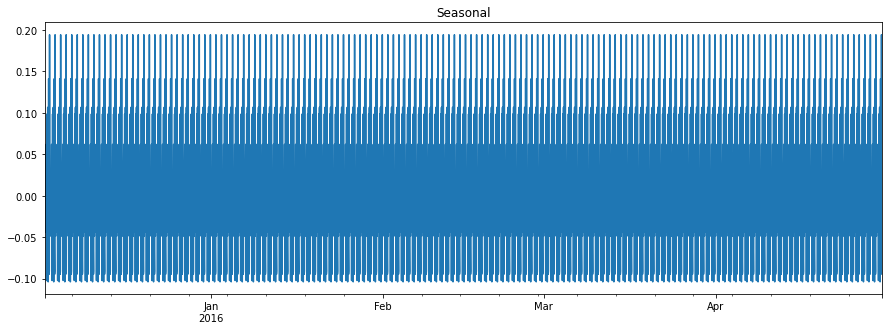

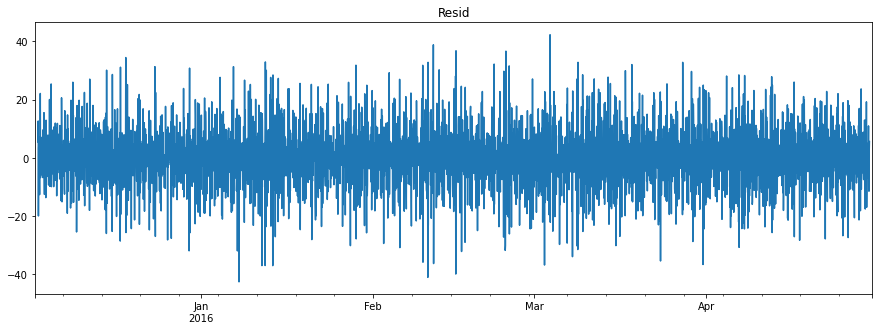

In [261]:
plot_decompose(cell_data_2, 'reg_resid_diff')

In [262]:
d = 1; D = 1

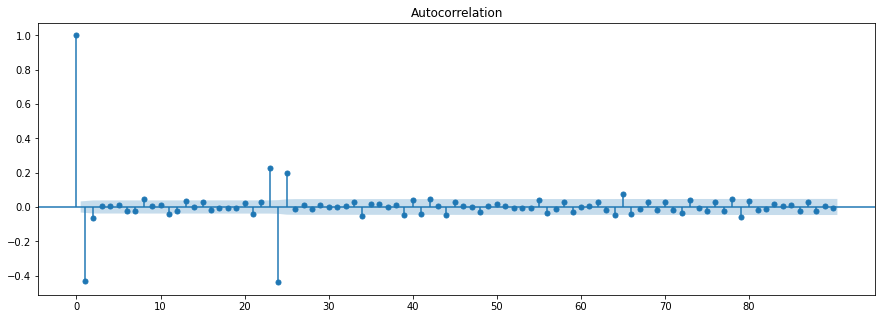

In [263]:
plot_corr(cell_data_2['reg_resid_diff'], 90, 'acf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 2

In [264]:
q = 2; Q = 1

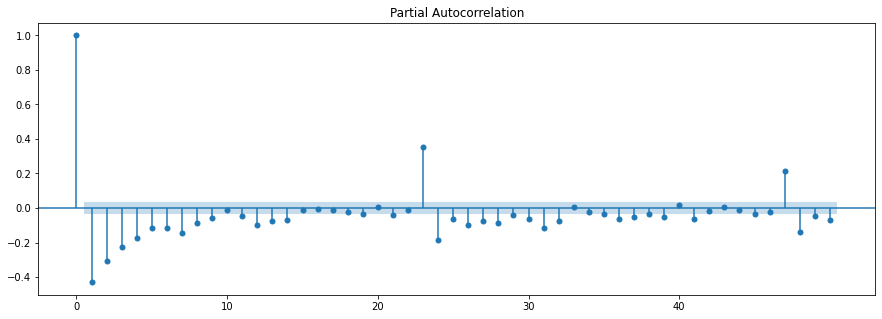

In [265]:
plot_corr(cell_data_2['reg_resid_diff'], 50, 'pacf')

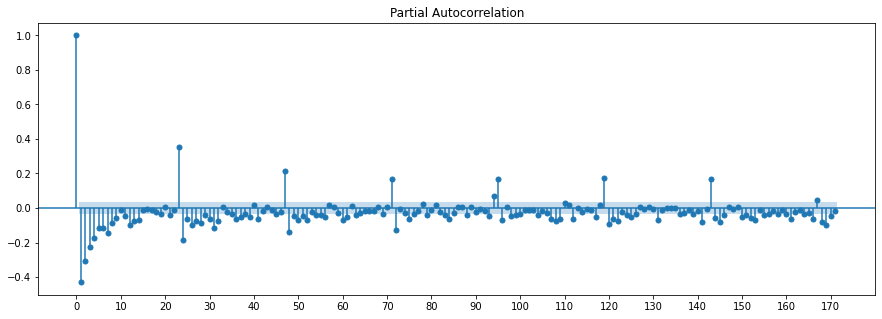

In [266]:
plot_corr(cell_data_2['reg_resid_diff'], 171, 'pacf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 13  

In [267]:
p = 13; P = 1

In [268]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_2 = product(ps, [d], qs, Ps, [D], Qs)
parameters_2 = list(parameters_2)
len(parameters_2)

168

#### Кластер 3. Анализ временного ряда и первичный подбор параметров модели

In [269]:
cell_data_3 = dec_apr_data[dec_apr_data.region==target_cells[3]].iloc[:, 5:].transpose()
cell_data_3.columns = ['trips']
features_columns_3 = add_features(cell_data_3, K)
reg_model_3 = get_reg_pred(cell_data_3, features_columns_3)

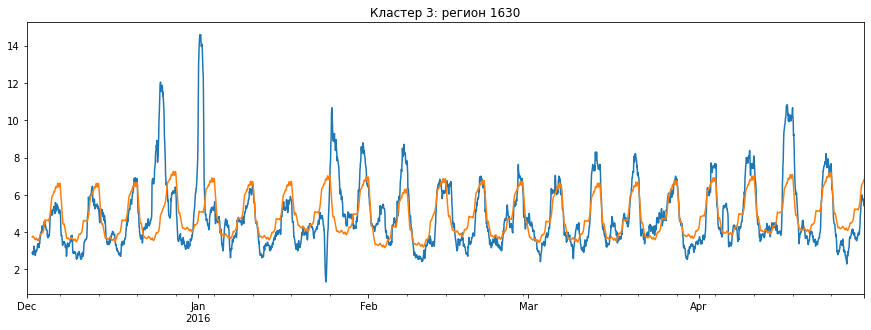

In [270]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_3.trips.rolling(24).mean().plot(ax=ax)
cell_data_3.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 3: регион {}'.format(target_cells[3]))
plt.show()

In [271]:
dump(reg_model_3, 'dumps/reg_model_3.joblib')

['dumps/reg_model_3.joblib']

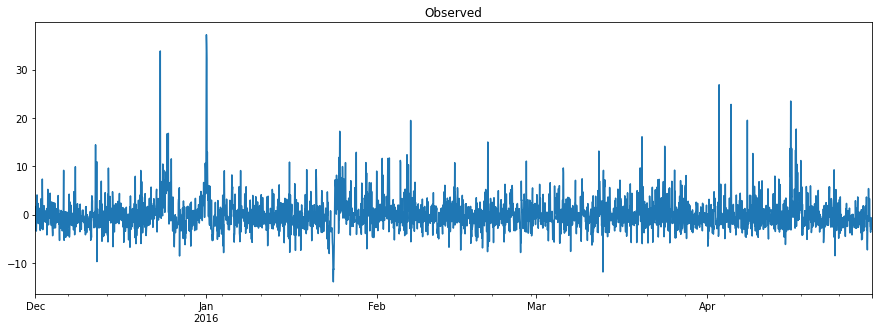

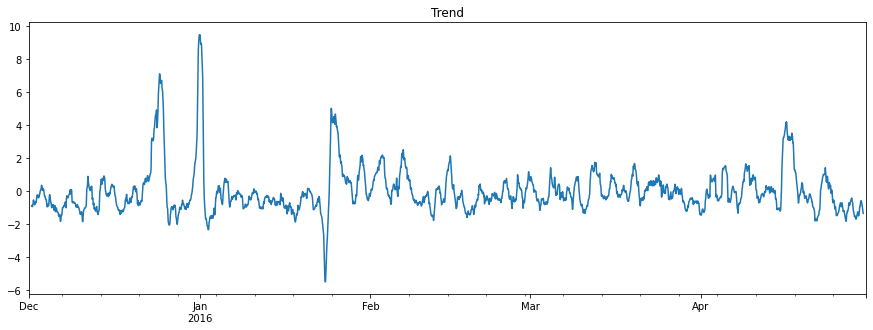

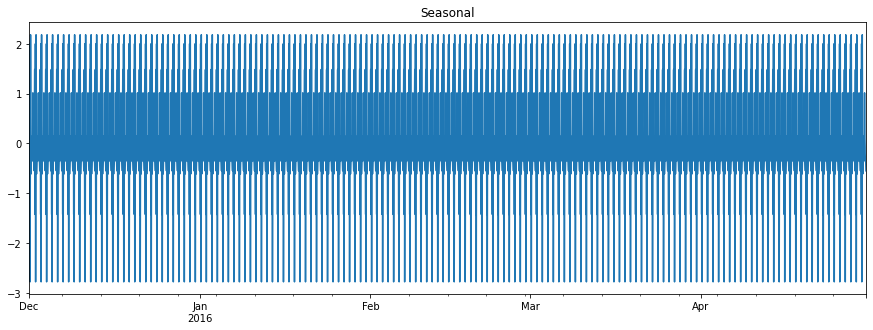

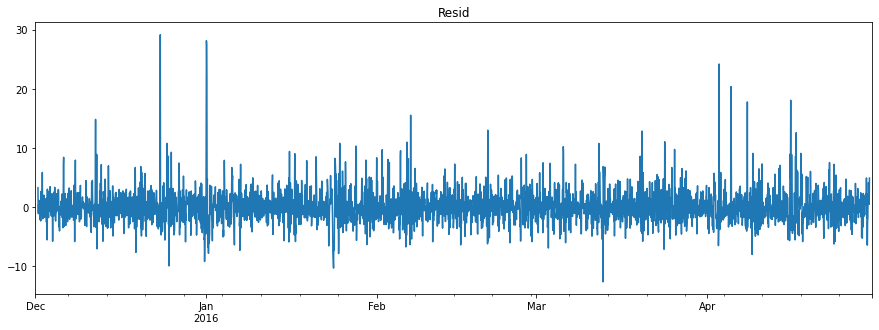

In [272]:
plot_decompose(cell_data_3, 'reg_resid')

In [273]:
cell_data_3['reg_resid_diff'] = cell_data_3.reg_resid - cell_data_3.reg_resid.shift(24)
cell_data_3['reg_resid_diff'] = cell_data_3['reg_resid_diff'] - cell_data_3['reg_resid_diff'].shift(1)

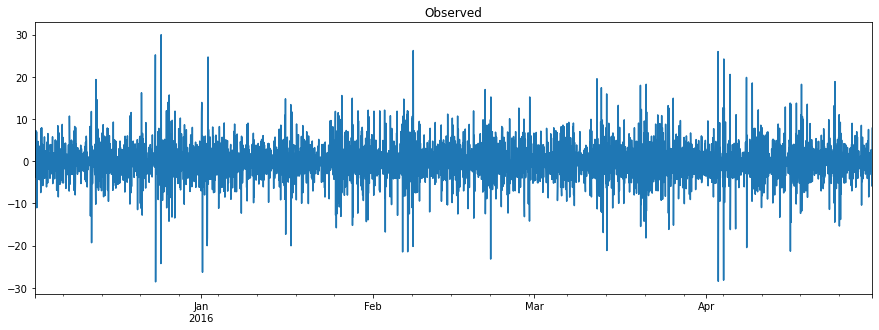

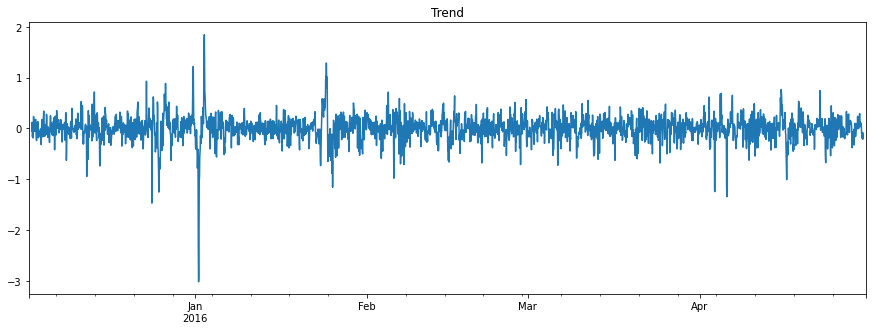

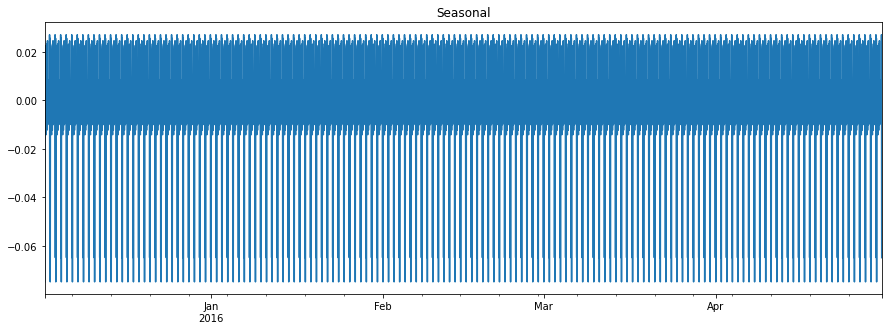

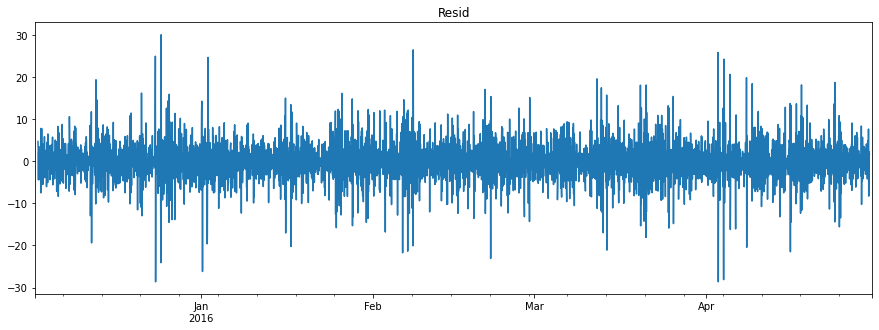

In [274]:
plot_decompose(cell_data_3, 'reg_resid_diff')

In [275]:
d = 1; D = 1

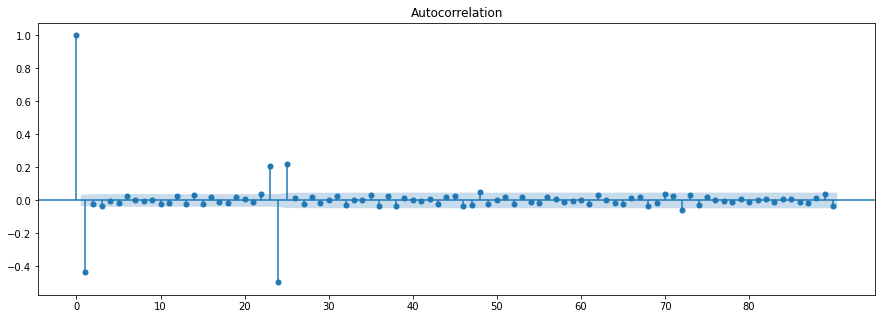

In [276]:
plot_corr(cell_data_3['reg_resid_diff'], 90, 'acf')

In [ ]:
Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 1  

In [277]:
q = 1; Q = 1

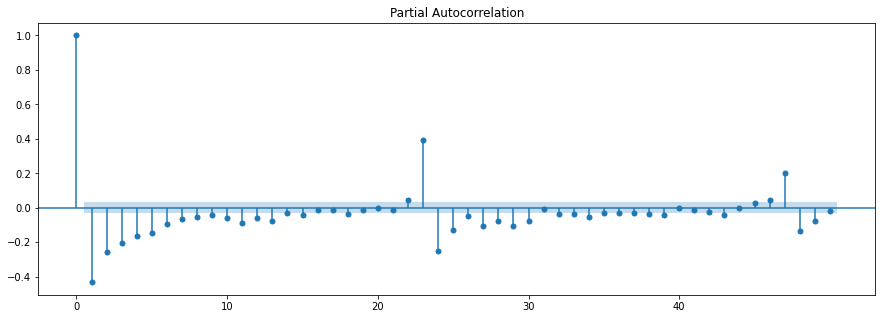

In [278]:
plot_corr(cell_data_3['reg_resid_diff'], 50, 'pacf')

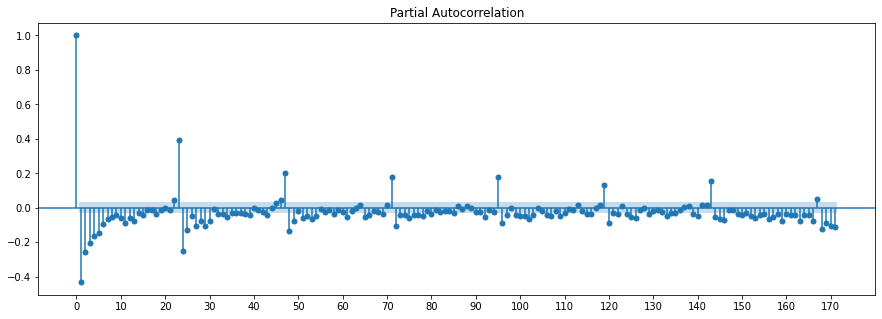

In [279]:
plot_corr(cell_data_3['reg_resid_diff'], 171, 'pacf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 13  

In [281]:
p = 13; P = 1

In [282]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_3 = product(ps, [d], qs, Ps, [D], Qs)
parameters_3 = list(parameters_3)
len(parameters_3)

112

#### Кластер 4. Анализ временного ряда и первичный подбор параметров модели

In [283]:
cell_data_4 = dec_apr_data[dec_apr_data.region==target_cells[4]].iloc[:, 5:].transpose()
cell_data_4.columns = ['trips']
features_columns_4 = add_features(cell_data_4, K)
reg_model_4 = get_reg_pred(cell_data_4, features_columns_4)

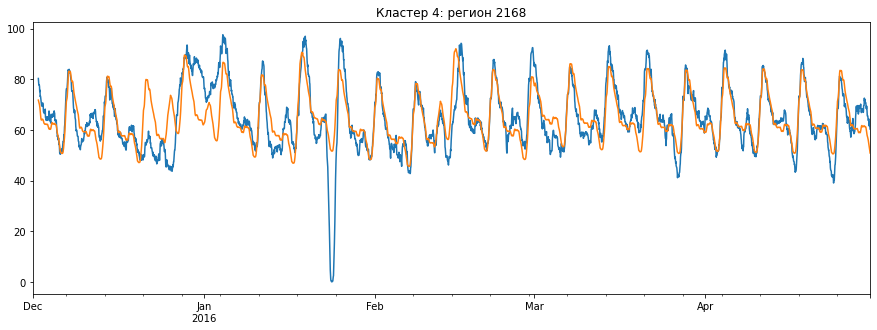

In [284]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_4.trips.rolling(24).mean().plot(ax=ax)
cell_data_4.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 4: регион {}'.format(target_cells[4]))
plt.show()

In [285]:
dump(reg_model_4, 'dumps/reg_model_4.joblib')

['dumps/reg_model_4.joblib']

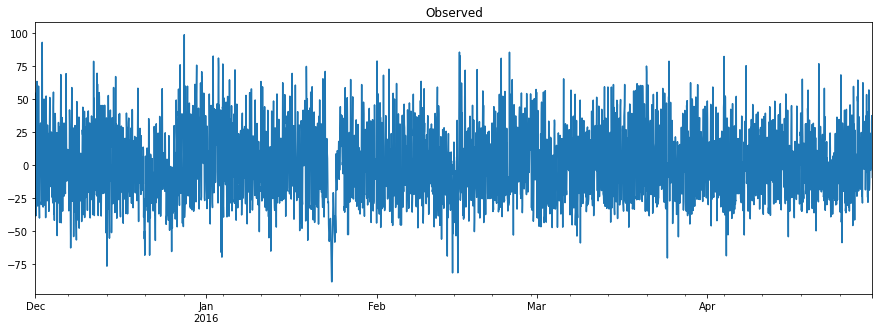

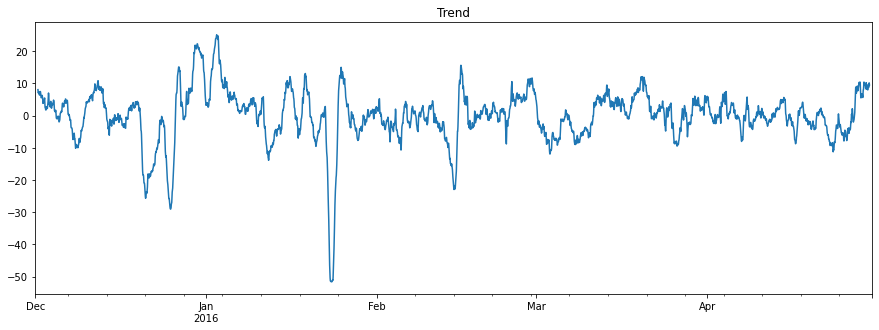

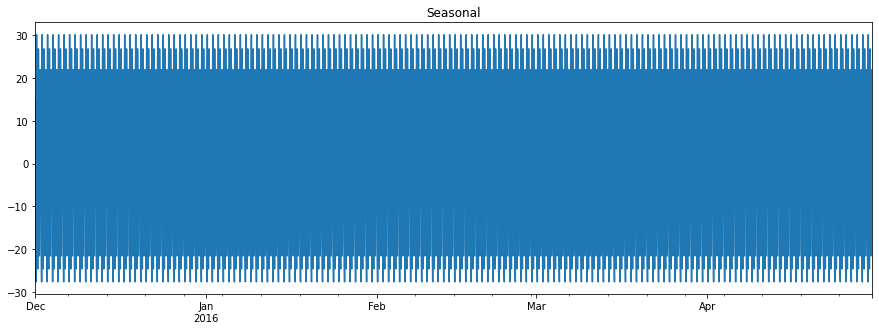

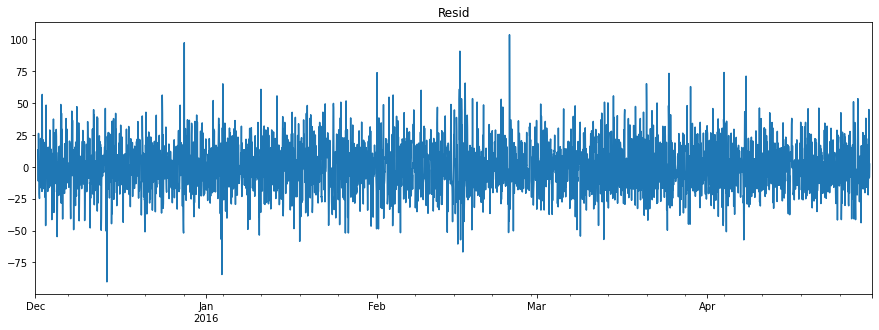

In [286]:
plot_decompose(cell_data_4, 'reg_resid')

In [287]:
cell_data_4['reg_resid_diff'] = cell_data_4.reg_resid - cell_data_4.reg_resid.shift(24)
cell_data_4['reg_resid_diff'] = cell_data_4['reg_resid_diff'] - cell_data_4['reg_resid_diff'].shift(1)

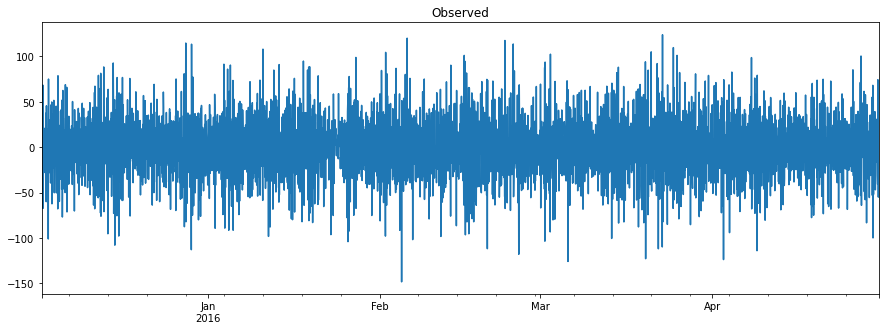

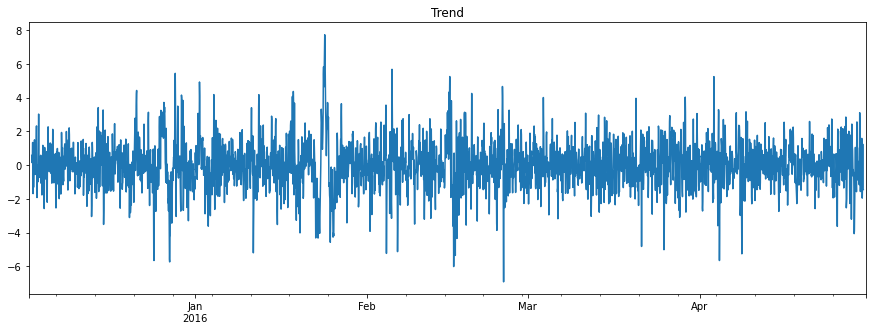

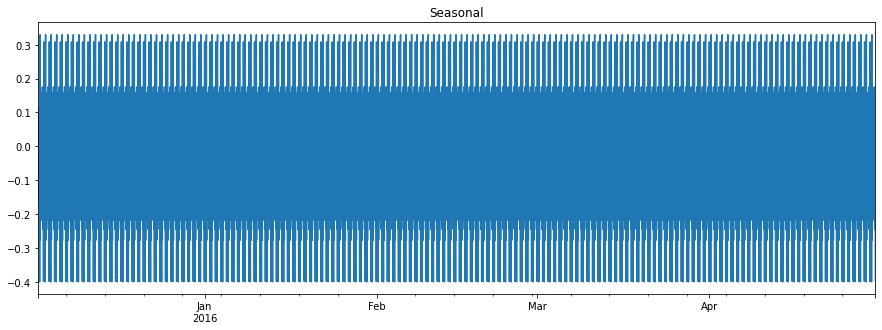

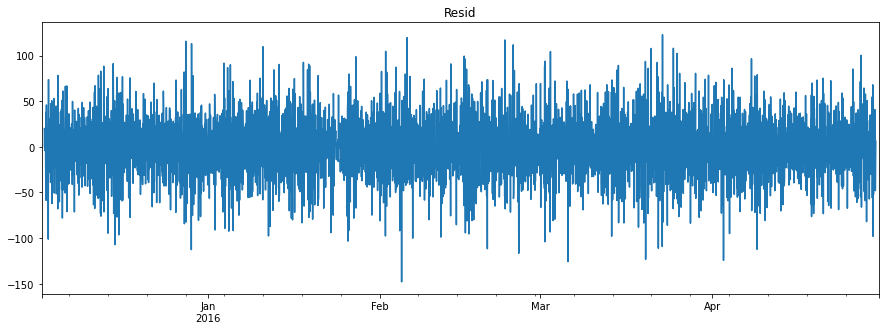

In [288]:
plot_decompose(cell_data_4, 'reg_resid_diff')

In [289]:
d = 1; D = 1

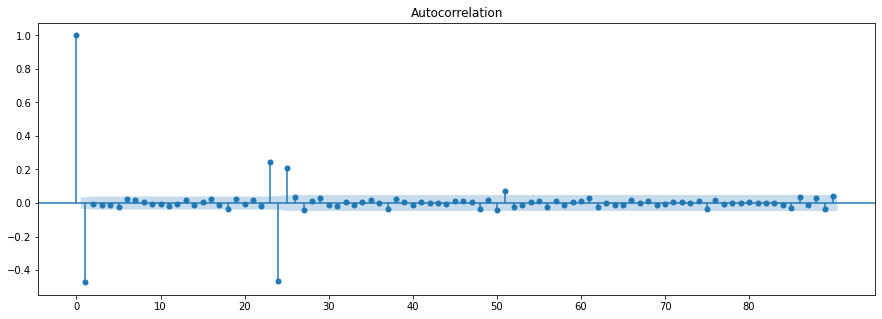

In [290]:
plot_corr(cell_data_4['reg_resid_diff'], 90, 'acf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 1  

In [291]:
q = 1; Q = 1

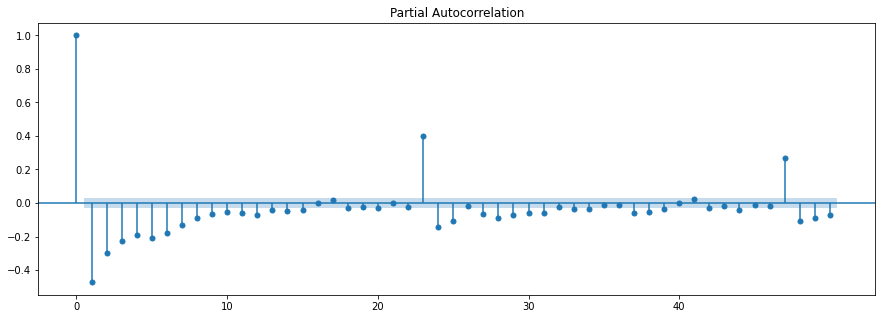

In [292]:
plot_corr(cell_data_4['reg_resid_diff'], 50, 'pacf')

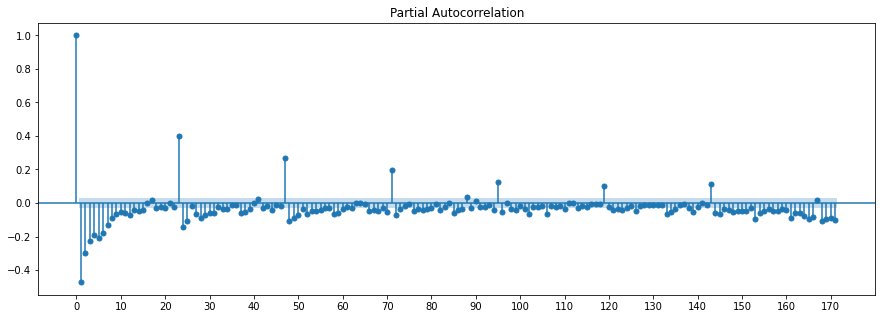

In [293]:
plot_corr(cell_data_4['reg_resid_diff'], 171, 'pacf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 15  

In [295]:
p = 15; P = 1

In [296]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_4 = product(ps, [d], qs, Ps, [D], Qs)
parameters_4 = list(parameters_4)
len(parameters_4)

128

#### Кластер 5. Анализ временного ряда и первичный подбор параметров модели

In [297]:
cell_data_5 = dec_apr_data[dec_apr_data.region==target_cells[5]].iloc[:, 5:].transpose()
cell_data_5.columns = ['trips']
features_columns_5 = add_features(cell_data_5, K)
reg_model_5 = get_reg_pred(cell_data_5, features_columns_5)

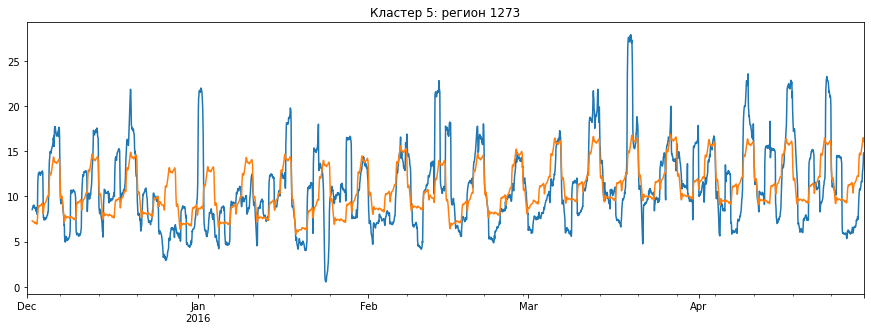

In [298]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_5.trips.rolling(24).mean().plot(ax=ax)
cell_data_5.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 5: регион {}'.format(target_cells[5]))
plt.show()

In [299]:
dump(reg_model_5, 'dumps/reg_model_5.joblib')

['dumps/reg_model_5.joblib']

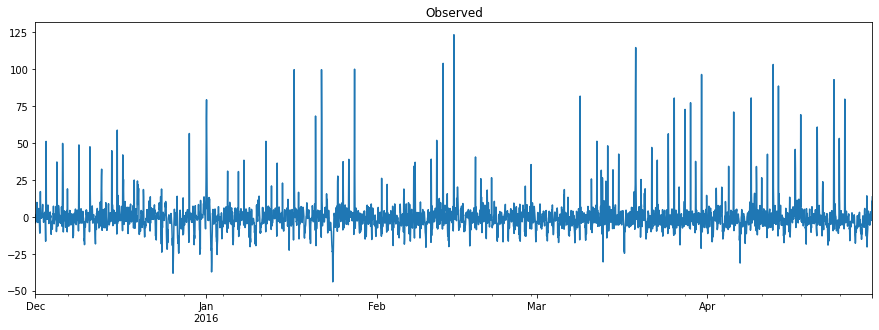

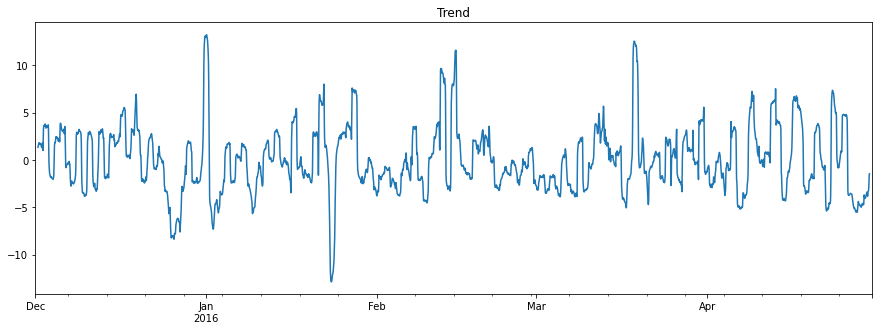

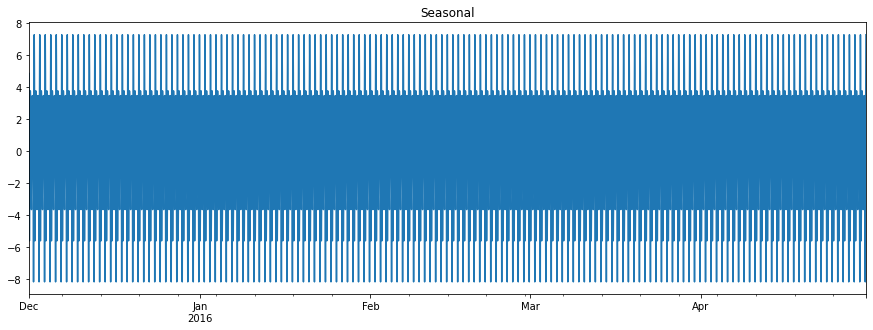

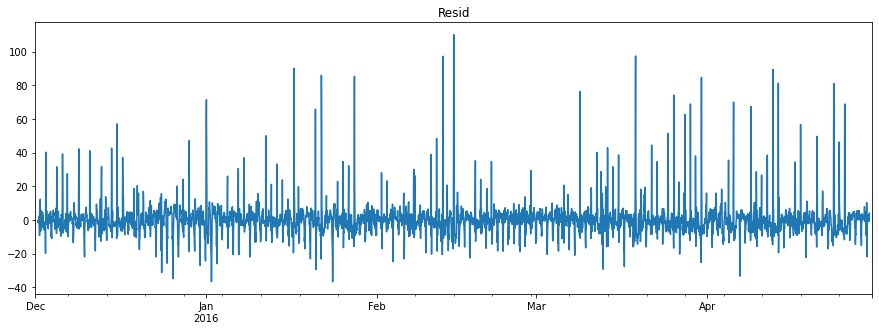

In [300]:
plot_decompose(cell_data_5, 'reg_resid')

In [301]:
cell_data_5['reg_resid_diff'] = cell_data_5.reg_resid - cell_data_5.reg_resid.shift(24)
cell_data_5['reg_resid_diff'] = cell_data_5['reg_resid_diff'] - cell_data_5['reg_resid_diff'].shift(1)

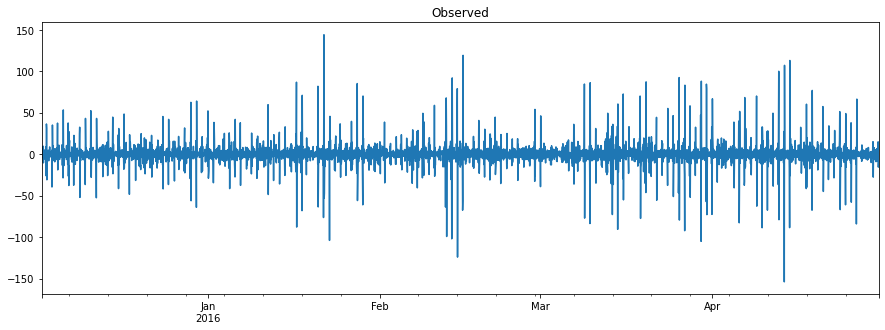

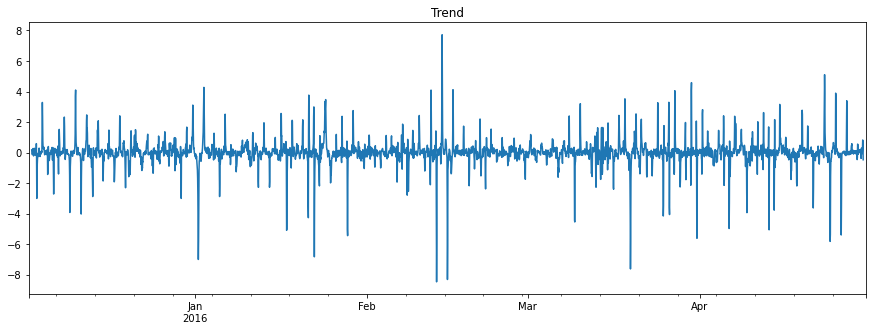

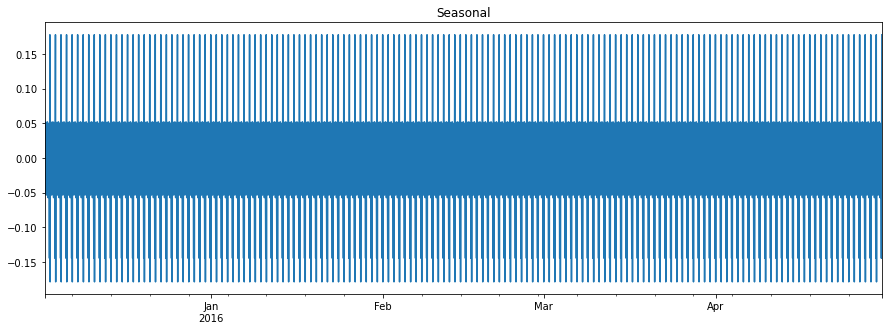

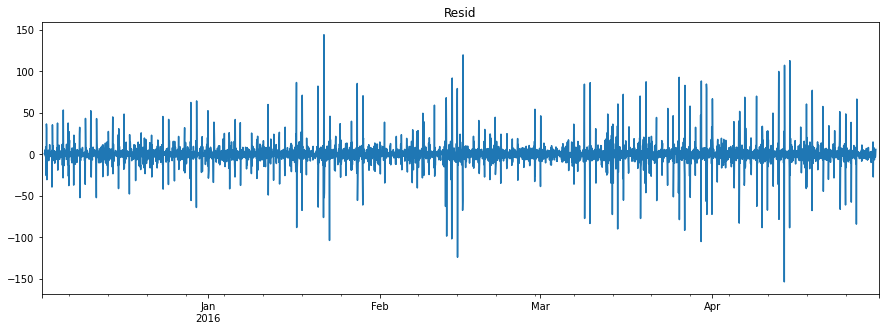

In [302]:
plot_decompose(cell_data_5, 'reg_resid_diff')

In [303]:
d = 1; D = 1

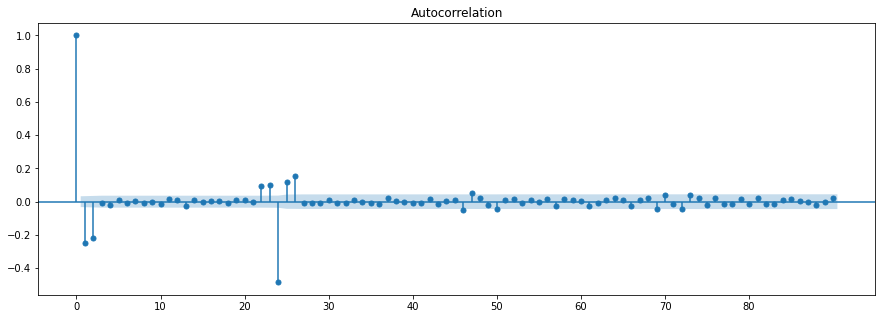

In [304]:
plot_corr(cell_data_5['reg_resid_diff'], 90, 'acf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 23  

In [307]:
q = 23; Q = 1

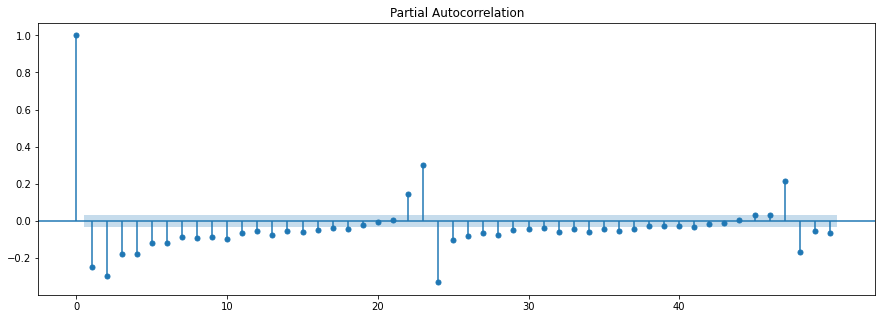

In [308]:
plot_corr(cell_data_5['reg_resid_diff'], 50, 'pacf')

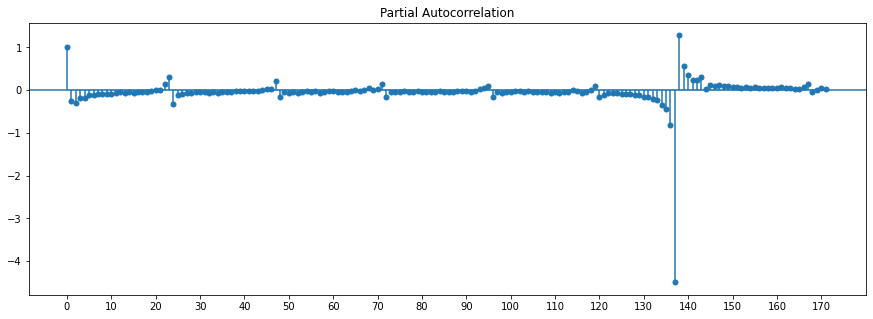

In [309]:
plot_corr(cell_data_5['reg_resid_diff'], 171, 'pacf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 16  

In [311]:
p = 16; P = 1

In [312]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_5 = product(ps, [d], qs, Ps, [D], Qs)
parameters_5 = list(parameters_5)
len(parameters_5)

1632

#### Кластер 6. Анализ временного ряда и первичный подбор параметров модели

In [313]:
cell_data_6 = dec_apr_data[dec_apr_data.region==target_cells[6]].iloc[:, 5:].transpose()
cell_data_6.columns = ['trips']
features_columns_6 = add_features(cell_data_6, K)
reg_model_6 = get_reg_pred(cell_data_6, features_columns_6)

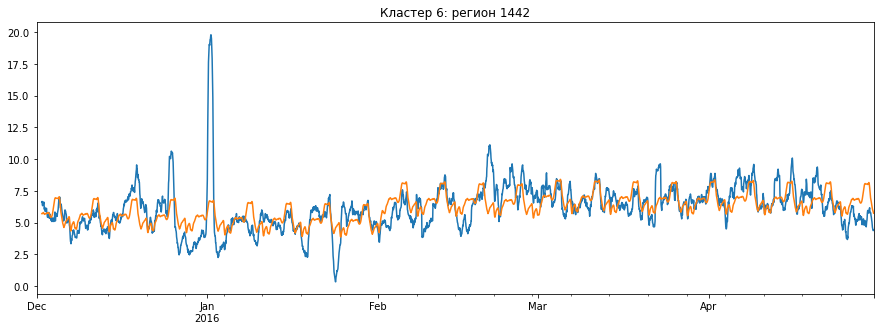

In [314]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_6.trips.rolling(24).mean().plot(ax=ax)
cell_data_6.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 6: регион {}'.format(target_cells[6]))
plt.show()

In [315]:
dump(reg_model_6, 'dumps/reg_model_6.joblib')

['dumps/reg_model_6.joblib']

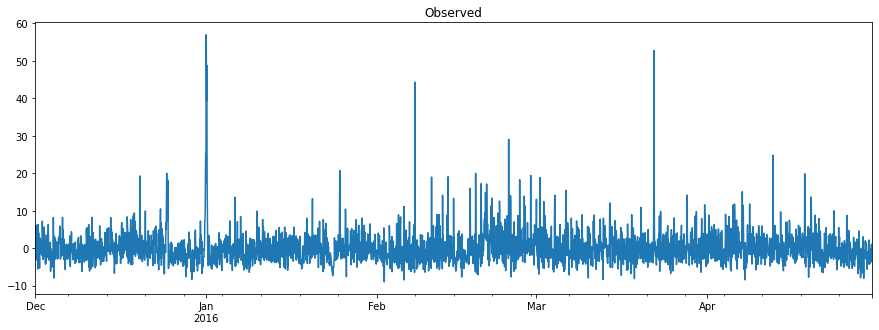

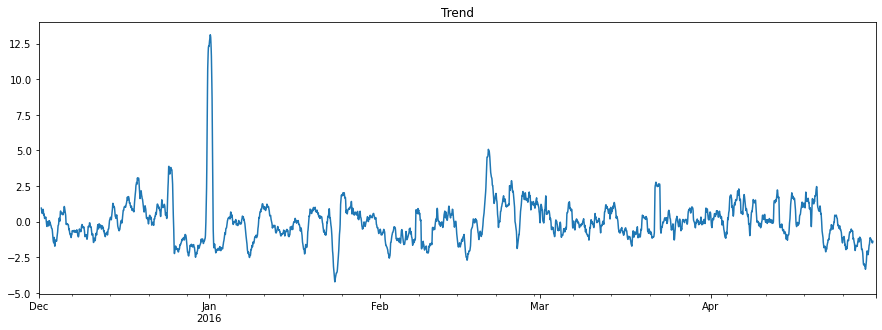

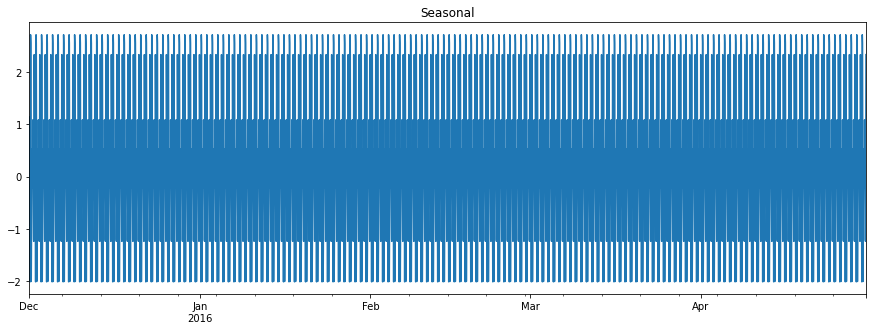

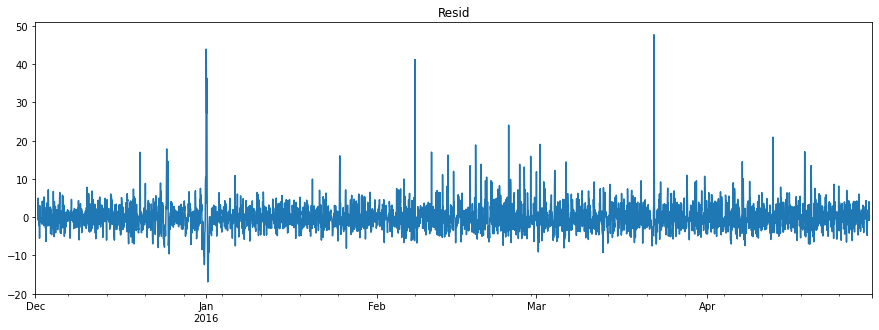

In [316]:
plot_decompose(cell_data_6, 'reg_resid')

In [317]:
cell_data_6['reg_resid_diff'] = cell_data_6.reg_resid - cell_data_6.reg_resid.shift(24)
cell_data_6['reg_resid_diff'] = cell_data_6['reg_resid_diff'] - cell_data_6['reg_resid_diff'].shift(1)

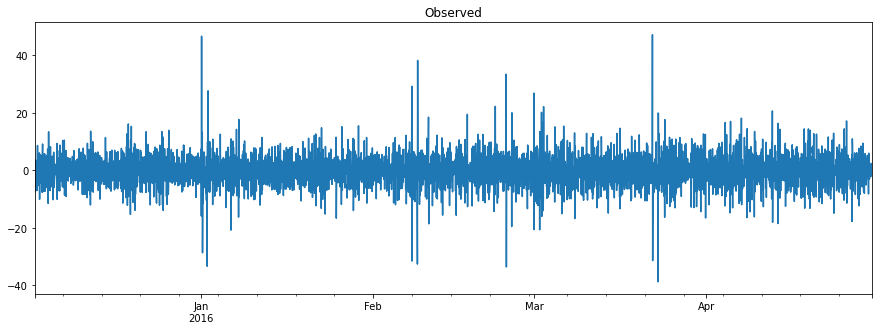

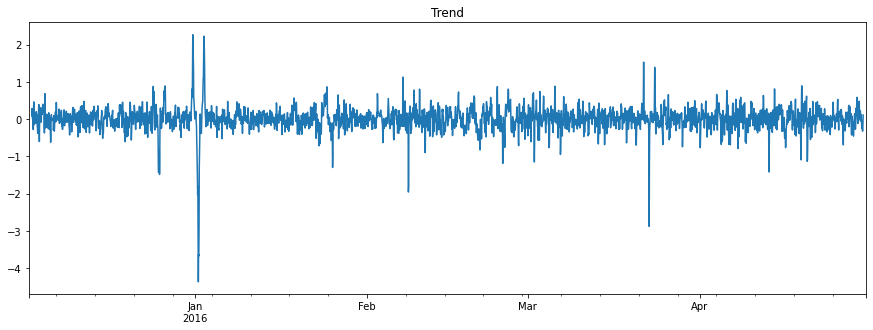

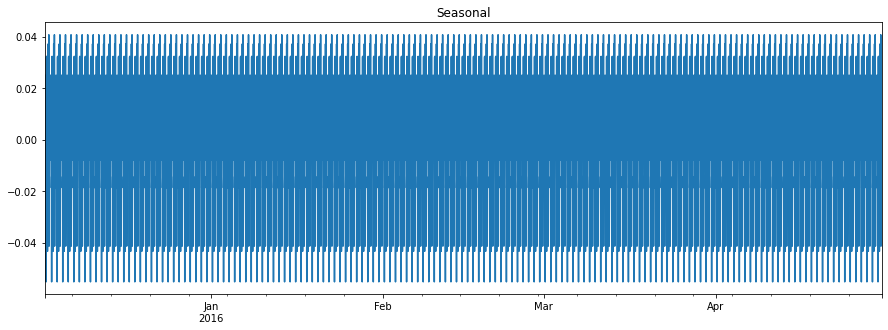

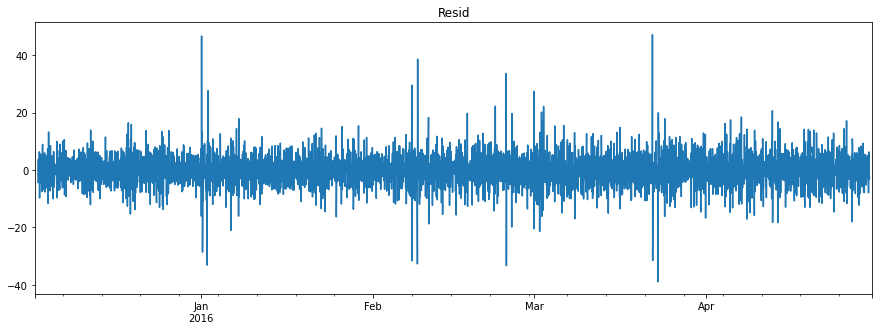

In [318]:
plot_decompose(cell_data_6, 'reg_resid_diff')

In [319]:
d = 1; D = 1

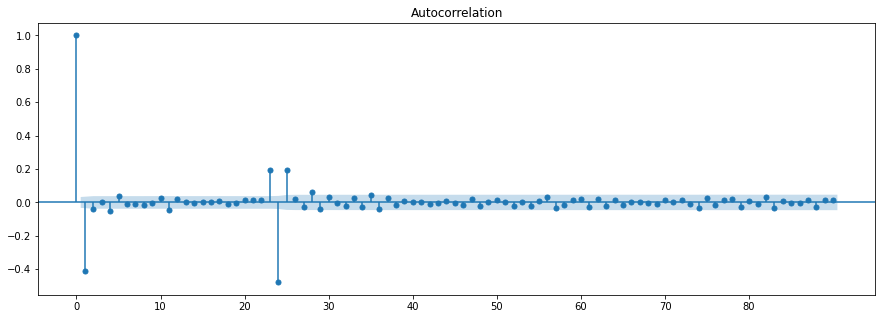

In [320]:
plot_corr(cell_data_6['reg_resid_diff'], 90, 'acf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 1  

In [322]:
q = 1; Q = 1

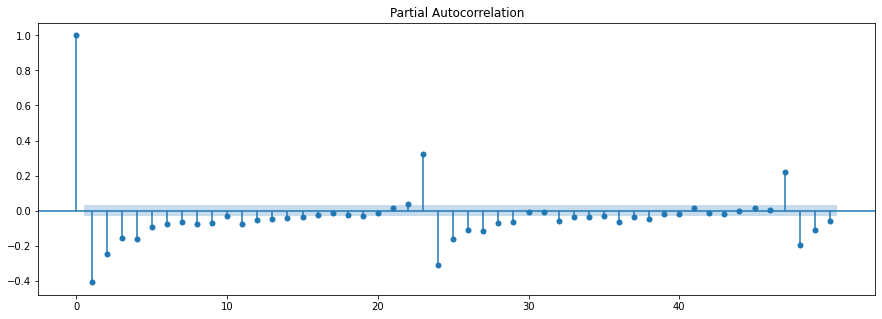

In [323]:
plot_corr(cell_data_6['reg_resid_diff'], 50, 'pacf')

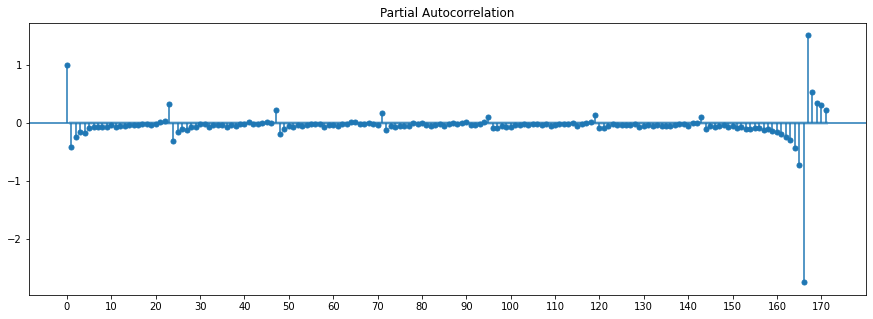

In [324]:
plot_corr(cell_data_6['reg_resid_diff'], 171, 'pacf')

Последний значимый сезонный лаг - 24  
Последний значимый несезонный лаг - 12  

In [325]:
p = 12; P = 1

In [326]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_6 = product(ps, [d], qs, Ps, [D], Qs)
parameters_6 = list(parameters_6)
len(parameters_6)

104

### Настройка SARIMAX
Перебирать все варианты параметров не будем, ограничим время перебора циклов.

In [327]:
from joblib import dump
from scipy import stats as sts

#### Кластер 0.

In [328]:
import gc
from pympler import muppy, summary

In [ ]:
# # для ускорения работы, перемешаем набор параметров. выведем первые 5 для наглядности
# np.random.shuffle(parameters_0)
# print(*parameters_0[:5], sep='\n')

In [347]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_0)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_0:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_0['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
        
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)
    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

#     # остановка по времени выполнения, 2 часа
#     if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
#         print("TIME LIMIT EXCEEDED -> STOPPED")
#         break

Всего параметров к перебору:  320
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 86633
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
3 - (0, 1, 0, 1, 1, 0) ...START -> At iterate    0    f=  3.27139D+00    |proj g|=  3.13933D-02

At iterate    5    f=  3.25548D+00    |proj g|=  3.07895D-02

At iterate   10    f=  3.25448D+00    |proj g|=  1.67013D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstraine

DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
89 - (4, 1, 2, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
90 - (4, 1, 2, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
91 - (4, 1, 2, 1, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
92 - (4, 1, 2, 1, 1, 1) ...START -> F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     40     54      1     0     0   1.046D-03   3.041D+00
  F =   3.0406852861203069     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.27458D+00    |proj g|=  3.60663D-02

At iterate    5    f=  3.24964D+00 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is u

DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
304 - (15, 1, 0, 1, 1, 1) ...START -> At iterate   10    f=  3.36189D+00    |proj g|=  5.06159D-02

At iterate   15    f=  3.34810D+00    |proj g|=  4.45950D-02

At iterate   20    f=  3.34205D+00    |proj g|=  3.65580D-02

At iterate   25    f=  3.33776D+00    |proj g|=  6.90809D-02

At iterate   30    f=  3.33479D+00    |proj g|=  6.45641D-02

At iterate   35    f=  3.33240D+00    |proj g|=  2.56062D-02

At iterate   40    f=  3.32338D+00    |proj g|=  7.61220D-02

At iterate   45    f=  3.31211D+00    |proj g|=  1.48672D-01

At iterate   50    f=  3.31072D+00    |proj g|=  3.87931D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = f

In [348]:
dump(best_param, 'dumps/orders_0.joblib')
dump(best_model.params, 'dumps/params_0.joblib')

['dumps/params_0.joblib']

In [349]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                            reg_resid   No. Observations:                 3648
Model:             SARIMAX(7, 1, 2)x(0, 1, [1], 24)   Log Likelihood              -11062.380
Date:                              Mon, 08 Aug 2022   AIC                          22146.761
Time:                                      13:05:50   BIC                          22214.907
Sample:                                  12-01-2015   HQIC                         22171.039
                                       - 04-30-2016                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4972      0.049    -10.102      0.000      -0.594      -0.401
ar.L2          0.5956      0.026     23.304      0.000       0.545       0.646
ar.L3          0.0850      0.010      8.528      0.000       0.065       0.105
ar.L4         -0.0830      0.009     -8.924      0.000      -0.101      -0.065
ar.L5          0.0248      0.012      1.995      0.046       0.000       0.049
ar.L6          0.1357      0.013     10.226      0.000       0.110       0.162
ar.L7          0.0599      0.012      4.910      0.000       0.036       0.084
ma.L1         -0.0149      0.062     -0.238      0.812      -0.137       0.107
ma.L2         -0.9850      0.071    -13.856      0.000      -1.124      -0.846
ma.S.L24      -0.9818      0.005   -179.991      0.000      -0.993      -0.971
sigma2        25.6667      1.138     22.549      0.000      23.436      27.898
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            385935.51
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.80   Skew:                             3.10
Prob(H) (two-sided):                  0.00   Kurtosis:                        53.18
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

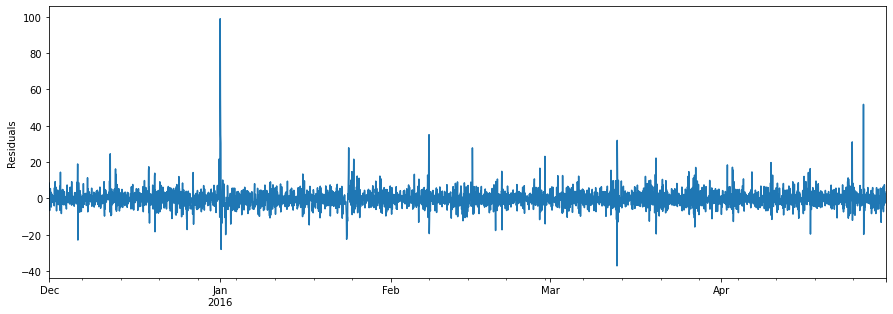

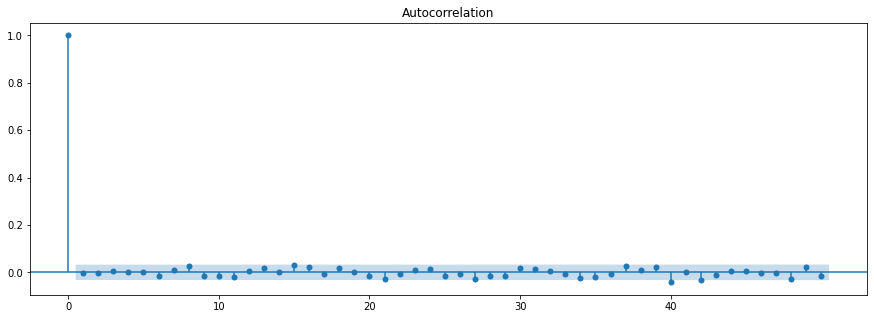

Критерий Стьюдента: p=0.60
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=0.96


In [350]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [351]:
dump(best_model.resid, 'dumps/sarmx_resid_0.joblib')
best_model = None

#### Кластер 1.

In [352]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_1)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_1:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_1['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
        
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)
    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

#     # остановка по времени выполнения, 2 часа
#     if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
#         print("TIME LIMIT EXCEEDED -> STOPPED")
#         break

Всего параметров к перебору:  192
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 7602
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START -> At iterate    5    f=  3.07720D+00    |proj g|=  1.08494D-01

At iterate   10    f=  3.04499D+00    |proj g|=  8.80828D-03

At iterate   15    f=  3.03728D+00    |proj g|=  3.17075D-02

At iterate   20    f=  3.03193D+00    |proj g|=  2.36282D-02

At iterate   25    f=  3.03124D+00    |proj g|=  1.37138D-03

At iterate   30    f=  3.03123D+00    |proj g|=  1.18250D-04

At iterate   35    f=  3.03122D+00    |proj g|=  2.66203D-03

At iterate   40    f=  3.03115D+00    |proj g|=  1.54457D-03

At iterate   45    f=  3.03112D+00    |proj g|=  3.24548D-04

At iterate   50    f=  3.03110D+00    |proj g|=  1.72958D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number

In [353]:
dump(best_param, 'dumps/orders_1.joblib')
dump(best_model.params, 'dumps/params_1.joblib')

['dumps/params_1.joblib']

In [354]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                       
=============================================================================================
Dep. Variable:                             reg_resid   No. Observations:                 3648
Model:             SARIMAX(15, 1, 2)x(1, 1, [1], 24)   Log Likelihood               -9836.747
Date:                               Mon, 08 Aug 2022   AIC                          19713.494
Time:                                       18:49:51   BIC                          19837.395
Sample:                                   12-01-2015   HQIC                         19757.635
                                        - 04-30-2016                                         
Covariance Type:                                 opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7829      0.018    -44.591      0.000      -0.817      -0.748
ar.L2          0.2016      0.018     11.313      0.000       0.167       0.236
ar.L3         -0.0233      0.019     -1.220      0.223      -0.061       0.014
ar.L4          0.0412      0.020      2.014      0.044       0.001       0.081
ar.L5          0.1114      0.022      5.161      0.000       0.069       0.154
ar.L6          0.0663      0.022      3.044      0.002       0.024       0.109
ar.L7          0.0256      0.023      1.121      0.262      -0.019       0.070
ar.L8         -0.0069      0.023     -0.305      0.760      -0.051       0.037
ar.L9         -0.0054      0.024     -0.227      0.821      -0.053       0.042
ar.L10         0.0316      0.022      1.435      0.151      -0.012       0.075
ar.L11         0.0389      0.023      1.713      0.087      -0.006       0.083
ar.L12         0.0481      0.022      2.145      0.032       0.004       0.092
ar.L13         0.0497      0.023      2.178      0.029       0.005       0.094
ar.L14         0.0493      0.023      2.157      0.031       0.005       0.094
ar.L15         0.0285      0.018      1.577      0.115      -0.007       0.064
ma.L1         -0.0063      0.088     -0.072      0.942      -0.178       0.166
ma.L2         -0.9936      0.087    -11.452      0.000      -1.164      -0.824
ar.S.L24       0.1718      0.013     12.939      0.000       0.146       0.198
ma.S.L24      -0.9758      0.005   -215.034      0.000      -0.985      -0.967
sigma2        13.0727      1.136     11.510      0.000      10.847      15.299
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               714.75
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                             0.44
Prob(H) (two-sided):                  0.13   Kurtosis:                         4.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

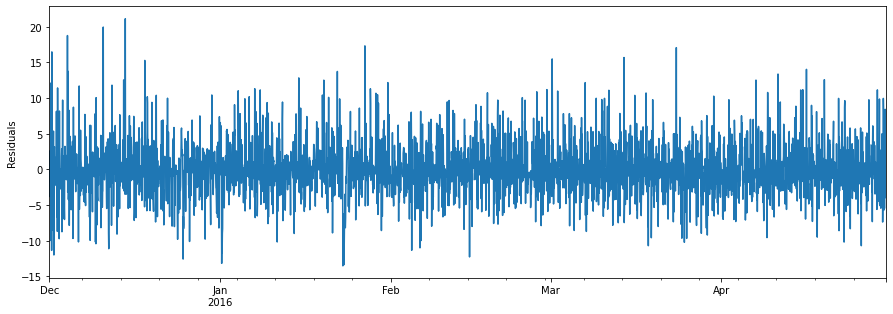

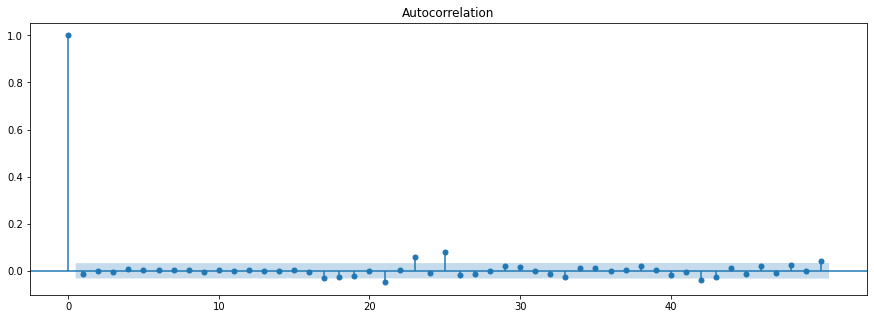

Критерий Стьюдента: p=0.56
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=1.00


In [355]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [356]:
dump(best_model.resid, 'dumps/sarmx_resid_1.joblib')
best_model = None

#### Кластер 2.

In [357]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_2)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_2:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_2['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param

        
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)

    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

#     # остановка по времени выполнения, 2 часа
#     if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
#         print("TIME LIMIT EXCEEDED -> STOPPED")
#         break

Всего параметров к перебору:  168
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 8078
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
3 - (0, 1, 0, 1, 1, 0) ...START -> Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   19     50     64      1     0     0   4.386D-04   2.698D+00
  F =   2.6980158897279205     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           18     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.01209D+00    |proj g|=  3.45862D-01

At iterat

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This pr

DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
30 - (2, 1, 1, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
31 - (2, 1, 1, 1, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
32 - (2, 1, 1, 1, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
33 - (2, 1, 2, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
34 - (2, 1, 2, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
35 - (2, 1, 2, 1, 1, 0) ...START ->  N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.48065D+00    |proj g|=  6.31992D-02

At iterate    5    f=  3.36512D+00    |proj g|=  5.52611D-02

At iterate   10    f=  3.35536D+00    |proj g|=  1.40740D-03

At iterate   

In [358]:
dump(best_param, 'dumps/orders_2.joblib')
dump(best_model.params, 'dumps/params_2.joblib')

['dumps/params_2.joblib']

In [359]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           reg_resid   No. Observations:                 3648
Model:             SARIMAX(13, 1, 1)x(1, 1, 1, 24)   Log Likelihood              -11881.733
Date:                             Mon, 08 Aug 2022   AIC                          23797.467
Time:                                     23:25:28   BIC                          23902.783
Sample:                                 12-01-2015   HQIC                         23834.987
                                      - 04-30-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2698      0.014     19.774      0.000       0.243       0.297
ar.L2          0.0607      0.015      3.933      0.000       0.030       0.091
ar.L3          0.0512      0.017      3.037      0.002       0.018       0.084
ar.L4          0.0258      0.017      1.555      0.120      -0.007       0.058
ar.L5          0.0306      0.017      1.752      0.080      -0.004       0.065
ar.L6         -0.0183      0.019     -0.984      0.325      -0.055       0.018
ar.L7          0.0032      0.018      0.174      0.862      -0.033       0.039
ar.L8          0.0861      0.019      4.585      0.000       0.049       0.123
ar.L9          0.0388      0.019      2.031      0.042       0.001       0.076
ar.L10        -0.0138      0.018     -0.752      0.452      -0.050       0.022
ar.L11        -0.0428      0.019     -2.221      0.026      -0.081      -0.005
ar.L12        -0.0213      0.019     -1.134      0.257      -0.058       0.015
ar.L13         0.0450      0.018      2.531      0.011       0.010       0.080
ma.L1         -0.9997      0.008   -118.212      0.000      -1.016      -0.983
ar.S.L24       0.1572      0.016      9.980      0.000       0.126       0.188
ma.S.L24      -0.9594      0.006   -173.566      0.000      -0.970      -0.949
sigma2        40.6003      0.865     46.923      0.000      38.904      42.296
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               170.64
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.83   Skew:                             0.11
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

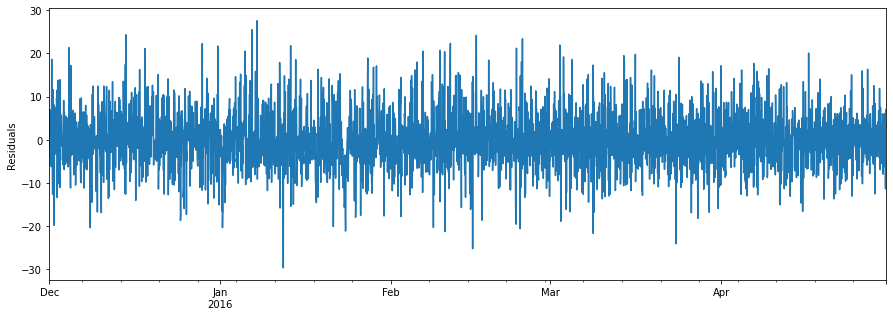

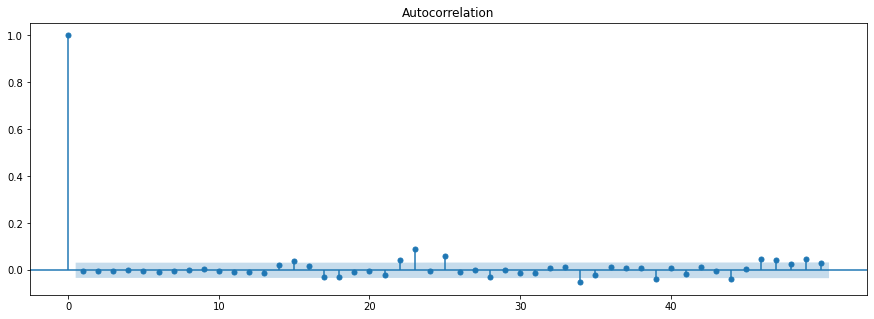

Критерий Стьюдента: p=0.87
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=0.90


In [360]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [361]:
dump(best_model.resid, 'dumps/sarmx_resid_2.joblib')
best_model = None

#### Кластер 3.

In [362]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_3)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_3:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_3['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param

        
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)
    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

#     # остановка по времени выполнения, 2 часа
#     if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
#         print("TIME LIMIT EXCEEDED -> STOPPED")
#         break

Всего параметров к перебору:  112
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 7530
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
3 - (0, 1, 0, 1, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
4 - (0, 1, 0, 1, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
5 - (0, 1, 1, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
6 - (0, 1, 1, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected b

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstraine

Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     50     75      1     0     0   8.547D-05   2.478D+00
  F =   2.4782238104803231     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.69819D+00    |proj g|=  1.15104D-01

At iterate    5    f=  2.66739D+00    |proj g|=  3.60911D-02

At iterate   10    f=  2.66044D+00    |proj g|=  8.91607D-03

At iterate   15    f=  2.65521D+00    |proj g|=  1.15850D-02

At iterate   20    f=  2.65266D+00    |proj g|=  1.52615D-02

At iterate   25    f=  2.64503D+00    |proj g|=  1.03413D-02

At iterate   30    f=  2.64300D+00    |proj g|=  3.05847D-03

At iterate   35    f=  2

In [363]:
dump(best_param, 'dumps/orders_3.joblib')
dump(best_model.params, 'dumps/params_3.joblib')

['dumps/params_3.joblib']

In [364]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          reg_resid   No. Observations:                 3648
Model:             SARIMAX(7, 1, 1)x(1, 1, 1, 24)   Log Likelihood               -9035.720
Date:                            Tue, 09 Aug 2022   AIC                          18093.439
Time:                                    02:16:00   BIC                          18161.585
Sample:                                12-01-2015   HQIC                         18117.717
                                     - 04-30-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2832      0.010     29.414      0.000       0.264       0.302
ar.L2          0.1276      0.013     10.061      0.000       0.103       0.152
ar.L3          0.0115      0.014      0.839      0.402      -0.015       0.038
ar.L4          0.0668      0.016      4.246      0.000       0.036       0.098
ar.L5          0.0341      0.016      2.172      0.030       0.003       0.065
ar.L6          0.0673      0.016      4.143      0.000       0.035       0.099
ar.L7          0.0318      0.016      1.968      0.049       0.000       0.063
ma.L1         -0.9995      0.007   -135.412      0.000      -1.014      -0.985
ar.S.L24       0.0522      0.013      3.983      0.000       0.027       0.078
ma.S.L24      -1.0000      1.858     -0.538      0.590      -4.641       2.641
sigma2         8.2813     15.352      0.539      0.590     -21.809      38.371
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             20772.02
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.01   Skew:                             1.68
Prob(H) (two-sided):                  0.89   Kurtosis:                        14.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

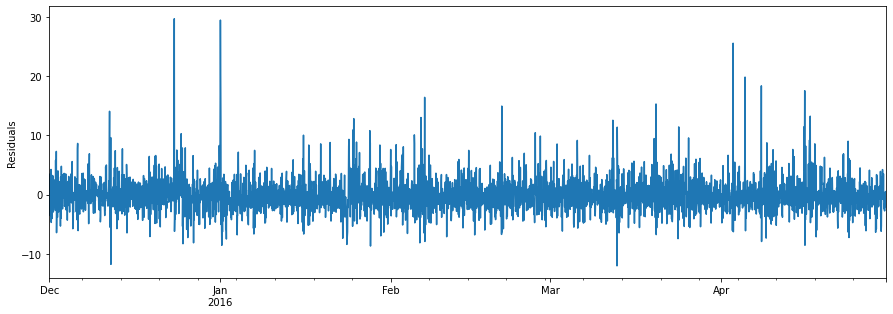

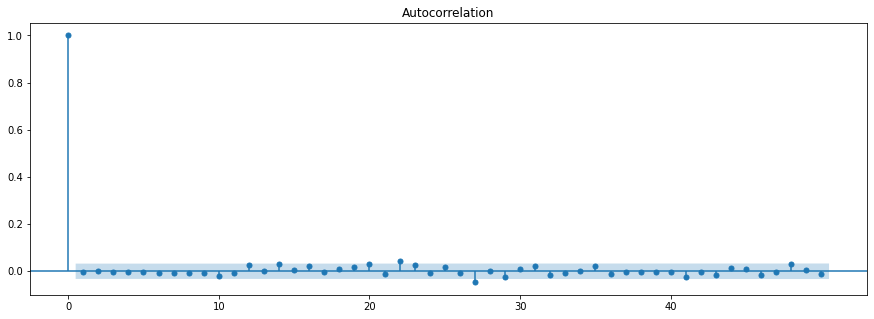

Критерий Стьюдента: p=0.21
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=0.98


In [365]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [366]:
dump(best_model.resid, 'dumps/sarmx_resid_3.joblib')
best_model = None

#### Кластер 4.

In [367]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_4)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_4:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_4['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
        
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)
    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

#     # остановка по времени выполнения, 2 часа
#     if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
#         print("TIME LIMIT EXCEEDED -> STOPPED")
#         break

Всего параметров к перебору:  128
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 7371
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START ->            * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15      9     12      1     0     0   5.961D-06   2.658D+00
  F =   2.6583613876386281     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           16     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.63974D+00    |proj g|=  7.90226D-02

At iterate    5    f=  2.51730D+00    |proj g|=  3.04770D-02

At iterate   10    f=  2.49446D+00    |proj g|=  7.64600D-03

At iterate   15    f=  2.49156D+00    |proj g|=  1.26244D-02

At iterate   20    f=  2.49122D+00    |proj g|=  7.69051D-04

At iterate   25    f=  2.49

In [368]:
dump(best_param, 'dumps/orders_4.joblib')
dump(best_model.params, 'dumps/params_4.joblib')

['dumps/params_4.joblib']

In [369]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           reg_resid   No. Observations:                 3648
Model:             SARIMAX(14, 1, 1)x(1, 1, 1, 24)   Log Likelihood              -15996.773
Date:                             Tue, 09 Aug 2022   AIC                          32029.546
Time:                                     05:57:18   BIC                          32141.057
Sample:                                 12-01-2015   HQIC                         32069.273
                                      - 04-30-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1670      0.014     11.617      0.000       0.139       0.195
ar.L2          0.0622      0.015      4.062      0.000       0.032       0.092
ar.L3          0.0161      0.016      1.023      0.306      -0.015       0.047
ar.L4          0.0065      0.017      0.386      0.699      -0.026       0.039
ar.L5          0.0161      0.017      0.966      0.334      -0.017       0.049
ar.L6          0.0403      0.017      2.375      0.018       0.007       0.074
ar.L7          0.0705      0.015      4.573      0.000       0.040       0.101
ar.L8          0.0790      0.016      4.858      0.000       0.047       0.111
ar.L9          0.0410      0.016      2.585      0.010       0.010       0.072
ar.L10         0.0265      0.016      1.627      0.104      -0.005       0.058
ar.L11         0.0233      0.018      1.326      0.185      -0.011       0.058
ar.L12         0.0203      0.017      1.168      0.243      -0.014       0.054
ar.L13         0.0346      0.017      2.090      0.037       0.002       0.067
ar.L14         0.0330      0.016      2.009      0.044       0.001       0.065
ma.L1         -0.9989      0.003   -345.021      0.000      -1.005      -0.993
ar.S.L24       0.1265      0.017      7.625      0.000       0.094       0.159
ma.S.L24      -0.9449      0.006   -146.483      0.000      -0.958      -0.932
sigma2       395.7269      7.471     52.970      0.000     381.084     410.369
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               247.77
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                             0.20
Prob(H) (two-sided):                  0.16   Kurtosis:                         4.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

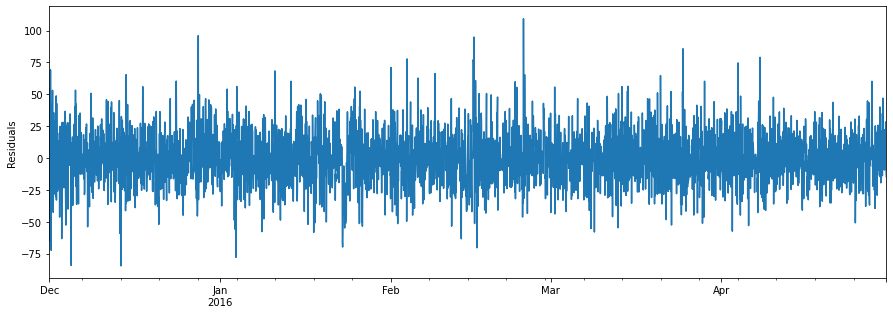

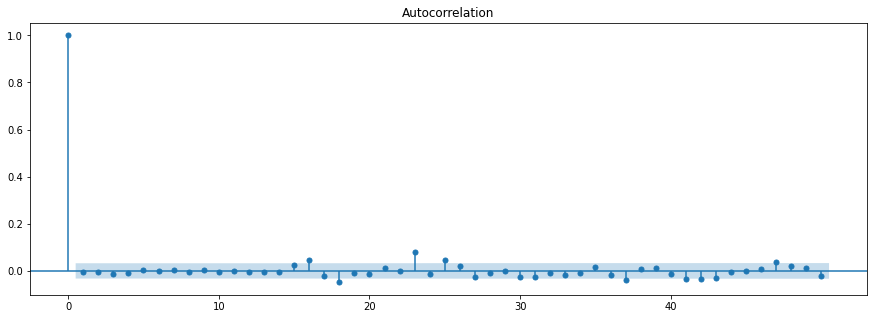

Критерий Стьюдента: p=0.33
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=0.99


In [370]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [371]:
dump(best_model.resid, 'dumps/sarmx_resid_4.joblib')
best_model = None

#### Кластер 5.

In [372]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_5)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_5:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_5['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
        
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)
    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

    # остановка по времени выполнения, 2 часа
    if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
        print("TIME LIMIT EXCEEDED -> STOPPED")
        break

Всего параметров к перебору:  1632
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 8082
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START -> At iterate    5    f=  4.44842D+00    |proj g|=  2.75341D-02

At iterate   10    f=  4.40801D+00    |proj g|=  6.49028D-02

At iterate   15    f=  4.40167D+00    |proj g|=  2.15731D-03

At iterate   20    f=  4.40166D+00    |proj g|=  1.37918D-04

At iterate   25    f=  4.40165D+00    |proj g|=  3.55521D-03

At iterate   30    f=  4.39424D+00    |proj g|=  1.66982D-02

At iterate   35    f=  4.39387D+00    |proj g|=  5.07427D-04

At iterate   40    f=  4.39385D+00    |proj g|=  2.19063D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at fina

In [373]:
dump(best_param, 'dumps/orders_5.joblib')
dump(best_model.params, 'dumps/params_5.joblib')

['dumps/params_5.joblib']

In [374]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                            reg_resid   No. Observations:                 3648
Model:             SARIMAX(0, 1, 6)x(1, 1, [1], 24)   Log Likelihood              -13443.372
Date:                              Tue, 09 Aug 2022   AIC                          26904.745
Time:                                      07:57:40   BIC                          26960.500
Sample:                                  12-01-2015   HQIC                         26924.608
                                       - 04-30-2016                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5546      0.006    -88.666      0.000      -0.567      -0.542
ma.L2         -0.3268      0.014    -23.612      0.000      -0.354      -0.300
ma.L3         -0.0387      0.020     -1.943      0.052      -0.078       0.000
ma.L4         -0.0429      0.025     -1.716      0.086      -0.092       0.006
ma.L5          0.0005      0.029      0.017      0.986      -0.056       0.057
ma.L6         -0.0364      0.029     -1.275      0.202      -0.092       0.020
ar.S.L24       0.0502      0.008      6.183      0.000       0.034       0.066
ma.S.L24      -0.9718      0.003   -300.056      0.000      -0.978      -0.965
sigma2        95.7110      0.652    146.738      0.000      94.433      96.989
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            121271.97
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.64   Skew:                             3.48
Prob(H) (two-sided):                  0.00   Kurtosis:                        30.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

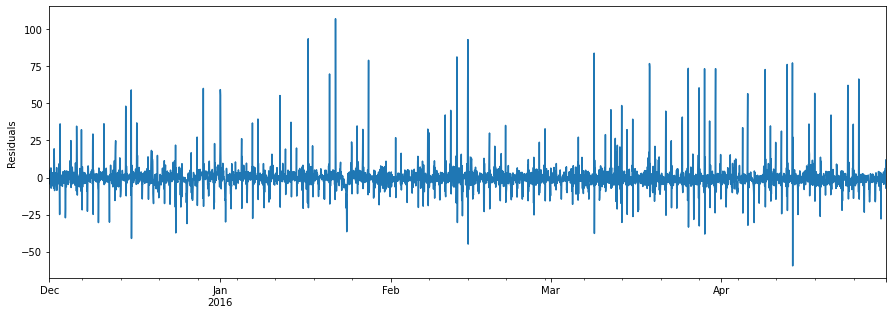

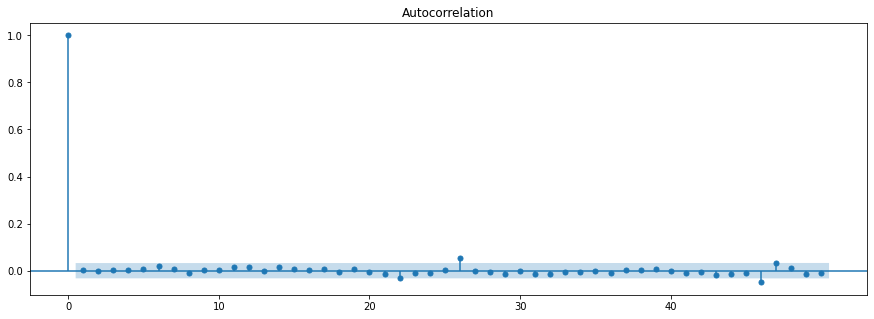

Критерий Стьюдента: p=0.48
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=1.00


In [375]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [376]:
dump(best_model.resid, 'dumps/sarmx_resid_5.joblib')
best_model = None

#### Кластер 6.

In [377]:
warnings.filterwarnings("ignore")
print('Всего параметров к перебору: ', str(len(parameters_6)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_6:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_6['reg_resid'], order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
          
        model = None
        n = gc.collect()
        print("Number of unreachable objects collected by GC:", n)
        print("Uncollectable garbage:", gc.garbage)
    
    model = None
    n = gc.collect()
    print("Number of unreachable objects collected by GC:", n)
    print("Uncollectable garbage:", gc.garbage)

#     # остановка по времени выполнения, 2 часа
#     if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
#         print("TIME LIMIT EXCEEDED -> STOPPED")
#         break

Всего параметров к перебору:  104
1 - (0, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 7525
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
2 - (0, 1, 0, 0, 1, 1) ...START ->            * * *

Machine precision = 2.220D-16
 N =           16     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.85490D+00    |proj g|=  7.26213D-02

At iterate    5    f=  3.74387D+00    |proj g|=  5.15982D-02

At iterate   10    f=  3.68985D+00    |proj g|=  3.37811D-03

At iterate   15    f=  3.68824D+00    |proj g|=  1.45353D-02

At iterate   20    f=  3.68477D+00    |proj g|=  5.92357D-03

At iterate   25    f=  3.68465D+00    |proj g|=  1.22019D-04

At iterate   30    f=  3.68463D+00    |proj g|=  1.52746D-03

At iterate   35    f=  3.68453D+00    |proj g|=  4.56178D-04

At iterate   40    f=  3.68451D+00    |proj g|=  3.23161D-04

At iterate   45    f=  3.68451D+00    |

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search directi

DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
13 - (1, 1, 1, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
14 - (1, 1, 1, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
15 - (1, 1, 1, 1, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
16 - (1, 1, 1, 1, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 29
Uncollectable garbage: []
Number of unreachable objects collected by GC: 0
Uncollectable garbage: []
17 - (2, 1, 0, 0, 1, 0) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
18 - (2, 1, 0, 0, 1, 1) ...START -> DONE
Number of unreachable objects collected by GC: 114
Uncollectable garbage: []
19 - (2, 1, 0, 1, 1, 0) ...START -> DONE
Number of unreachable

In [378]:
dump(best_param, 'dumps/orders_6.joblib')
dump(best_model.params, 'dumps/params_6.joblib')

['dumps/params_6.joblib']

In [379]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          reg_resid   No. Observations:                 3648
Model:             SARIMAX(5, 1, 1)x(0, 1, 1, 24)   Log Likelihood               -9815.488
Date:                            Tue, 09 Aug 2022   AIC                          19646.975
Time:                                    10:10:06   BIC                          19696.536
Sample:                                12-01-2015   HQIC                         19664.632
                                     - 04-30-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3192      0.009     33.743      0.000       0.301       0.338
ar.L2          0.1165      0.012      9.489      0.000       0.092       0.141
ar.L3          0.0650      0.012      5.350      0.000       0.041       0.089
ar.L4          0.0382      0.016      2.450      0.014       0.008       0.069
ar.L5          0.0378      0.016      2.418      0.016       0.007       0.068
ma.L1         -0.9997      0.005   -187.806      0.000      -1.010      -0.989
ma.S.L24      -0.9130      0.005   -183.680      0.000      -0.923      -0.903
sigma2        13.0088      0.127    102.183      0.000      12.759      13.258
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             74034.53
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.03   Skew:                             2.27
Prob(H) (two-sided):                  0.59   Kurtosis:                        24.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

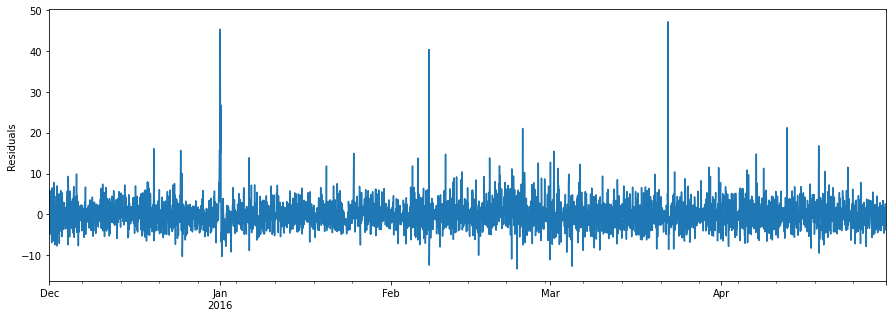

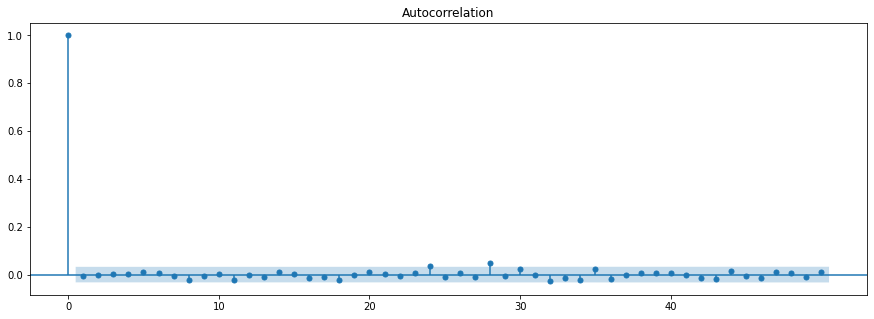

Критерий Стьюдента: p=0.82
Критерий Дики-Фуллера: p=0.00
Критерий Льюнга-Бокса: p=1.00


In [380]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[9])))

In [381]:
dump(best_model.resid, 'dumps/sarmx_resid_6.joblib')
best_model = None

### Построение прогнозов на май 2016г.

Для каждого конца истории от 2016.04.30 23:00 до 2016.05.31 17:00 построим прогноз на 6 часов вперёд и посчитаем ошибку прогноза по следующему функционалу:

Сперва построим графики и посчитаем ошибки для 7 выше рассмотренных зон.

Кластер 0 ... 20:26


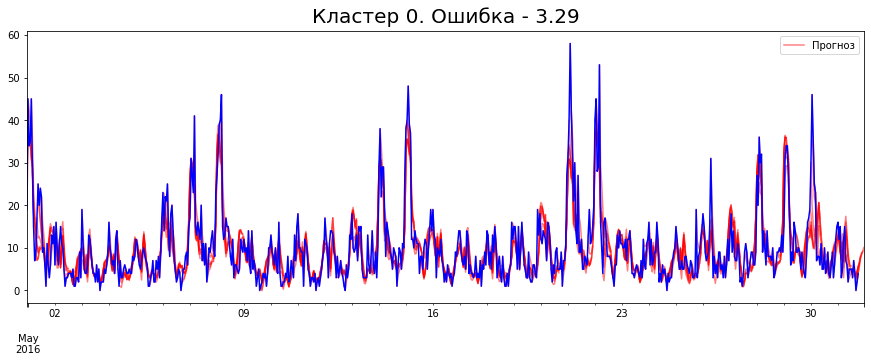

Кластер 1 ... 20:26


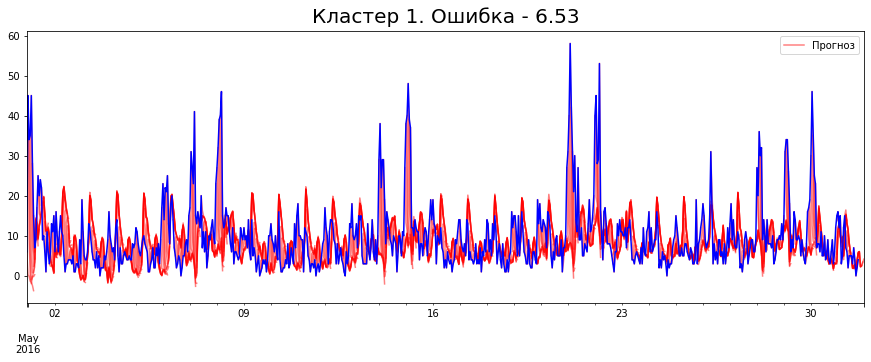

Кластер 2 ... 20:28


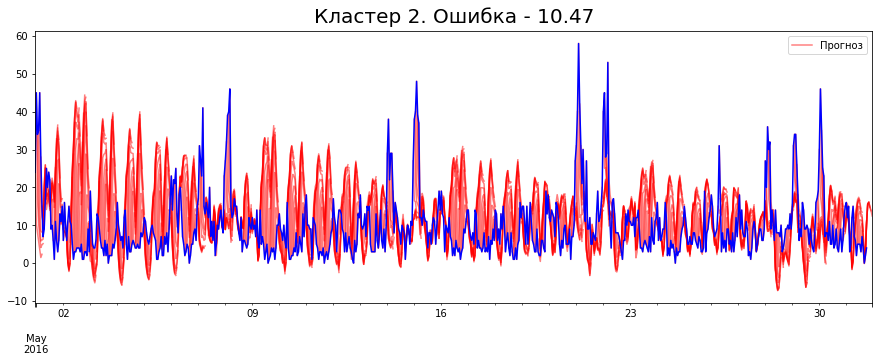

Кластер 3 ... 20:29


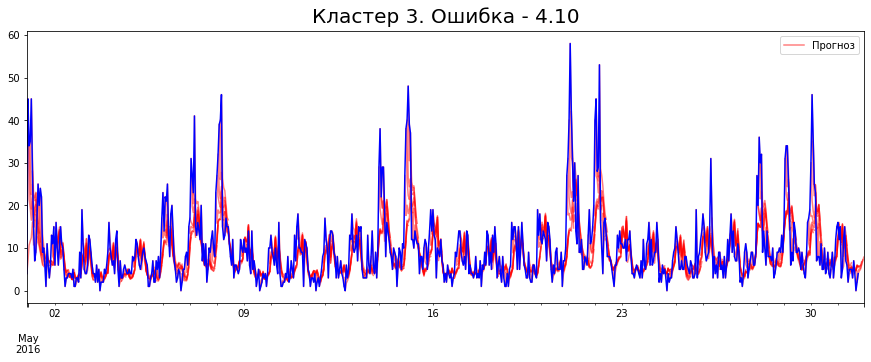

Кластер 4 ... 20:29


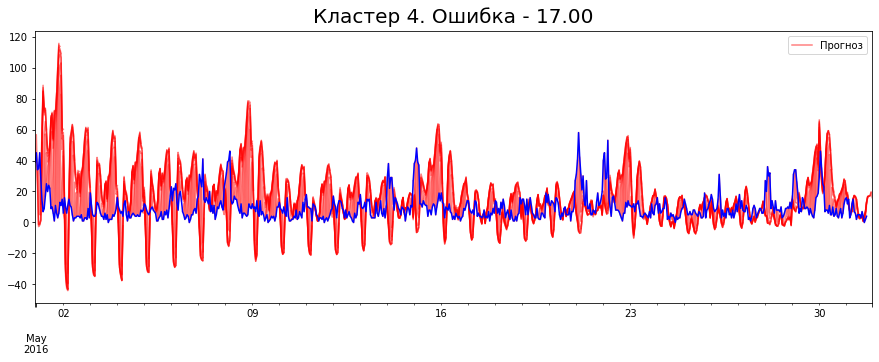

Кластер 5 ... 20:31


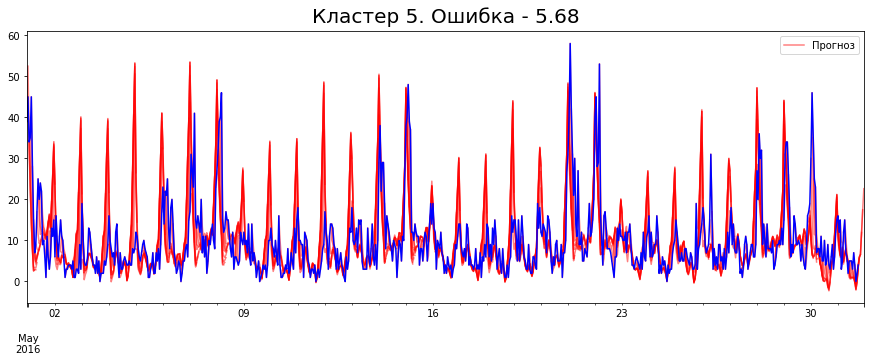

Кластер 6 ... 20:31


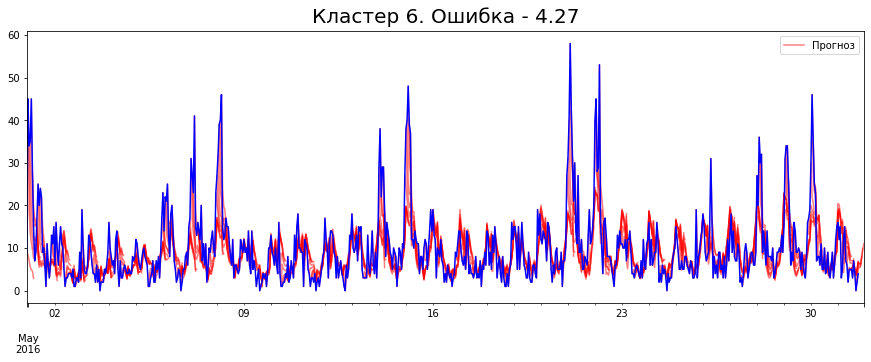

CPU times: user 14min 48s, sys: 7min 15s, total: 22min 3s
Wall time: 6min 38s


In [67]:
%%time
warnings.filterwarnings('ignore')

regs_err = dict()

ERR = 0
target_data = may_data[may_data.region==target_cells[tp]].iloc[:, 5:].transpose()
target_data.columns = ['trips']
for tp in target_cells:
    
    print('Кластер {} ...'.format(tp), datetime.datetime.now().strftime('%H:%M'))
        
    CLUSTER_ERR = 0
    fig, ax = plt.subplots(figsize=(15, 5))
    
    params = load('dumps/params_{}.joblib'.format(tp))
    orders = load('dumps/orders_{}.joblib'.format(tp))
    reg_model = load('dumps/reg_model_{}.joblib'.format(tp))
    
    # Предскажем остатки от регрессии.
    cell_data = dec_apr_data[dec_apr_data.region == target_cells[tp]].iloc[:, 5:].transpose()
    cell_data.columns = ['trips']
    feature_columns = add_features(cell_data, 20)
    _ = add_features(target_data, 20, cell_data.shape[0] + 1)
    cell_data = cell_data.append(target_data)
    cell_data['reg_pred'] = reg_model.predict(np.array(cell_data[feature_columns]))
    cell_data['reg_resid'] = np.array(cell_data.trips) - np.array(cell_data.reg_pred)
    
    # SARIMAX
    srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                     order=(orders[0], orders[1], orders[2]), 
                                     seasonal_order=(orders[3], orders[4], orders[5], 24)).filter(params)
    
    start_hour = datetime.datetime(2016, 4, 30, 23)
    start_plot_hour = start_hour
    ax.set_xlim([start_hour - datetime.timedelta(hours=3), None])

    red_patch = mpatches.Patch(color='red', label='Прогноз')
    blue_patch = mpatches.Patch(color='blue', label='Данные')
    ax.legend(handles=[red_patch, blue_patch])
    
    for i in range(739):
        
        first_hour = start_hour + datetime.timedelta(hours=1)
        six_hour = start_hour + datetime.timedelta(hours=6)
        
        # Предсказываем
        srmx_pred = srmx.predict(start=first_hour, end=six_hour, dynamic=True)
        sum_pred = cell_data.reg_pred.loc[first_hour:six_hour] + srmx_pred
        
        #Печатаем.
        cell_data.trips.loc[start_hour:start_hour].append(sum_pred).plot(ax=ax, color='r', alpha=0.5)
        
        # Считаем ошибку.
        y = cell_data.trips.loc[first_hour:six_hour] 
        CLUSTER_ERR += abs(np.array(y) - np.array(sum_pred)).sum()
        
        start_hour = start_hour + datetime.timedelta(hours=1)
    
    srmx = None
    regs_err[target_cells[tp]] = CLUSTER_ERR
    
    end_plot_hour = start_hour
    cell_data.trips.loc[start_plot_hour:end_plot_hour].plot(ax=ax, color='b')
    ax.set_title('Кластер {}. Ошибка - {:.2f}'.format(tp, CLUSTER_ERR / ((i+1) * 6)), fontsize=20, y=1.01)
    cell_data = None
    plt.show()
dump(regs_err, 'dumps/regs_err_may.joblib')
warnings.filterwarnings('default')

В целом, все очень даже не плохо, косячит 2 и 4 кластер.

In [68]:
def go_region(regions, dec_apr_data, may_data, reg_info, dict_filename, proc_num):
    regs_err = dict()
    if os.path.exists(dict_filename):
        regs_err = load(dict_filename)
    for region in regions:
        if region in regs_err:
            continue
        f_time = datetime.datetime.now().strftime('%H:%M')
        cell_data = dec_apr_data[dec_apr_data.region==region].iloc[:, 5:].transpose()
        cell_data.columns = ['trips']
        target_cell = may_data[may_data.region==region].iloc[:, 5:].transpose()
        target_cell.columns = ['trips']        
        
        cluster = np.array(reg_info[reg_info.region==region].cluster)[0]
        
        params = load('dumps/params_{}.joblib'.format(cluster))
        orders = load('dumps/orders_{}.joblib'.format(cluster))
        reg_model = load('dumps/reg_model_{}.joblib'.format(cluster))
    
        
        feature_columns = add_features(cell_data, 20)
        _ = add_features(target_cell, 20, cell_data.shape[0]+1)
        cell_data = cell_data.append(target_cell)
        cell_data['reg_pred'] = reg_model.predict(np.array(cell_data[feature_columns]))
        cell_data['reg_resid'] = np.array(cell_data.trips) - np.array(cell_data.reg_pred)
        
        # SARIMAX
        srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                         order=(orders[0], orders[1], orders[2]), 
                                         seasonal_order=(orders[3], orders[4], orders[5], 24)).filter(params)
        
        start_hour = datetime.datetime(2016, 4, 30, 23)
        
        now_reg_err = 0
        
        for i in range(739):
            
            first_hour = start_hour + datetime.timedelta(hours=1)
            six_hour = start_hour + datetime.timedelta(hours=6)
            
            # Предсказываем
            srmx_pred = srmx.predict(start=first_hour, end=six_hour, dynamic=True)
            sum_pred = cell_data.reg_pred.loc[first_hour:six_hour] + srmx_pred
            
            # Считаем ошибку.
            y = cell_data.trips.loc[first_hour:six_hour] 
            now_reg_err += abs(np.array(y) - np.array(sum_pred)).sum()
            start_hour = start_hour + datetime.timedelta(hours=1)
        
        regs_err[region] = now_reg_err
        dump(regs_err, dict_filename)
        print('Process {}:  {}/{}  {}. Now {} region...DONE. {}'.format(proc_num, 
                                                                        len(regs_err), 
                                                                        len(regions), 
                                                                        f_time, 
                                                                        region, 
                                                                        datetime.datetime.now().strftime('%H:%M')))
        srmx = None
        cell_data = None
    print('PROCESS {} - ALL DONE!'.format(proc_num))

In [69]:
import multiprocessing

In [70]:
warnings.filterwarnings('ignore')
data = pd.read_csv('all_count.csv', sep=',', header=0, 
               date_parser=lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
dates = [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in data.columns[5:]]

dec_apr_data = data[list(data.columns[:5]) + 
                    get_dates_names(dates, '2015-12-01 00:00:00', '2016-05-01 00:00:00')]
dec_apr_data.columns = list(dec_apr_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in dec_apr_data.columns[5:]]
may_data = data[list(data.columns[:5]) + 
                get_dates_names(dates, '2016-05-01 00:00:00', '2016-06-01 00:00:00')]
may_data.columns = list(may_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in may_data.columns[5:]]


reg_info = pd.read_csv('reg_info.csv')
regions = np.array(reg_info.region)
regions_1 = regions[::4]
regions_2 = regions[1::4]
regions_3 = regions[2::4]
regions_4 = regions[3::4]
dict_filename_1 = 'dumps/regs_err_may_1.joblib'
dict_filename_2 = 'dumps/regs_err_may_2.joblib'
dict_filename_3 = 'dumps/regs_err_may_3.joblib'
dict_filename_4 = 'dumps/regs_err_may_4.joblib'
p1 = multiprocessing.Process(target=go_region, args=(regions_1, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_1, 1))
p2 = multiprocessing.Process(target=go_region, args=(regions_2, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_2, 2))
p3 = multiprocessing.Process(target=go_region, args=(regions_3, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_3, 3))
p4 = multiprocessing.Process(target=go_region, args=(regions_4, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_4, 4))


p1.start()
p2.start()
p3.start()
p4.start()
p1.join()
p4.join()
p2.join()
p3.join()
warnings.filterwarnings('default')

PROCESS 1 - ALL DONE!
PROCESS 2 - ALL DONE!
PROCESS 3 - ALL DONE!
PROCESS 4 - ALL DONE!


In [77]:
regs_err = load('dumps/regs_err_may_1.joblib')
ERR = sum([regs_err[i] for i in regs_err])
regs_err = load('dumps/regs_err_may_2.joblib')
ERR += sum([regs_err[i] for i in regs_err])
regs_err = load('dumps/regs_err_may_3.joblib')
ERR += sum([regs_err[i] for i in regs_err])
regs_err = load('dumps/regs_err_may_4.joblib')
ERR += sum([regs_err[i] for i in regs_err])
ERR = ERR / (102 * 739 * 6)
print()
print('ОШИБКА В МАЕ - {:.3f}'.format(ERR))


ОШИБКА В МАЕ - 32.040


### Перенастройка SARIMAX на данные с декабря по май для дальнейшего прогнозирования июня

In [74]:
dec_may_data = data[list(data.columns[:5]) + 
                    get_dates_names(dates, '2015-12-01 00:00:00', '2016-06-01 00:00:00')]
dec_may_data.columns = list(dec_may_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in dec_may_data.columns[5:]]
june_data = data[list(data.columns[:5]) + 
                 get_dates_names(dates, '2016-06-01 00:00:00', '2016-07-01 00:00:00')]
june_data.columns = list(june_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in june_data.columns[5:]]

In [75]:
K = 20
target_cells = load('dumps/target_cells.joblib')
for cluster in target_cells:
    
    print('Кластер {} ...'.format(cluster), datetime.datetime.now().strftime('%H:%M'))
    
    cell_data = dec_may_data[dec_may_data.region==target_cells[cluster]].iloc[:, 5:].transpose()
    cell_data.columns = ['trips']
    features_columns = add_features(cell_data, K)
    
    # Перенастроим регрессию.
    reg_model = get_reg_pred(cell_data, features_columns)
    dump(reg_model, 'dumps/reg_model_{}_june.joblib'.format(cluster))
    
    # Перенастроим SARIMAX.
    orders = load('dumps/orders_{}.joblib'.format(cluster))
    
    srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                         order=(orders[0], orders[1], orders[2]), 
                                         seasonal_order=(orders[3], orders[4], orders[5], 24)).fit(maxiter=10)
    dump(srmx.params, 'dumps/params_{}_june.joblib'.format(cluster))

Кластер 0 ... 20:34
Кластер 1 ... 20:35
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.16844D+00    |proj g|=  5.71030D-02

At iterate    5    f=  3.04852D+00    |proj g|=  6.60938D-02

At iterate   10    f=  3.03153D+00    |proj g|=  2.81519D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     10     14      1     0     0   2.815D-02   3.032D+00
  F =   3.0315314710170145     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

   

### Подсчет ошибки, запись результатов предсказаний июня 2016 года

In [1]:
warnings.filterwarnings('ignore')
#out = 'id,y'
dec_may_data['cluster'] = km_preds
june_data['cluster'] = km_preds

kaggle_arima_dict = dict()

if os.path.exists('dumps/kaggle_arima_dict.joblib'):
    kaggle_arima_dict = load('dumps/kaggle_arima_dict.joblib')

print('{} / 102 '.format(len(kaggle_arima_dict)), datetime.datetime.now().strftime('%H:%M'))
    
for cluster in target_cells:
    
    cluster_data = dec_may_data[dec_may_data.cluster==cluster]
    
    cluster_data.drop(columns=['cluster', 'type'], inplace=True, errors='ignore')
    regs = np.array(cluster_data.region)
    
    target_data = june_data[june_data.cluster==cluster]
    target_data.drop(columns=['cluster', 'type'], inplace=True, errors='ignore')
    
    params = load('dumps/params_{}_june.joblib'.format(cluster))
    orders = load('dumps/orders_{}.joblib'.format(cluster))
    reg_model = load('dumps/reg_model_{}_june.joblib'.format(cluster))
    
    for j in regs:
        
        if j in kaggle_arima_dict:
            continue
        
        kaggle_arima_dict[j] = []
        
        kaggle_id = str(int(j))
        
        cell_data = cluster_data[cluster_data.region==j].iloc[:, 5:].transpose()
        cell_data.columns = ['trips']
        
        target_cell = target_data[target_data.region==j].iloc[:, 5:].transpose()
        target_cell.columns = ['trips']
        
        feature_columns = add_features(cell_data, 20)
        _ = add_features(target_cell, 20, cell_data.shape[0]+1)
        cell_data = cell_data.append(target_cell)
        cell_data['reg_pred'] = reg_model.predict(np.array(cell_data[feature_columns]))
        cell_data['reg_resid'] = np.array(cell_data.trips) - np.array(cell_data.reg_pred)
        
        # SARIMAX
        srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                         order=(orders[0], orders[1], orders[2]), 
                                         seasonal_order=(orders[3], orders[4], orders[5], 24)).filter(params)
        
        start_hour = datetime.datetime(2016, 5, 31, 23)
        
        now_err = 0
        
        for i in range(715):
            
            kaggle_date = start_hour.strftime('%Y-%m-%d')
            kaggle_hour = str(start_hour.hour)
        
            first_hour = start_hour + datetime.timedelta(hours=1)
            six_hour = start_hour + datetime.timedelta(hours=6)
            
            # Предсказываем
            srmx_pred = srmx.predict(start=first_hour, end=six_hour, dynamic=True)
            sum_pred = cell_data.reg_pred.loc[first_hour:six_hour] + srmx_pred
            
            # Kaggle.
            for k in range(6):
                kaggle_step = str(k+1)
                kaggle_pred = str(sum_pred[k])
                res = '_'.join([kaggle_id, kaggle_date, kaggle_hour, kaggle_step])
                res += ','
                res += kaggle_pred
                kaggle_arima_dict[j].append(res)
                print(f"kaggle_arima_dict: {kaggle_arima_dict}")
            
            # Считаем ошибку.
            y = cell_data.trips.loc[first_hour:six_hour]
            now_err += abs(np.array(y) - np.array(sum_pred)).sum()
            
            start_hour = start_hour + datetime.timedelta(hours=1)
        
        kaggle_arima_dict[j].append(now_err)
        dump(kaggle_arima_dict, 'dumps/kaggle_arima_dict.joblib')
        print('{} / 102 '.format(len(kaggle_arima_dict)), datetime.datetime.now().strftime('%H:%M'))
        srmx = None
        cell_data = None

warnings.filterwarnings('default')

In [2]:
# kaggle_arima_dict = load('dumps/kaggle_arima_dict.joblib')
# out = 'id,y'
# for i in kaggle_arima_dict:
#     out += '\n'
#     out += '\n'.join(kaggle_arima_dict[i][:-1])
    
# with open('kaggle_arima.csv', 'w') as f:
#     f.write(out)

In [3]:
# len(kaggle_arima_dict[1075]) * 102

### Kaggle. Оценка предсказательной способности

Ссылка на сабмишн.
https://www.kaggle.com/c/yellowtaxi  
Ошибка составила: соревнование закрыто, скор не считается